In [1]:
import os
os.environ['TF_USE_LEGACY_KERAS'] = '1'

In [2]:
import pandas as pd
import numpy as np

import os
import re
import json
import random
import requests
from datetime import datetime
import json
import csv
from copy import deepcopy
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
from skmultilearn.model_selection import iterative_train_test_split

In [3]:
JSON_MAP = {
    "m_17":"10_LateralMovement",
    "m_7":"ImpactScore",
    "m_18":"11_Collection",
    "m_13":"06_PrivilegeEscalation",
    "m_8":"01_Reconnaissance",
    "m_10":"03_InitialAccess",
    "m_14":"07_DefenseEvasion",
    "m_9":"02_ResourceDevelopment",
    "m_5":"BaseScore",
    "m_21":"14_Impact",
    "m_4":"Vector",
    "m_11":"04_Execution",
    "m_15":"08_CredentialAccess",
    "m_20":"13_Exfiltration",
    "m_6":"ExploitabilityScore",
    "m_19":"12_CommandAndControl",
    "m_16":"09_Discovery",
    "m_12":"05_Persistence"
}

JSON_MAP_REVERSE = {v: k for k, v in JSON_MAP.items()}

CATEGORY = {
    'Reconnaissance': [
                       'Active Scanning',
                       'Gather Victim Host Information', 
                       'Gather Victim Identity Information', 
                       'Gather Victim Network Information', 
                       'Gather Victim Org Information',
                       'Phishing for Information',
                       'Search Closed Sources',
                       'Search Open Technical Databases',
                       'Search Open Websites/Domains','Search Victim-Owned Websites'
    ],
    'Resource Development': [
                             'Acquire Infrastructure',
                             'Compromise Accounts',
                             'Compromise Infrastructure',
                             'Develop Capabilities',
                             'Establish Accounts',
                             'Obtain Capabilities',
                             'Stage Capabilities'  
    ],
    'Initial Access': [
                       'Drive-by Compromise',
                       'Exploit Public-Facing Application',
                       'External Remote Services',
                       'Hardware Additions',
                       'Phishing',
                       'Replication Through Removable Media',
                       'Supply Chain Compromise',
                       'Trusted Relationship',
                       'Valid Accounts'
    ],
    'Execution': [
                  'Command and Scripting Interpreter',
                  'Container Administration Command',
                  'Deploy Container',
                  'Exploitation for Client Execution',
                  'Inter-Process Communication',
                  'Native API',
                  'Scheduled Task/Job',
                  'Shared Modules',
                  'Software Deployment Tools',
                  'System Services',
                  'User Execution',
                  'Windows Management Instrumentation'
    ],
    'Persistence': [
                    'Account Manipulation',
                    'BITS Jobs',
                    'Boot or Logon Autostart Execution',
                    'Boot or Logon Initialization Scripts',
                    'Browser Extensions',
                    'Compromise Client Software Binary',
                    'Create Account',
                    'Create or Modify System Process',
                    'Event Triggered Execution',
                    'External Remote Services',
                    'Hijack Execution Flow',
                    'Implant Internal Image',
                    'Modify Authentication Process'
                    'Office Application Startup',
                    'Pre-OS Boot',
                    'Scheduled Task/Job',
                    'Server Software Component',
                    'Traffic Signaling',
                    'Valid Accounts'
    ],
    'Privilege Escalation': [
                             'Abuse Elevation Control Mechanism',
                             'Access Token Manipulation',
                             'Boot or Logon Autostart Execution',
                             'Boot or Logon Initialization Scripts',
                             'Create or Modify System Process',
                             'Domain Policy Modification',
                             'Escape to Host',
                             'Event Triggered Execution',
                             'Exploitation for Privilege Escalation',
                             'Hijack Execution Flow',
                             'Process Injectio',
                             'Scheduled Task/Job',
                             'Valid Accounts'
    ],
    'Defense Evasion': [
                        'Abuse Elevation Control Mechanism',
                        'Access Token Manipulation',
                        'BITS Jobs',
                        'Build Image on Host',
                        'Debugger Evasion',
                        'Deobfuscate/Decode Files or Information',
                        'Deploy Container',
                        'Direct Volume Access',
                        'Domain Policy Modification',
                        'Execution Guardrails',
                        'Exploitation for Defense Evasion',
                        'File and Directory Permissions Modification',
                        'Hide Artifacts',
                        'Hijack Execution Flow',
                        'Impair Defenses',
                        'Indicator Removal on Host',
                        'Indirect Command Execution',
                        'Masquerading',
                        'Modify Authentication Process',
                        'Modify Cloud Compute Infrastructure',
                        'Modify Registry',
                        'Modify System Image',
                        'Network Boundary Bridging',
                        'Obfuscated Files or Information',
                        'Plist File Modification',
                        'Pre-OS Boot',
                        'Process Injection',
                        'Reflective Code Loading',
                        'Rogue Domain Controller',
                        'Rootkit',
                        'Subvert Trust Controls',
                        'System Binary Proxy Execution',
                        'System Script Proxy Execution',
                        'Template Injection',
                        'Traffic Signaling',
                        'Trusted Developer Utilities Proxy Execution',
                        'Unused/Unsupported Cloud Regions',
                        'Use Alternate Authentication Material',
                        'Valid Accounts',
                        'Virtualization/Sandbox Evasion',
                        'Weaken Encryption',
                        'XSL Script Processing'
    ],
    'Credential Access': [
                          'Adversary-in-the-Middle',
                          'Brute Force',
                          'Credentials from Password Stores',
                          'Exploitation for Credential Access',
                          'Forced Authentication',
                          'Forge Web Credentials',
                          'Input Capture',
                          'Modify Authentication Process',
                          'Multi-Factor Authentication Interception',
                          'Multi-Factor Authentication Request Generation',
                          'Network Sniffing',
                          'OS Credential Dumping',
                          'Steal Application Access Token',
                          'Steal or Forge Kerberos Tickets',
                          'Steal Web Session Cookie',
                          'Unsecured Credentials',
    ],
    'Discovery': [
                  'Account Discovery',
                  'Application Window Discovery',
                  'Browser Bookmark Discovery',
                  'Cloud Infrastructure Discovery',
                  'Cloud Service Dashboard',
                  'Cloud Service Discovery',
                  'Cloud Storage Object Discovery',
                  'Container and Resource Discovery',
                  'Debugger Evasion',
                  'Domain Trust Discovery',
                  'File and Directory Discovery',
                  'Group Policy Discovery',
                  'Network Service Discovery',
                  'Network Share Discovery',
                  'Network Sniffing',
                  'Password Policy Discovery',
                  'Peripheral Device Discovery',
                  'Permission Groups Discovery',
                  'Process Discovery',
                  'Query Registry',
                  'Remote System Discovery',
                  'Software Discovery',
                  'System Information Discovery',
                  'System Location Discovery',
                  'System Network Configuration Discovery',
                  'System Network Connections Discovery',
                  'System Owner/User Discovery',
                  'System Service Discovery',
                  'System Time Discovery',
                  'Virtualization/Sandbox Evasion'
    ],
    'Lateral Movement': [
                         'Exploitation of Remote Services',
                         'Internal Spearphishing',
                         'Lateral Tool Transfer',
                         'Remote Service Session Hijacking',
                         'Remote Services',
                         'Replication Through Removable Media',
                         'Software Deployment Tools',
                         'Taint Shared Content',
                         'Use Alternate Authentication Material'
    ],
    'Collection': [
                   'Adversary-in-the-Middle',
                   'Archive Collected Data',
                   'Audio Capture',
                   'Automated Collection',
                   'Browser Session Hijacking',
                   'Clipboard Data',
                   'Data from Cloud Storage Object',
                   'Data from Configuration Repository',
                   'Data from Information Repositories',
                   'Data from Local System',
                   'Data from Network Shared Drive',
                   'Data from Removable Media',
                   'Data Staged',
                   'Email Collection',
                   'Input Capture', 
                   'Screen Capture',
                   'Video Capture'
    ],
    'Command and Control': [
                            'Application Layer Protocol',
                            'Communication Through Removable Media',
                            'Data Encoding',
                            'Data Obfuscation',
                            'Dynamic Resolution',
                            'Encrypted Channel', 
                            'Fallback Channels',
                            'Ingress Tool Transfer',
                            'Multi-Stage Channels',
                            'Non-Application Layer Protocol',
                            'Non-Standard Port',
                            'Protocol Tunneling',
                            'Proxy',
                            'Remote Access Software',
                            'Traffic Signaling',
                            'Web Service'
    ],
    'Exfiltration': [
                     'Automated Exfiltration', 
                     'Data Transfer Size Limits', 
                     'Exfiltration Over Alternative Protocol',
                     'Exfiltration Over C2 Channel', 
                     'Exfiltration Over Other Network Medium', 
                     'Exfiltration Over Physical Medium', 
                     'Exfiltration Over Web Service', 
                     'Scheduled Transfer', 
                     'Transfer Data to Cloud Account'
    ],
    'Impact': [
               'Account Access Removal',
               'Data Destruction',
               'Data Encrypted for Impact',
               'Data Manipulation',
               'Defacement',
               'Disk Wipe',
               'Endpoint Denial of Service',
               'Firmware Corruption',
               'Inhibit System Recovery',
               'Network Denial of Service',
               'Resource Hijacking',
               'Service Stop',
               'System Shutdown/Reboot'
    ]
}


TECHNIQUES = set()

for tactic in CATEGORY.keys():
  for technique in CATEGORY[tactic]:
    TECHNIQUES.add(technique)

In [4]:
len(TECHNIQUES)

192

In [5]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [6]:
(X_train, y_train) = load_data_from_file('/kaggle/input/input-files/X_train.csv', '/kaggle/input/input-files/y_train.csv')

(X_train_extended, y_train_extended) = load_data_from_file('/kaggle/input/input-files/final_extended_X_train.csv', '/kaggle/input/input-files/final_extended_y_train.csv')

(X_test, y_test) = load_data_from_file('/kaggle/input/input-files/X_test.csv', '/kaggle/input/input-files/y_test.csv')

pd.set_option('display.max_colwidth', None)


Format the data

In [7]:
def keep_relevant_techniques(Y, threshold):
  Y_count = Y.apply(np.sum, axis=0)
  columns_to_keep = Y_count[Y_count >= threshold].index
  return Y[columns_to_keep]

def remove_irrelevant_CVE(X, Y):
  is_CVE_used = Y.apply(lambda row: np.bitwise_or.reduce(row.values), axis = 1)
  indexes_to_keep = list(is_CVE_used[is_CVE_used == 1].index)
  X_final = X.loc[indexes_to_keep]
  Y_final = Y.loc[indexes_to_keep]

  X_final.reset_index(inplace=True, drop=True)
  Y_final.reset_index(inplace=True, drop=True)

  return (X_final, Y_final)

def filter_input_data(X, Y, threshold):
  return remove_irrelevant_CVE(X, keep_relevant_techniques(Y, threshold))



In [8]:
# 1. Start with extended data
X, Y = X_train_extended, y_train_extended

# # 2. Apply filtering (removes rare techniques + irrelevant CVEs)
X, Y = filter_input_data(X, Y, threshold=20)

# 3. Convert to numpy arrays for iterative split
X_arr, Y_arr = X.to_numpy(), Y.values

# 4. Iterative stratified split (preserves label distribution)
from skmultilearn.model_selection import iterative_train_test_split

X_train_arr, y_train_arr, X_test_arr, y_test_arr = iterative_train_test_split(
    X_arr, Y_arr, test_size=0.2
)


In [9]:
X_train = pd.DataFrame(X_train_arr, columns=['Name', 'Text'])
X_test = pd.DataFrame(X_test_arr, columns=['Name', 'Text'])
y_train = pd.DataFrame(y_train_arr, columns=Y.columns)
y_test = pd.DataFrame(y_test_arr, columns=Y.columns)

In [10]:
def save_the_splitted_data_to_csv(X_train, X_test, y_train, y_test):
  X_train.to_csv('/kaggle/working/X_train.csv', index=False)
  X_test.to_csv('/kaggle/working/X_test.csv', index=False)
  y_train.to_csv('/kaggle/working/y_train.csv', index=False)
  y_test.to_csv('/kaggle/working/y_test.csv', index=False)

In [11]:
def plot_labels_count(Y):
  Y_count = Y.apply(np.sum, axis=0)
  ax = Y_count.sort_values(ascending=False).plot.bar(x='lab', y='val', rot=0)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)
  fig = plt.gcf()

  fig.set_size_inches(20.5, 8.5)

In [12]:
!pip install -q textattack

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 45.5 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 49.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 445.7/445.7 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 98.9 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.5 MB/s eta 0:00:00:00:0

In [13]:
import tensorflow as tf
# from textattack.augmentation import EmbeddingAugmenter
# from textattack.augmentation import WordNetAugmenter
# from textattack.augmentation import CLAREAugmenter
from textattack.augmentation import EasyDataAugmenter

2025-09-24 05:25:46.652529: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758691546.997667      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758691547.098078      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
textattack: Updating TextAttack package dependencies.
textattack: Downloading NLTK required packages.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downlo

In [14]:
def get_text_from_X_y(X_examples, y_examples):
  def f(index):
    targeted_CVE = y_examples[y_examples[index] == 1].index
    return [(X_examples.iloc[target], y_examples.iloc[target], target) for target in targeted_CVE]
  return f

def get_only_representative_text(X_train, y_train):
  nr_tech_per_CVE = y_train.apply(np.sum, axis = 1)

  def get_representative_CVE(col):
    representative_index = list(col[col == 1].index)
    representative_index = list(filter(lambda ind : nr_tech_per_CVE[ind] == 1, representative_index))
    return representative_index
  
  representative_CVE_list = y_train.apply(get_representative_CVE, axis = 0)
  def f(index):
    targeted_CVE = representative_CVE_list[index]
    return [(X_train.iloc[target], y_train.iloc[target], target) for target in targeted_CVE]
  return f

def augument_existing_data(X_train, y_train, get_base_text, skip_name=None, skip_X=None, skip_y=None):
    if skip_name is None:
        new_y_train = y_train
        new_X_train = X_train
    else:
        new_y_train = skip_y
        new_X_train = skip_X

    Y_count = y_train.apply(np.sum, axis=0)
    sorted_Y = Y_count.sort_values(ascending=False)
    max_value = None
    continue_skipping = True
    if skip_name is None:
        continue_skipping = False

    for index in sorted_Y.index:
        print(index)
        if max_value is None:
            max_value = sorted_Y[index]
        else:
            if skip_name == index:
                continue_skipping = False
            if not continue_skipping:
                new_X_train.to_csv('/kaggle/working/extended_X_train_' + index + '.csv', index=False)
                new_y_train.to_csv('/kaggle/working/extended_y_train_' + index + '.csv', index=False)
            else:
                continue

            current_value = sorted_Y[index]
            if max_value / current_value >= 2:
                targeted_CVE = get_base_text(index)

                if len(targeted_CVE) > 0:
                    multiple = int((max_value - current_value) / len(targeted_CVE))
                else:
                    multiple = 0
                    continue
                if multiple > 10:
                    multiple = 10

                aug = EasyDataAugmenter(transformations_per_example=multiple)

                for target in targeted_CVE:
                    print(target[2])
                    augumented_text_for_CVE = aug.augment(target[0]['Text'])
                    cnt = 0
                    for text in augumented_text_for_CVE:
                        # ✅ wrap dicts in DataFrame
                        new_row_X = pd.DataFrame([{
                            'Name': target[0]['Name'] + "_augumented_" + str(cnt),
                            'Text': text
                        }])
                        # handle y as DataFrame/Series/dict
                        if isinstance(target[1], dict):
                            new_row_y = pd.DataFrame([target[1]])
                        elif isinstance(target[1], pd.Series):
                            new_row_y = target[1].to_frame().T
                        else:  # already DataFrame
                            new_row_y = target[1]

                        new_X_train = pd.concat([new_X_train, new_row_X], ignore_index=True)
                        new_y_train = pd.concat([new_y_train, new_row_y], ignore_index=True)

                        cnt += 1

    return (new_X_train, new_y_train)



In [15]:
X_examples = pd.DataFrame(columns=X_train.columns)
y_examples = pd.DataFrame(columns=y_train.columns)

def parse_techniques_example(row):
    new_row_X = pd.DataFrame([{
        'Name': "example_" + str(row.name),
        'Text': row['Description']
    }])

    new_row_y = pd.DataFrame([{
        row['Technique']: 1
    }])

    global X_examples, y_examples
    X_examples = pd.concat([X_examples, new_row_X], ignore_index=True)
    y_examples = pd.concat([y_examples, new_row_y], ignore_index=True)

# after processing
y_examples.fillna(0, inplace=True)
y_examples = y_examples.astype(int)


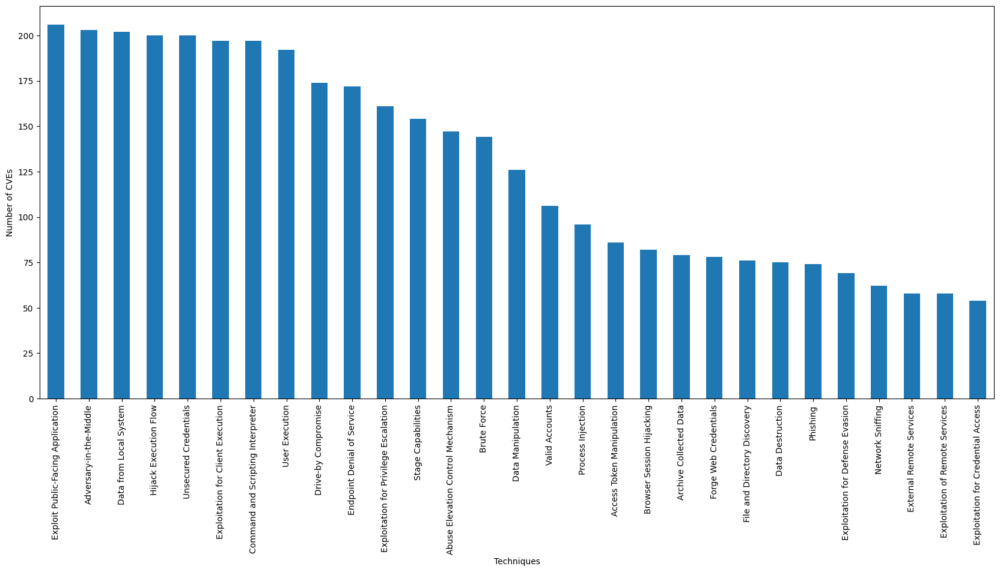

In [16]:
final_X_train = pd.concat([X_train, X_examples], ignore_index=True)
final_y_train = pd.concat([y_train, y_examples], ignore_index=True)

plot_labels_count(final_y_train)

In [17]:
(augumented_X_train, augumented_y_train) = augument_existing_data(final_X_train, final_y_train, get_text_from_X_y(X_examples, y_examples))

Exploit Public-Facing Application
Adversary-in-the-Middle
Data from Local System
Hijack Execution Flow
Unsecured Credentials
Exploitation for Client Execution
Command and Scripting Interpreter
User Execution
Drive-by Compromise
Endpoint Denial of Service
Exploitation for Privilege Escalation
Stage Capabilities
Abuse Elevation Control Mechanism
Brute Force
Data Manipulation
Valid Accounts
Process Injection
Access Token Manipulation
Browser Session Hijacking
Archive Collected Data
Forge Web Credentials
File and Directory Discovery
Data Destruction
Phishing
Exploitation for Defense Evasion
Network Sniffing
External Remote Services
Exploitation of Remote Services
Exploitation for Credential Access


In [18]:
(phising_X, phishing_y) = load_data_from_file('/kaggle/working/extended_X_train_Phishing.csv', '/kaggle/working/extended_y_train_Phishing.csv')
(augumented_X_train, augumented_y_train) = augument_existing_data(X_train, 
                                                                  y_train, 
                                                                  get_only_representative_text(X_train, y_train),
                                                                  'Phishing',
                                                                  phising_X,
                                                                  phishing_y)

Exploit Public-Facing Application
Adversary-in-the-Middle
Data from Local System
Hijack Execution Flow
Unsecured Credentials
Exploitation for Client Execution
Command and Scripting Interpreter
User Execution
Drive-by Compromise
Endpoint Denial of Service
Exploitation for Privilege Escalation
Stage Capabilities
Abuse Elevation Control Mechanism
Brute Force
Data Manipulation
Valid Accounts
Process Injection
Access Token Manipulation
Browser Session Hijacking
Archive Collected Data
Forge Web Credentials
File and Directory Discovery
Data Destruction
Phishing


[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...


503
514
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
Exploitation for Defense Evasion
12


[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


734
735
2366
2367
2368
2369
2370
2371
2372
2373
2374
2375
2376
2377
2378
2379
2380
2381
2382
2383
2384
2385
2386
2387
2388
2389
2390
2391
2392
2393
2394
2395
2396
2397
2398
2399
2400
2401
2402
2403
2404
2405
2406
2407
2408
2409
2410
2411
2412
2413
2414
Network Sniffing


[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


91
700
969
2734
2735
2736
2737
2738
2739
2740
2741
2742
2743
2744
2745
2746
2747
2748
2749
2750
2751
2752
2753
2754
2755
2756
2757
2758
2759
2760
2761
2762
2763
2764
2765
2766
2767
2768
2769
2770
2771
2772
2773
2774
2775
2776
2777
2778
2779
2780
2781
2782
External Remote Services
554


[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
Exploitation of Remote Services
730


[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


731
965
2415
2416
2417
2418
2419
2420
2421
2422
2423
2424
2425
2426
2427
2428
2429
2430
2431
2432
2433
2434
2435
2436
2437
2438
2439
2440
2441
2442
2443
2444
2445
2446
2447
2448
2449
2450
2451
2452
2453
2454
2455
Exploitation for Credential Access
13


[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


737
960
2783
2784
2785
2786
2787
2788
2789
2790
2791
2792
2793
2794
2795
2796
2797
2798
2799
2800
2801
2802
2803
2804
2805
2806
2807
2808
2809
2810
2811
2812
2813
2814
2815
2816
2817
2818
2819
2820
2821


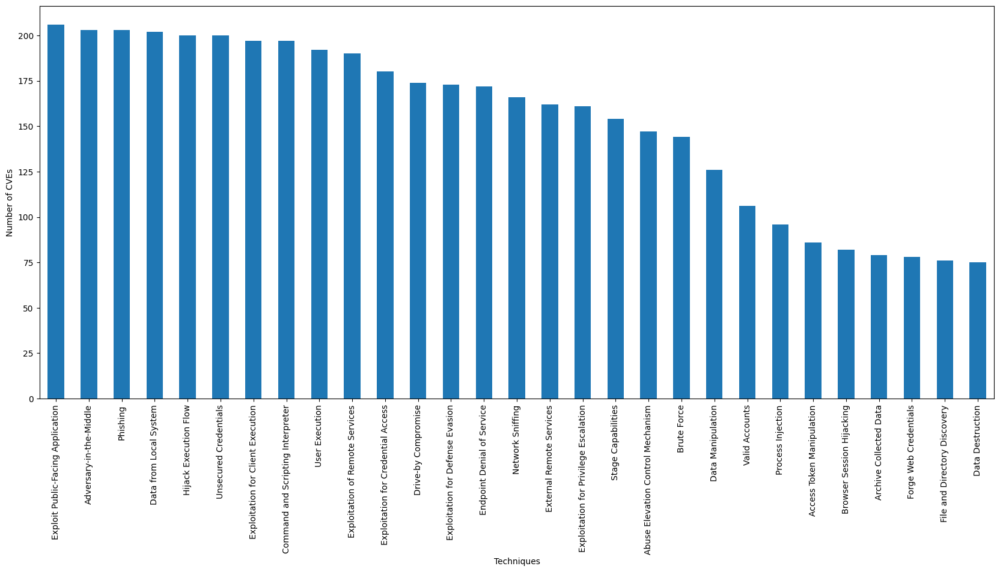

In [19]:
plot_labels_count(augumented_y_train)

In [20]:
augumented_X_train.to_csv('/kaggle/working/final_extended_X_train.csv', index=False)
augumented_y_train.to_csv('/kaggle/working/final_extended_y_train.csv', index=False)

In [21]:
!pip install spacy
!python -m spacy download en_core_web_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 1.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-fft to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-random to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-umath to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 92.5 MB/s eta 0:00:00:00:010:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency

In [22]:
import spacy

# Load the English language model
nlp = spacy.load("en_core_web_sm")


In [23]:

def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and token.is_alpha ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens

def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


def print_confusion_matrix(cf_matrix):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title('Seaborn Confusion Matrix with labels\n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()


def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()



def plot_grid_search(cv_results, name_param_1, name_param_2, score_m, limit=None):
    results_df = pd.DataFrame(cv_results)
    results_df = results_df.assign(
        param1=results_df["params"].apply(lambda x: x[name_param_1])
    )
    results_df = results_df.assign(
        param2=results_df["params"].apply(lambda x: x[name_param_2])
    )
    plot = sns.lineplot(data=results_df, x="param1", y=score_m, hue="param2")
    plot.set(xlabel=name_param_1, ylabel=score_m)
    plot.legend(title=name_param_2)
    if limit is not None:
      plot.set_xlim(left=0, right=limit)

In [24]:
def plot_grid_search3D(cv_results, name_param_1, name_param_2, name_param_3, score_m, limit=None):
    results_df = pd.DataFrame(cv_results)
    results_df = results_df.assign(
        param1=results_df["params"].apply(lambda x: x[name_param_1])
    )
    results_df = results_df.assign(
        param2=results_df["params"].apply(lambda x: x[name_param_2])
    )
    results_df = results_df.assign(
        param3=results_df["params"].apply(lambda x: x[name_param_3])
    )

    fig = plt.figure(figsize=(6,6))
    ax = Axes3D(fig)
    fig.add_axes(ax)

    # get colormap from seaborn
    cmap = ListedColormap(sns.color_palette("hls", 8))

    # plot
    sc = ax.scatter(xs=results_df['param1'], ys=results_df['param2'], zs=results_df[score_m], s=40, c=results_df['param3'], marker='o', cmap=cmap, alpha=1)
    ax.set_xlabel(name_param_1)
    ax.set_ylabel(name_param_2)
    ax.set_zlabel("Accuracy")

    # legend
    plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

In [25]:
# pip install scikit-multilearn


Multi-Output BERT

In [26]:

# !pip install -q transformers

In [27]:
import pandas as pd
#######################################
### -------- Load libraries ------- ###

# Load Huggingface transformers
from transformers import TFBertModel,  BertConfig, BertTokenizerFast
import seaborn as sns

# Then what you need from tensorflow.keras
from tensorflow.keras.layers import Input, Dropout, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy, BinaryCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy, BinaryAccuracy
from tensorflow.keras.utils import to_categorical

# And pandas for data import + sklearn because you allways need sklearn
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score, multilabel_confusion_matrix


In [28]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)
     

In [29]:
(X_train, y_train) = load_data_from_file('/kaggle/input/input-files/X_train.csv', '/kaggle/input/input-files/y_train.csv')

(X_train_extended, y_train_extended) = load_data_from_file('/kaggle/input/input-files/final_extended_X_train.csv', '/kaggle/input/input-files/final_extended_y_train.csv')

(X_test, y_test) = load_data_from_file('/kaggle/input/input-files/X_test.csv', '/kaggle/input/input-files/y_test.csv')

pd.set_option('display.max_colwidth', None)


In [30]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens

In [31]:

def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [32]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [33]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()
     

Train

In [34]:
#######################################
### --------- Setup BERT ---------- ###

# Name of the BERT model to use
model_name = 'bert-base-uncased'

# Max length of tokens
max_length = 350

# Load transformers config and set output_hidden_states to False
config = BertConfig.from_pretrained(model_name)
config.output_hidden_states = False

# Load BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained(pretrained_model_name_or_path = model_name, config = config)

# Load the Transformers BERT model
transformer_model = TFBertModel.from_pretrained(model_name, config = config)


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

I0000 00:00:1758692350.713631      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1758692350.714298      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPre

In [35]:
#original
# #######################################
# ### ------- Build the model ------- ###

# # TF Keras documentation: https://www.tensorflow.org/api_docs/python/tf/keras/Model

# # Load the MainLayer
# bert = transformer_model.layers[0]

# # Build your model input
# input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
# # attention_mask = Input(shape=(max_length,), name='attention_mask', dtype='int32') 
# # inputs = {'input_ids': input_ids, 'attention_mask': attention_mask}
# inputs = {'input_ids': input_ids}

# # Load the Transformers BERT model as a layer in a Keras model
# bert_model = bert(input_ids)[1]
# dropout = Dropout(config.hidden_dropout_prob, name='pooled_output')
# pooled_output = dropout(bert_model, training=False)

# # Then build your model output
# outputs = {}
# for col in y_train.columns:
#     col_name = col.replace(' ', '')
#     new_layer = Dense(units=2, kernel_initializer=TruncatedNormal(stddev=config.initializer_range), name=col_name)(pooled_output)
#     outputs[col] = new_layer

# # And combine it all in a model object
# model = Model(inputs=inputs, outputs=outputs, name='BERT_MultiLabel')

# # Take a look at the model
# model.summary()

In [36]:
# Method 1: Check the config object you already have
print("BERT hidden size from config:", config.hidden_size)

# Method 2: Check the transformer model structure
print("Transformer model summary:")
print(transformer_model.summary())

# Method 3: Look at the bert layer specifically
print("BERT layer (main layer) info:")
bert = transformer_model.layers[0]
print(f"BERT layer: {bert}")

# Method 4: If you want to be absolutely sure, create a dummy input and test
import numpy as np
dummy_input = {'input_ids': np.ones((1, max_length), dtype=np.int32)}
try:
    bert_output = bert(dummy_input)
    print(f"BERT output shapes: {[output.shape for output in bert_output]}")
    print(f"Pooled output shape (what we need): {bert_output[1].shape}")
except Exception as e:
    print(f"Direct test failed: {e}")

# Method 5: Check the model config directly
print(f"Model config hidden size: {transformer_model.config.hidden_size}")

BERT hidden size from config: 768
Transformer model summary:
Model: "tf_bert_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bert (TFBertMainLayer)      multiple                  109482240 
                                                                 
Total params: 109482240 (417.64 MB)
Trainable params: 109482240 (417.64 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
BERT layer (main layer) info:
BERT layer: <transformers.models.bert.modeling_tf_bert.TFBertMainLayer object at 0x7dd4c34fa310>
Direct test failed: 'str' object has no attribute 'shape'
Model config hidden size: 768


In [37]:

#######################################
### ------- Build the model ------- ###

# TF Keras documentation: https://www.tensorflow.org/api_docs/python/tf/keras/Model

# Load the MainLayer
bert = transformer_model.layers[0]

# Build your model input
input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
# attention_mask = Input(shape=(max_length,), name='attention_mask', dtype='int32') 
# inputs = {'input_ids': input_ids, 'attention_mask': attention_mask}
inputs = {'input_ids': input_ids}

# Load the Transformers BERT model as a layer in a Keras model
bert_model = bert(input_ids)[1]
dropout = Dropout(config.hidden_dropout_prob, name='pooled_output')
pooled_output = dropout(bert_model, training=False)

# Then build your model output
outputs = {}
for col in y_train.columns:
    col_name = col.replace(' ', '')
    new_layer = Dense(units=2, kernel_initializer=TruncatedNormal(stddev=config.initializer_range), name=col_name)(pooled_output)
    outputs[col] = new_layer

# And combine it all in a model object
model = Model(inputs=inputs, outputs=outputs, name='BERT_MultiLabel')

# Take a look at the model
model.summary()

Model: "BERT_MultiLabel"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_ids (InputLayer)      [(None, 350)]                0         []                            
                                                                                                  
 bert (TFBertMainLayer)      TFBaseModelOutputWithPooli   1094822   ['input_ids[0][0]']           
                             ngAndCrossAttentions(last_   40                                      
                             hidden_state=(None, 350, 7                                           
                             68),                                                                 
                              pooler_output=(None, 768)                                           
                             , past_key_values=None, hi                             

In [38]:
import tensorflow as tf
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))
import tensorflow as tf
tf.debugging.set_log_device_placement(True)


Num GPUs Available: 2


In [39]:
from tensorflow.keras.optimizers import legacy

In [41]:
#######################################
### ------- Train the model ------- ###

# # Set an optimizer
# optimizer = Adam(
#     learning_rate=6e-05,
#     epsilon=1e-07,
#     # decay=0.01,
#     clipnorm=1.0)
from tensorflow.keras.optimizers import legacy

optimizer = legacy.Adam(
    learning_rate=6e-05,
    epsilon=1e-07,
    decay=0.01,
    clipnorm=1.0)

# Set loss and metrics
loss = {}
metric = {}
for col in y_train.columns:
    loss[col] = CategoricalCrossentropy(from_logits = True)
    metric[col] = CategoricalAccuracy ('accuracy')

# Compile the model
model.compile(
    optimizer = optimizer,
    loss = loss, 
    metrics = metric)

y = {}
for col in y_train.columns:
    y[col] = to_categorical(y_train[col].values)

# Tokenize the input (takes some time)
x = tokenizer(
    text=X_train['Text'].to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = True,
    verbose = True)

# Fit the model
history = model.fit(
    # x={'input_ids': x['input_ids'], 'attention_mask': x['attention_mask']},
    x={'input_ids': x['input_ids']},
    y=y,
    validation_split=0.2,
    batch_size=16,
    epochs=50)


Epoch 1/50
68/68 [==============================] - 146s 2s/step - loss: 8.3443 - AbuseElevationControlMechanism_loss: 0.1960 - AccessTokenManipulation_loss: 0.1801 - Adversary-in-the-Middle_loss: 0.2331 - ArchiveCollectedData_loss: 0.1032 - BrowserSessionHijacking_loss: 0.2519 - BruteForce_loss: 0.2345 - CommandandScriptingInterpreter_loss: 0.5121 - CreateAccount_loss: 0.1703 - DataDestruction_loss: 0.2243 - DataManipulation_loss: 0.2819 - DatafromLocalSystem_loss: 0.3164 - Drive-byCompromise_loss: 0.3269 - EndpointDenialofService_loss: 0.4410 - ExploitPublic-FacingApplication_loss: 0.5277 - ExploitationforClientExecution_loss: 0.5059 - ExploitationforCredentialAccess_loss: 0.1850 - ExploitationforDefenseEvasion_loss: 0.2221 - ExploitationforPrivilegeEscalation_loss: 0.4886 - ExploitationofRemoteServices_loss: 0.1852 - ExternalRemoteServices_loss: 0.2096 - FileandDirectoryDiscovery_loss: 0.2597 - ForgeWebCredentials_loss: 0.1620 - HijackExecutionFlow_loss: 0.3243 - NetworkSniffing_los

In [42]:
#######################################
### ----- Evaluate the model ------ ###

test_x = tokenizer(
    text=X_test['Text'].to_list(),
    add_special_tokens=True,
    padding='max_length',          # replace pad_to_max_length
    max_length=max_length,
    truncation=True,
    return_tensors='tf',
    return_token_type_ids=False,
    return_attention_mask=False,
    verbose=True
)
# Run evaluation
model_eval = model.predict(
    x={'input_ids':test_x['input_ids']},
)

10/10 [==============================] - 13s 819ms/step


In [43]:
predicted_y = pd.DataFrame(columns=y_train.columns)
for col in model_eval:
  result = []
  for el in model_eval[col]:
    if el[0] > el[1]:
      result.append(0)
    else:
      result.append(1)
  predicted_y[col] = result

In [44]:

print(accuracy_score(y_test.values, predicted_y))

0.09779179810725552


In [45]:

print("F1 Score")
compute_metrics(predicted_y, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Drive-by Compromise,Command and Scripting Interpreter,Exploit Public-Facing Application,Adversary-in-the-Middle,Exploitation for Client Execution,Browser Session Hijacking,Valid Accounts,File and Directory Discovery,...,Data Manipulation,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Brute Force,User Execution,Unsecured Credentials,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.769231,0.48,0.473684,0.45614,0.42623,0.4,0.282051,0.266667,0.212766,0.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
print("Recall Score")
compute_metrics(predicted_y, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploit Public-Facing Application,Exploitation for Privilege Escalation,Drive-by Compromise,Adversary-in-the-Middle,Browser Session Hijacking,Exploitation for Client Execution,Valid Accounts,File and Directory Discovery,...,Data Manipulation,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Brute Force,User Execution,Unsecured Credentials,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.740741,0.42623,0.4,0.36,0.333333,0.25,0.181818,0.180328,0.151515,0.111111,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [47]:

print("Precision Score")
compute_metrics(predicted_y, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Adversary-in-the-Middle,File and Directory Discovery,Drive-by Compromise,Endpoint Denial of Service,Exploitation for Privilege Escalation,Exploitation for Client Execution,Browser Session Hijacking,Hijack Execution Flow,Command and Scripting Interpreter,Exploit Public-Facing Application,...,Data Manipulation,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Brute Force,User Execution,Unsecured Credentials,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,1.0,1.0,0.818182,0.8,0.72,0.647059,0.5,0.5,0.490566,0.45614,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
print(f1_score(y_test.values, predicted_y, average='weighted'))
     

0.28546205465186647


In [49]:
print(recall_score(y_test.values, predicted_y, average='weighted'))
     

0.23770491803278687


In [50]:
print(precision_score(y_test.values, predicted_y, average='weighted'))

0.43043492977912506


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


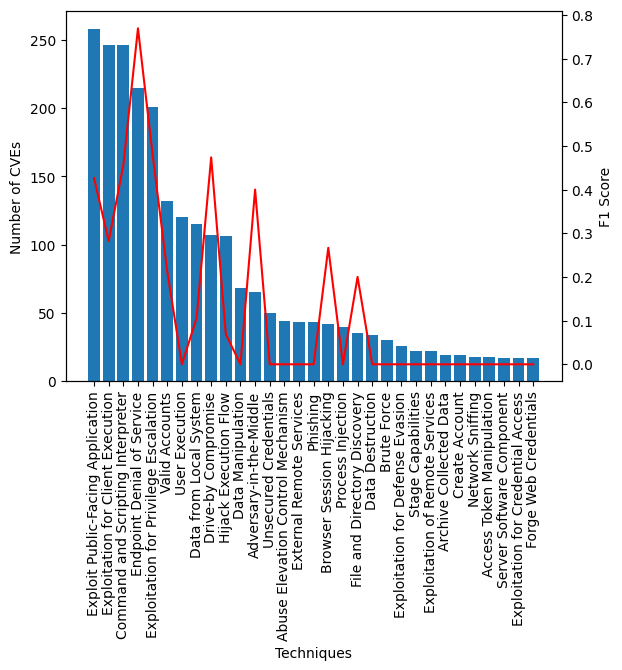

In [51]:

print_F1_based_on_distribution(y_test.values, predicted_y, y_train,  y_test.columns)

Process Injection


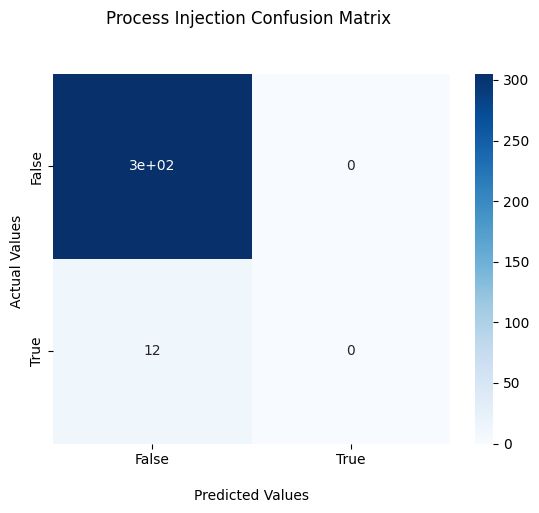

Access Token Manipulation


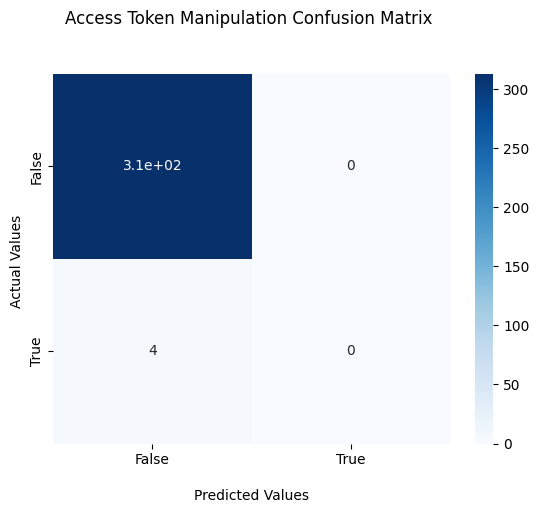

Hijack Execution Flow


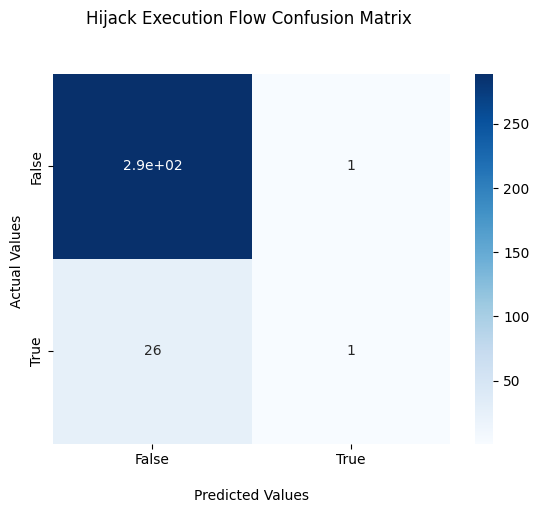

Data from Local System


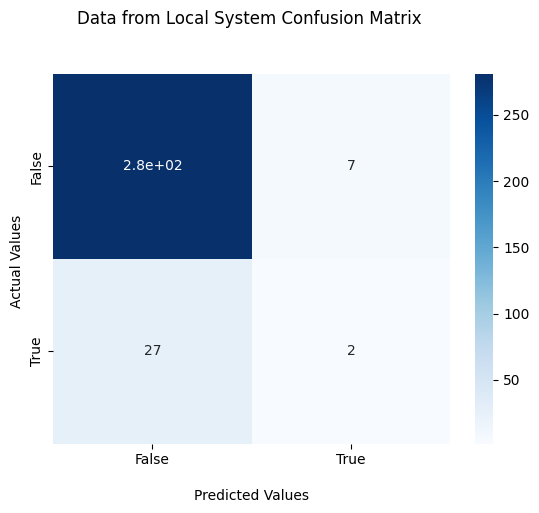

External Remote Services


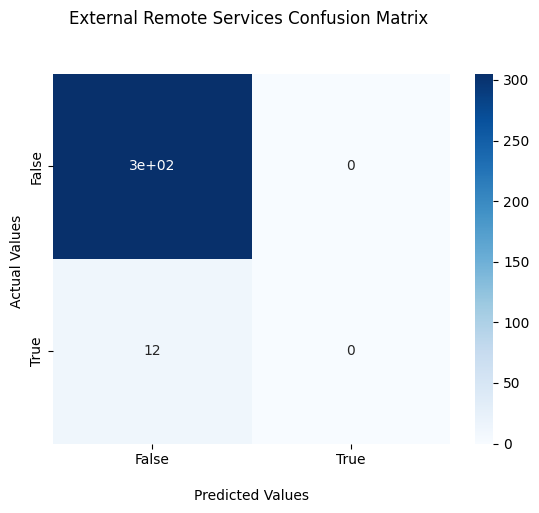

Data Manipulation


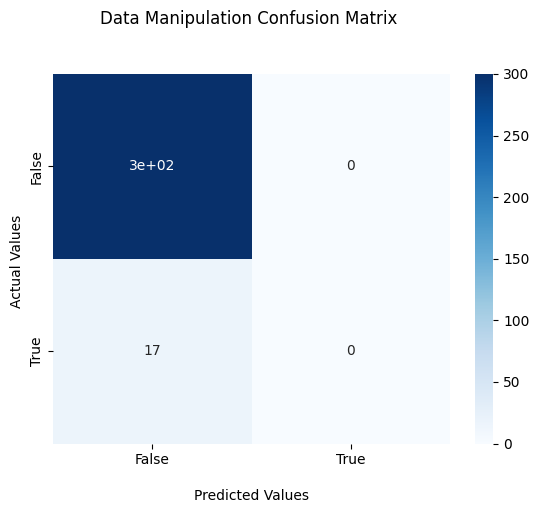

Network Sniffing


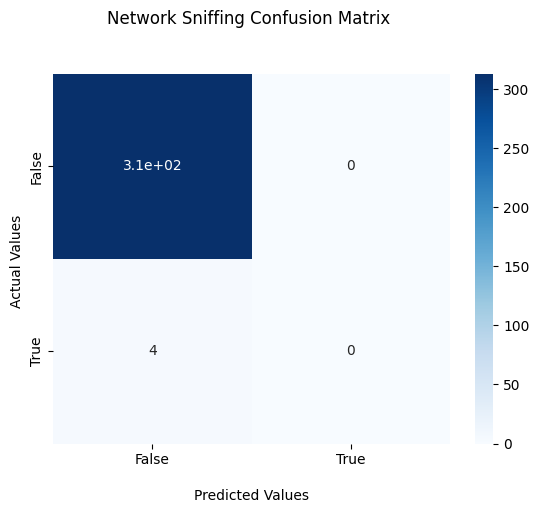

Exploitation for Privilege Escalation


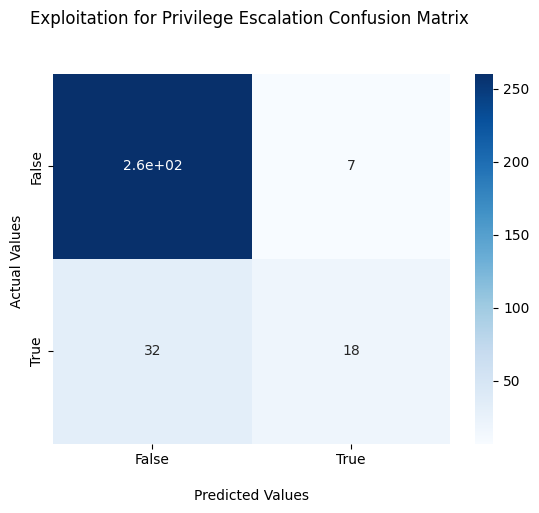

Command and Scripting Interpreter


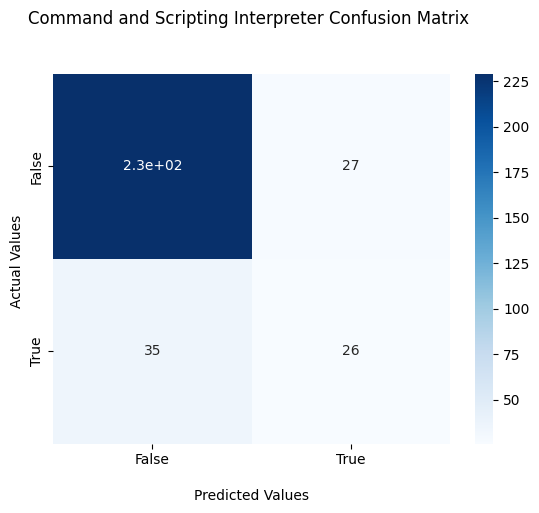

Phishing


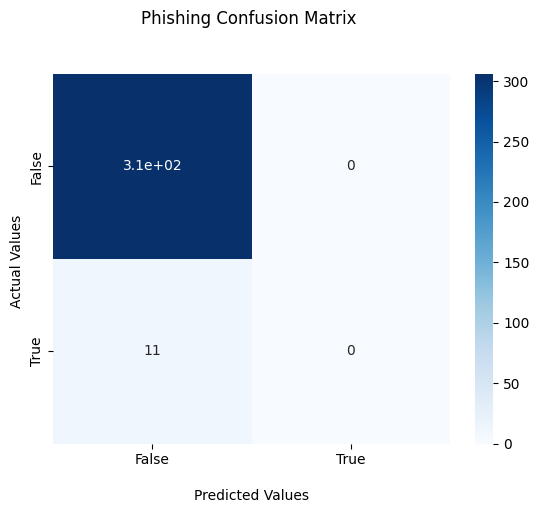

Server Software Component


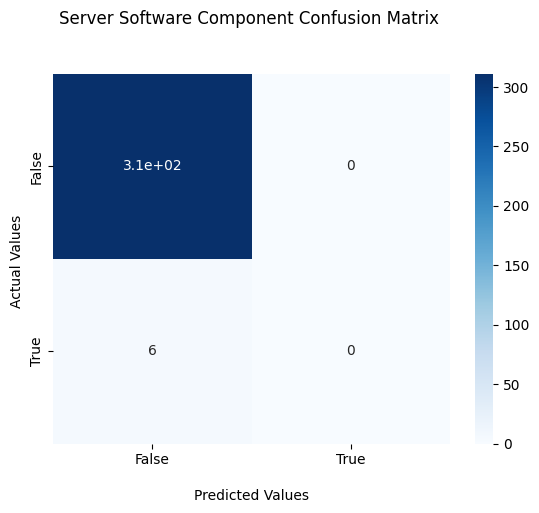

Archive Collected Data


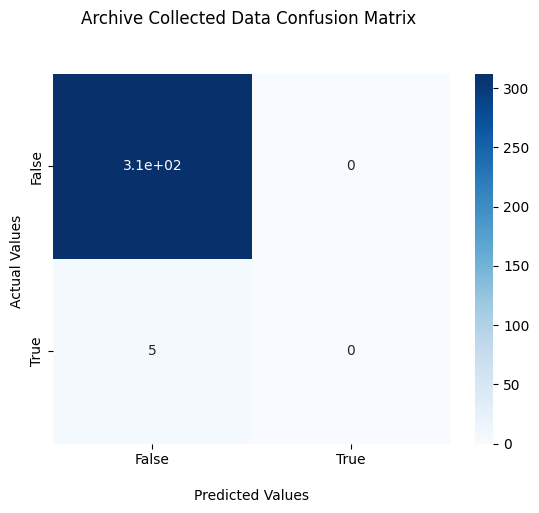

Data Destruction


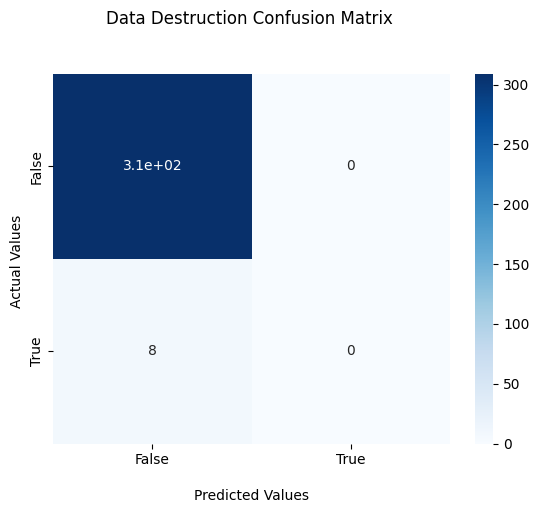

Browser Session Hijacking


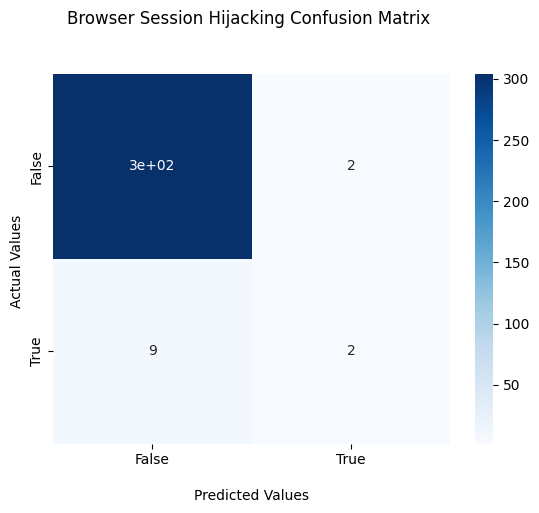

Exploitation for Credential Access


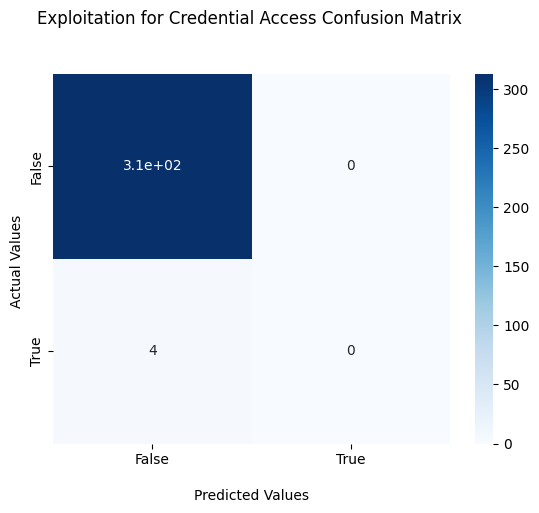

Abuse Elevation Control Mechanism


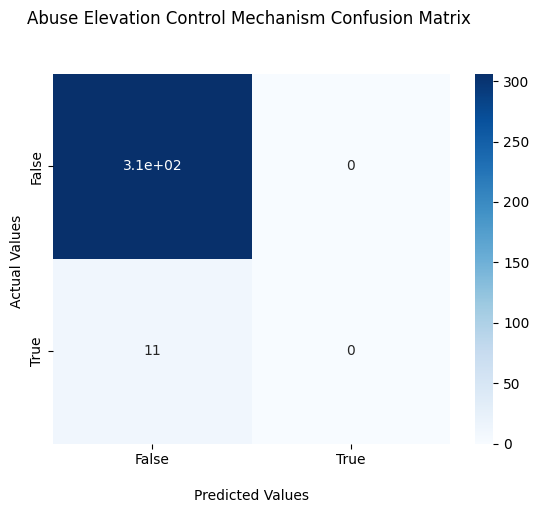

Adversary-in-the-Middle


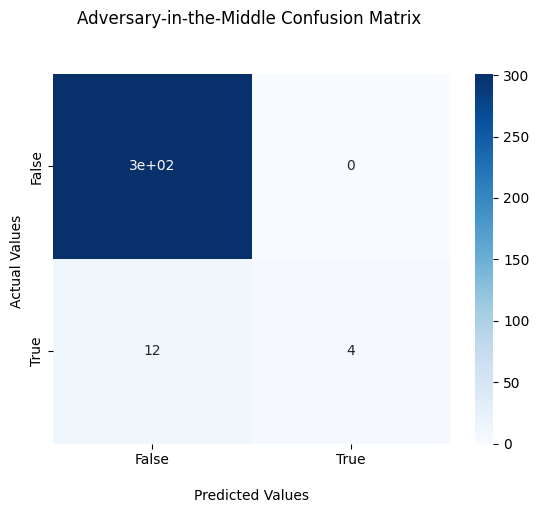

User Execution


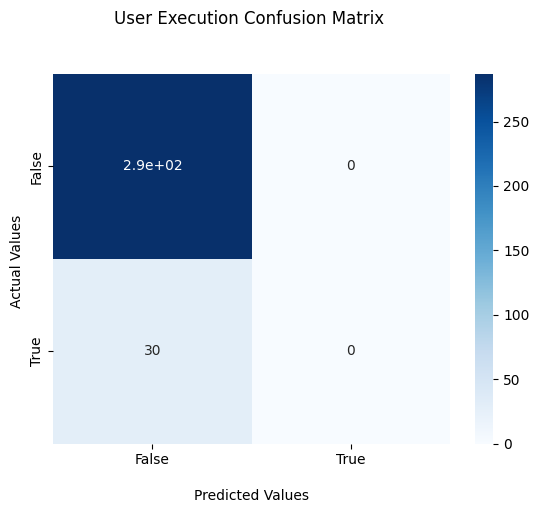

Unsecured Credentials


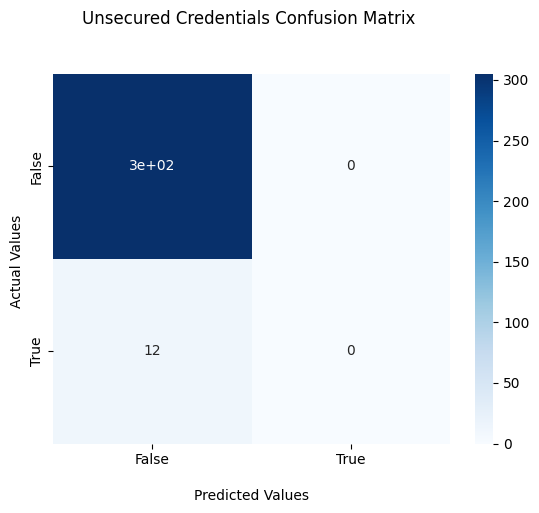

Brute Force


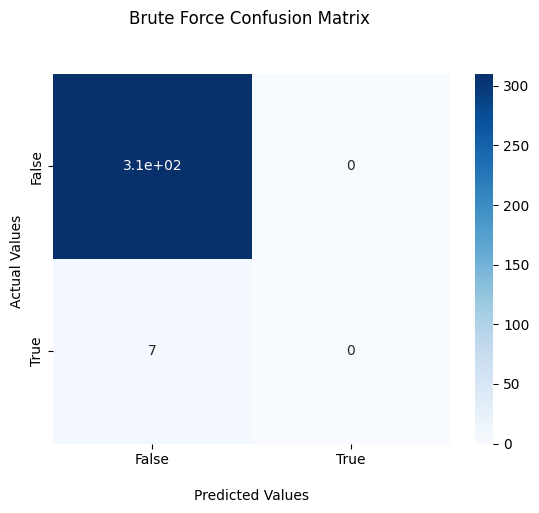

File and Directory Discovery


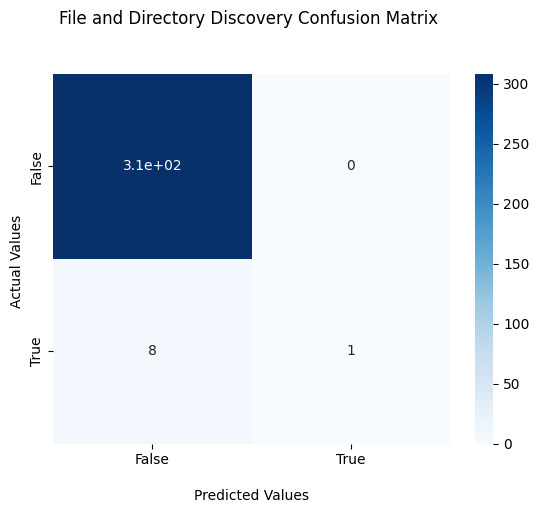

Valid Accounts


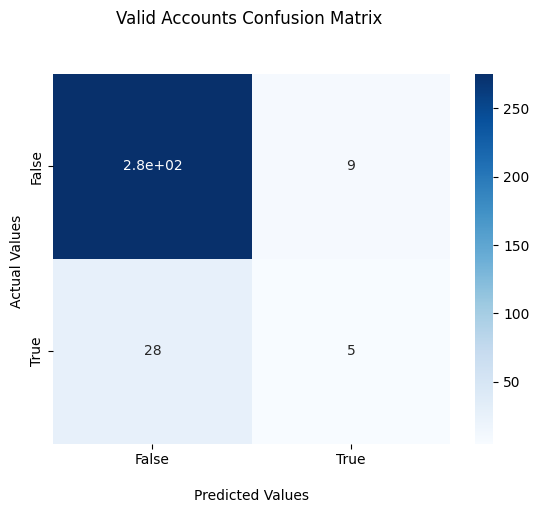

Exploitation for Defense Evasion


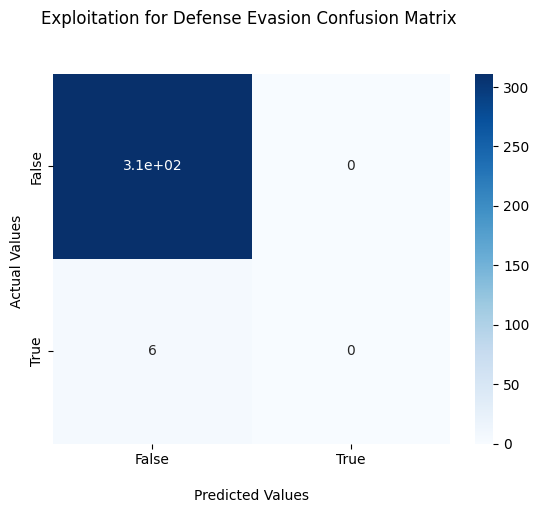

Create Account


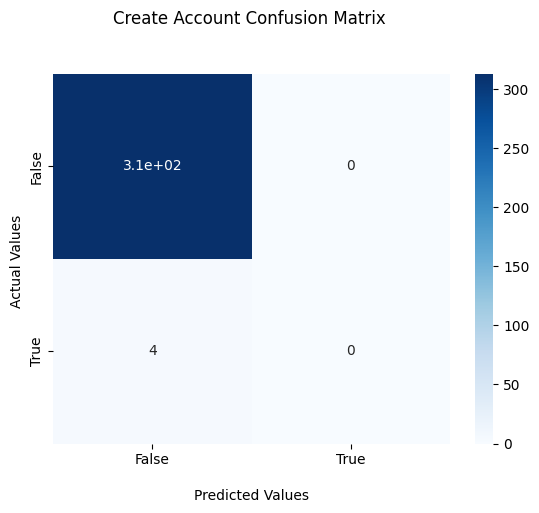

Endpoint Denial of Service


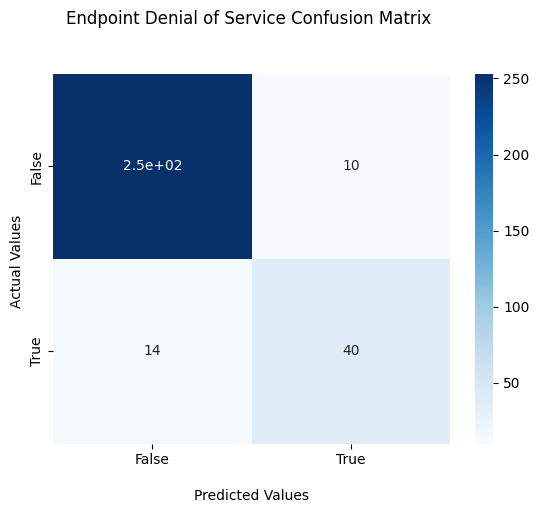

Drive-by Compromise


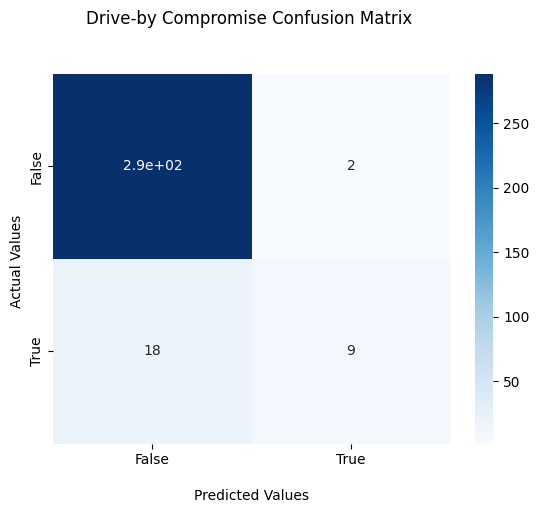

Exploitation for Client Execution


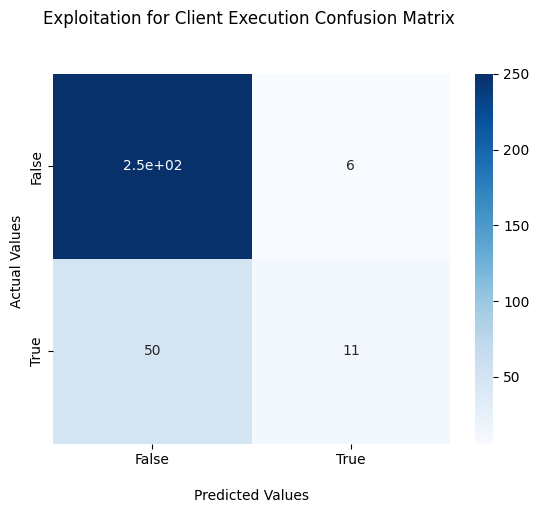

Exploitation of Remote Services


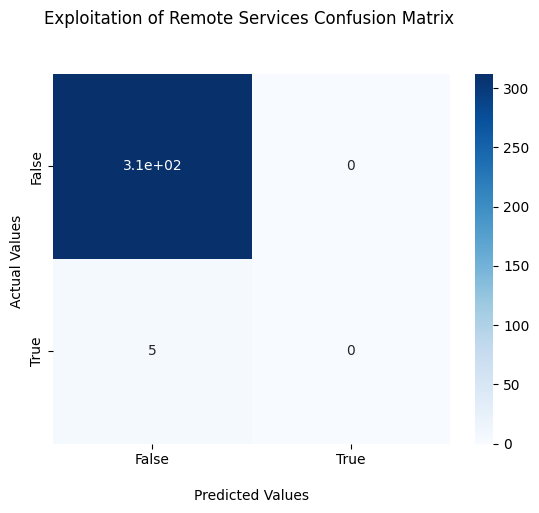

Stage Capabilities


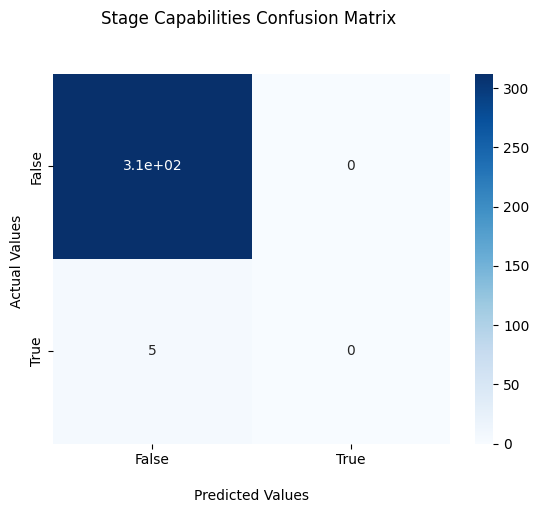

Exploit Public-Facing Application


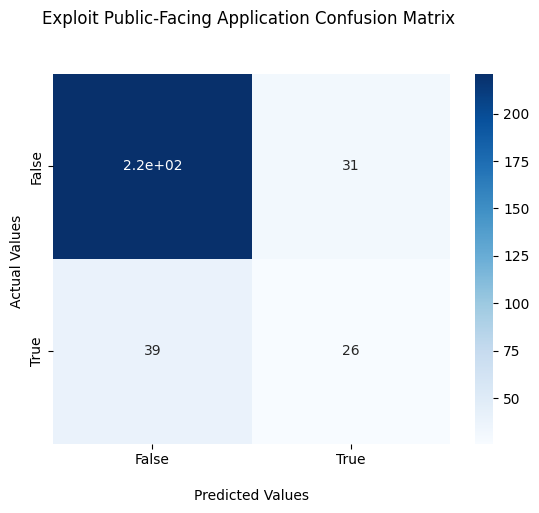

Forge Web Credentials


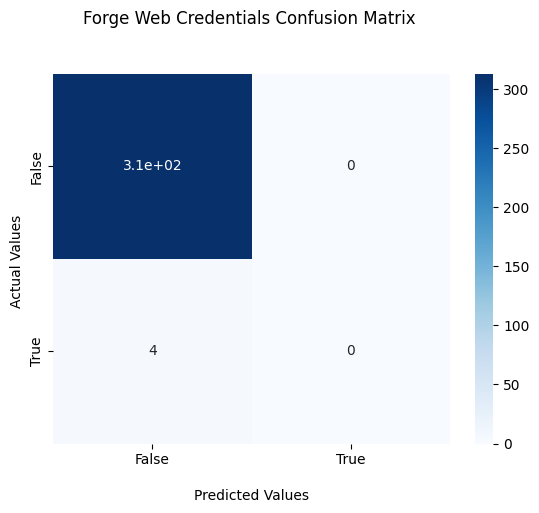

In [52]:

conf_matrix = multilabel_confusion_matrix(y_test.values, predicted_y)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

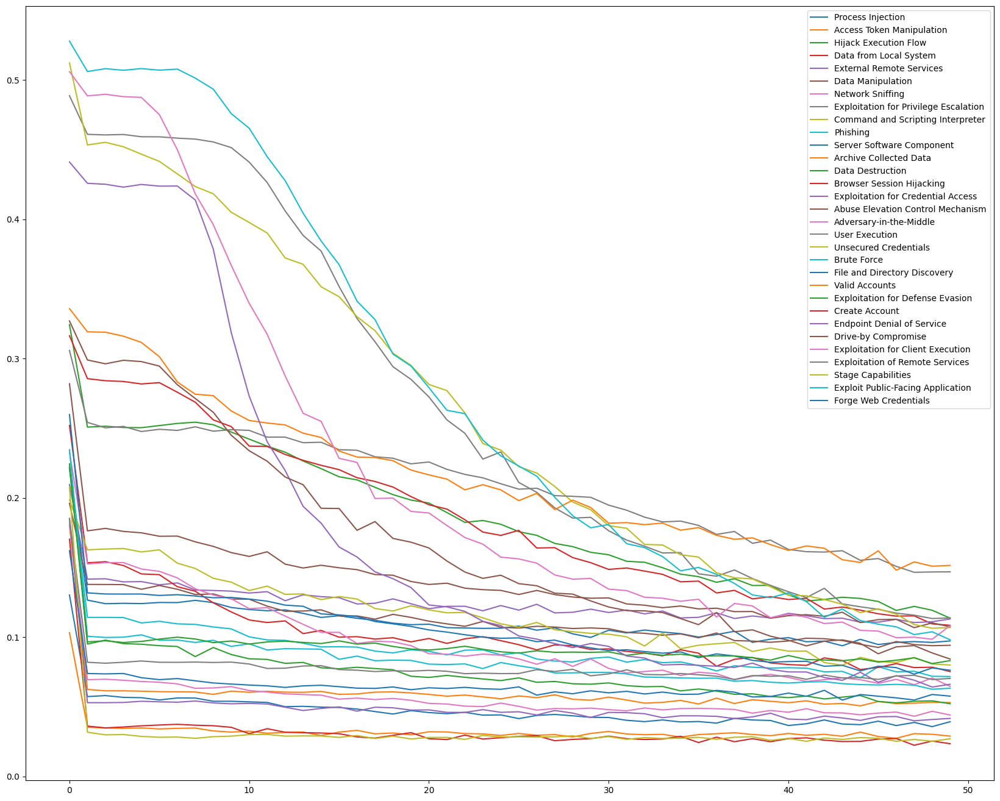

In [53]:

values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    plt.plot(history.history[col_name + '_loss'])
plt.legend(legend, loc='upper right')

fig = plt.gcf()
fig.set_size_inches(20.5, 16.5)
plt.show()
     

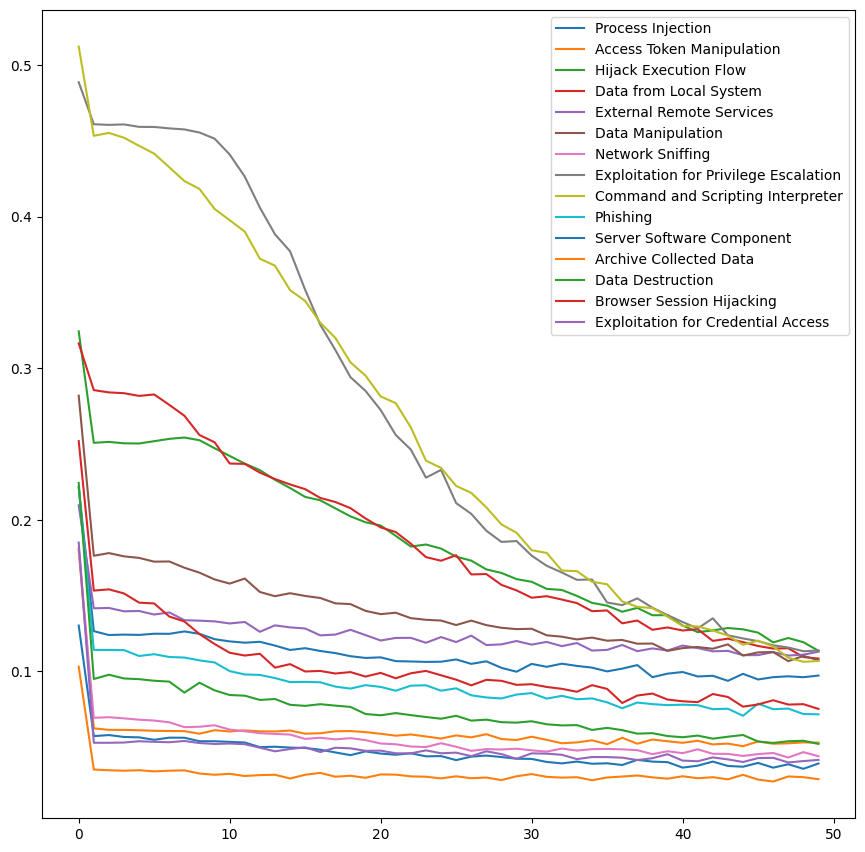

In [54]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(0, 15):
  plt.plot(values[i])
plt.legend(legend[:15], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 10.5)
plt.show()

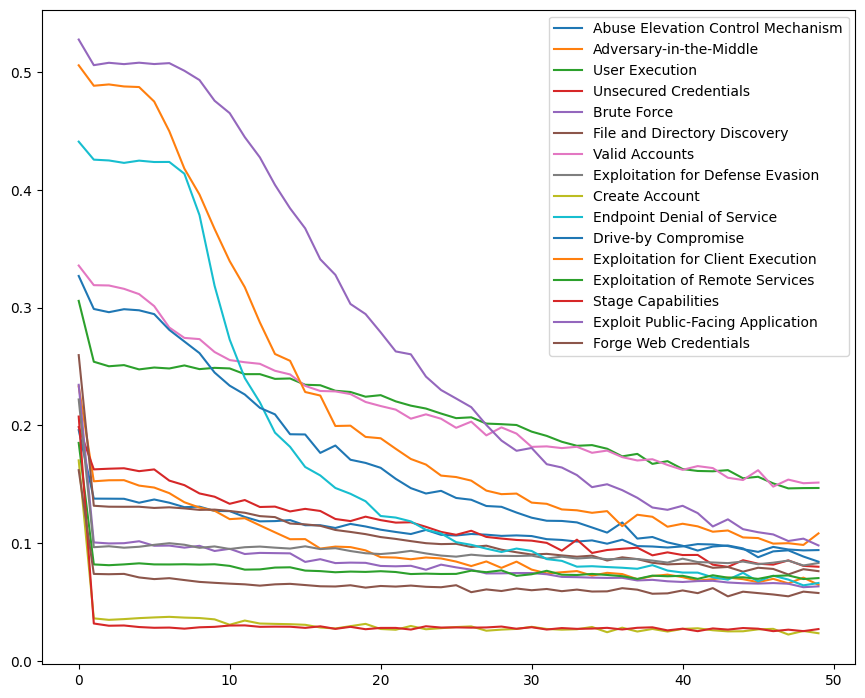

In [55]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(15, 31):
  plt.plot(values[i])
plt.legend(legend[15:], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 8.5)
plt.show()

Train Extended

In [56]:
#######################################
### --------- Setup BERT ---------- ###

# Name of the BERT model to use
model_name = 'bert-base-uncased'

# Max length of tokens
max_length = 350

# Load transformers config and set output_hidden_states to False
config = BertConfig.from_pretrained(model_name)
config.output_hidden_states = False

# Load BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained(pretrained_model_name_or_path = model_name, config = config)

# Load the Transformers BERT model
transformer_model = TFBertModel.from_pretrained(model_name, config = config)



Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

In [57]:
#######################################
### ------- Build the model ------- ###

# TF Keras documentation: https://www.tensorflow.org/api_docs/python/tf/keras/Model

# Load the MainLayer
bert = transformer_model.layers[0]

# Build your model input
input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
# attention_mask = Input(shape=(max_length,), name='attention_mask', dtype='int32') 
# inputs = {'input_ids': input_ids, 'attention_mask': attention_mask}
inputs = {'input_ids': input_ids}

# Load the Transformers BERT model as a layer in a Keras model
bert_model = bert(inputs)[1]
dropout = Dropout(config.hidden_dropout_prob, name='pooled_output')
pooled_output = dropout(bert_model, training=False)

# Then build your model output
outputs = {}
for col in y_train_extended.columns:
    col_name = col.replace(' ', '')
    new_layer = Dense(units=2, kernel_initializer=TruncatedNormal(stddev=config.initializer_range), name=col_name)(pooled_output)
    outputs[col] = new_layer

# And combine it all in a model object
model = Model(inputs=inputs, outputs=outputs, name='BERT_MultiLabel')

# Take a look at the model
model.summary()



Model: "BERT_MultiLabel"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_ids (InputLayer)      [(None, 350)]                0         []                            
                                                                                                  
 bert (TFBertMainLayer)      TFBaseModelOutputWithPooli   1094822   ['input_ids[0][0]']           
                             ngAndCrossAttentions(last_   40                                      
                             hidden_state=(None, 350, 7                                           
                             68),                                                                 
                              pooler_output=(None, 768)                                           
                             , past_key_values=None, hi                             

In [58]:
#######################################
### ------- Train the model ------- ###

# Set an optimizer
optimizer = legacy.Adam(
    learning_rate=6e-05,
    epsilon=1e-07,
    decay=0.01,
    clipnorm=1.0)

# Set loss and metrics
loss = {}
metric = {}
for col in y_train_extended.columns:
    loss[col] = CategoricalCrossentropy(from_logits = True)
    metric[col] = CategoricalAccuracy ('accuracy')

# Compile the model
model.compile(
    optimizer = optimizer,
    loss = loss, 
    metrics = metric)

y = {}
for col in y_train_extended.columns:
    y[col] = to_categorical(y_train_extended[col].values)

# Tokenize the input (takes some time)
x = tokenizer(
    text=X_train_extended['Text'].to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = True,
    verbose = True)

# Fit the model
history = model.fit(
    # x={'input_ids': x['input_ids'], 'attention_mask': x['attention_mask']},
    x={'input_ids': x['input_ids']},
    y=y,
    validation_split=0.2,
    batch_size=16,
    epochs=50)

Epoch 1/50
181/181 [==============================] - 302s 1s/step - loss: 6.1277 - AbuseElevationControlMechanism_loss: 0.2538 - AccessTokenManipulation_loss: 0.0671 - Adversary-in-the-Middle_loss: 0.3219 - ArchiveCollectedData_loss: 0.0842 - BrowserSessionHijacking_loss: 0.1694 - BruteForce_loss: 0.1787 - CommandandScriptingInterpreter_loss: 0.3059 - CreateAccount_loss: 0.0837 - DataDestruction_loss: 0.1778 - DataManipulation_loss: 0.2420 - DatafromLocalSystem_loss: 0.3117 - Drive-byCompromise_loss: 0.2941 - EndpointDenialofService_loss: 0.2829 - ExploitPublic-FacingApplication_loss: 0.3177 - ExploitationforClientExecution_loss: 0.3148 - ExploitationforCredentialAccess_loss: 0.0650 - ExploitationforDefenseEvasion_loss: 0.0957 - ExploitationforPrivilegeEscalation_loss: 0.2654 - ExploitationofRemoteServices_loss: 0.0747 - ExternalRemoteServices_loss: 0.1508 - FileandDirectoryDiscovery_loss: 0.1865 - ForgeWebCredentials_loss: 0.0794 - HijackExecutionFlow_loss: 0.3180 - NetworkSniffing_l

In [59]:
#######################################
### ----- Evaluate the model ------ ###

import numpy as np
test_x = tokenizer(
    text=X_test['Text'].to_list(),
    add_special_tokens=True,
    padding='max_length',          # replace pad_to_max_length
    max_length=max_length,
    truncation=True,
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = False,
    verbose = True)

# Run evaluation
model_eval = model.predict(
    x={'input_ids':test_x['input_ids']},
)

10/10 [==============================] - 12s 826ms/step


In [60]:

predicted_y = pd.DataFrame(columns=y_train_extended.columns)
for col in model_eval:
  result = []
  for el in model_eval[col]:
    if el[0] > el[1]:
      result.append(0)
    else:
      result.append(1)
  predicted_y[col] = result

In [61]:
print(accuracy_score(y_test.values, predicted_y))

0.12302839116719243


In [62]:

print("F1 Score")
compute_metrics(predicted_y, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,File and Directory Discovery,Data from Local System,Drive-by Compromise,Browser Session Hijacking,User Execution,...,External Remote Services,Network Sniffing,Exploitation for Credential Access,Archive Collected Data,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.784314,0.613636,0.538462,0.537313,0.446809,0.428571,0.4,0.390244,0.375,0.363636,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [63]:
print("Recall Score")
compute_metrics(predicted_y, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Privilege Escalation,Data from Local System,Adversary-in-the-Middle,Exploit Public-Facing Application,Exploitation for Client Execution,File and Directory Discovery,Drive-by Compromise,Browser Session Hijacking,...,External Remote Services,Network Sniffing,Exploitation for Credential Access,Archive Collected Data,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.740741,0.590164,0.54,0.448276,0.4375,0.369231,0.344262,0.333333,0.296296,0.272727,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [64]:

print("Precision Score")
compute_metrics(predicted_y, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Brute Force,Endpoint Denial of Service,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Data Destruction,Exploitation for Client Execution,Browser Session Hijacking,File and Directory Discovery,Drive-by Compromise,User Execution,...,External Remote Services,Network Sniffing,Exploitation for Credential Access,Archive Collected Data,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,1.0,0.833333,0.710526,0.7,0.666667,0.636364,0.6,0.6,0.571429,0.571429,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:

print(f1_score(y_test.values, predicted_y, average='weighted'))

0.38487612191017273


In [66]:
print(recall_score(y_test.values, predicted_y, average='weighted'))

0.3442622950819672


In [67]:

print(precision_score(y_test.values, predicted_y, average='weighted'))

0.484736701313403


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


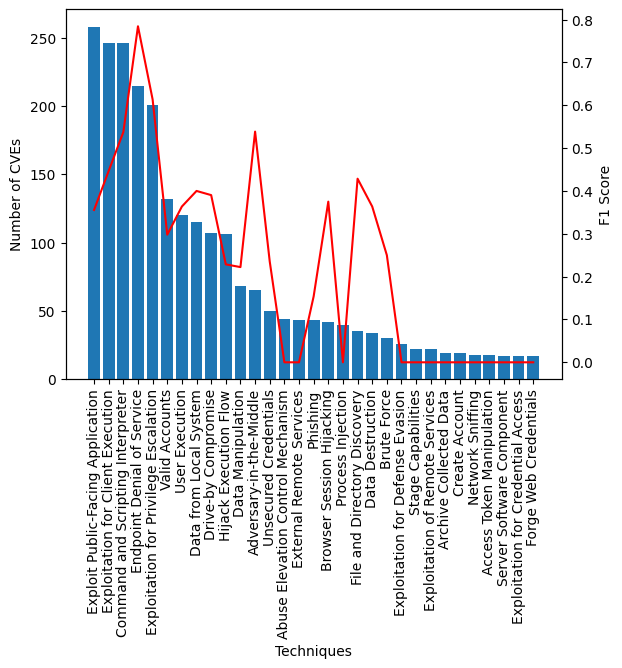

In [68]:

print_F1_based_on_distribution(y_test.values, predicted_y, y_train,  y_test.columns)

Process Injection


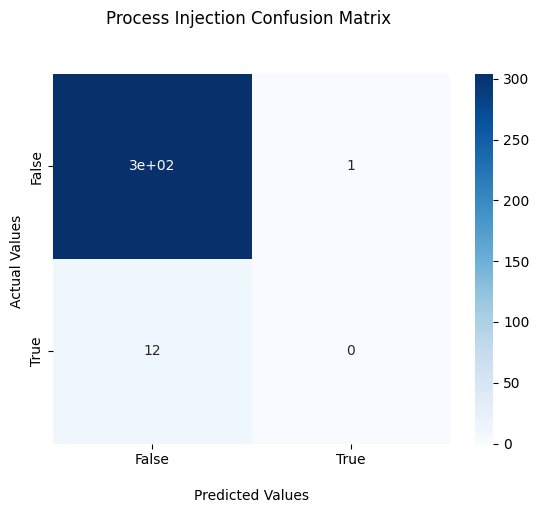

Access Token Manipulation


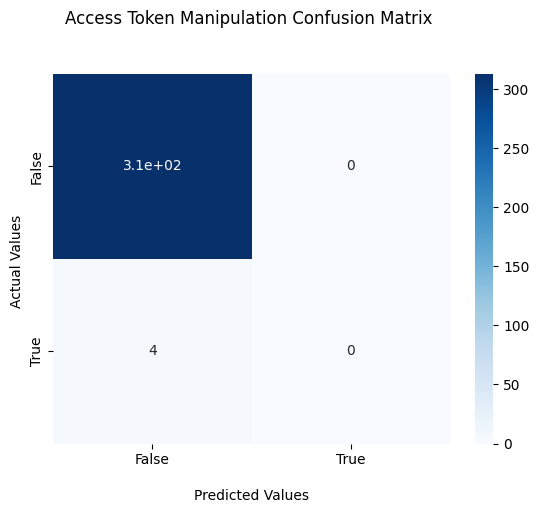

Hijack Execution Flow


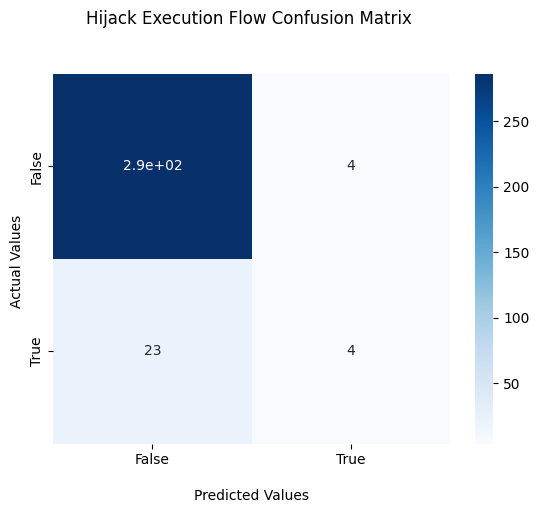

Data from Local System


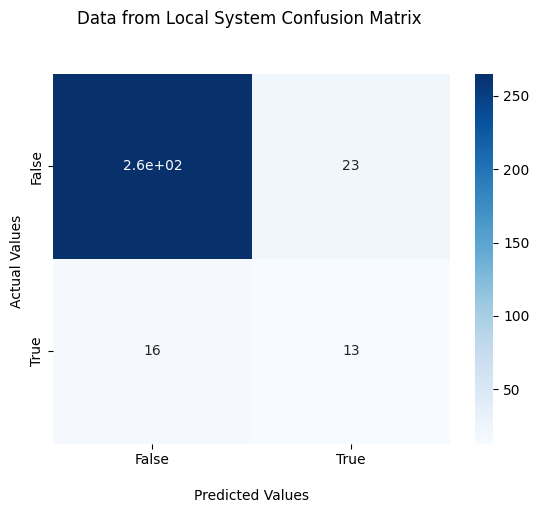

External Remote Services


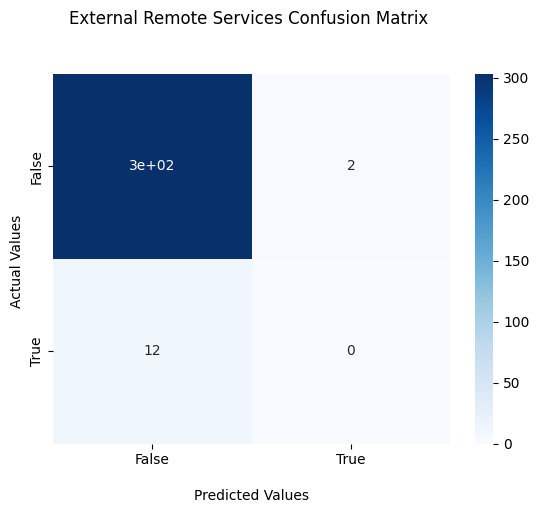

Data Manipulation


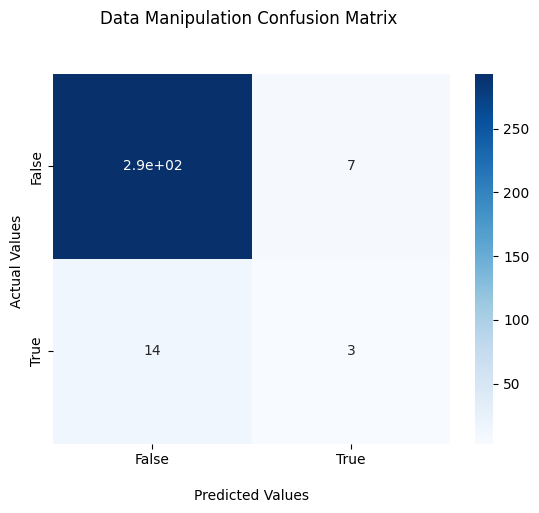

Network Sniffing


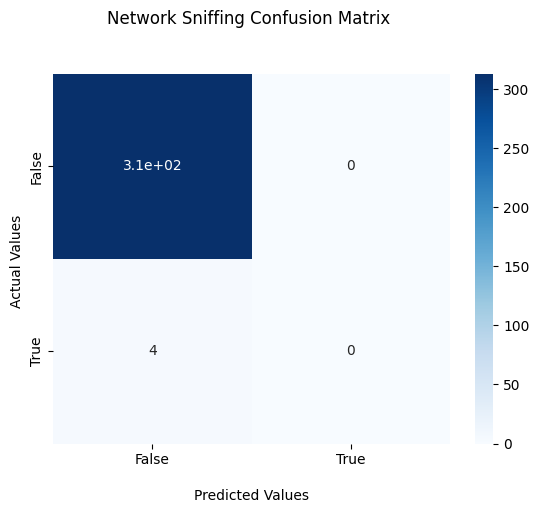

Exploitation for Privilege Escalation


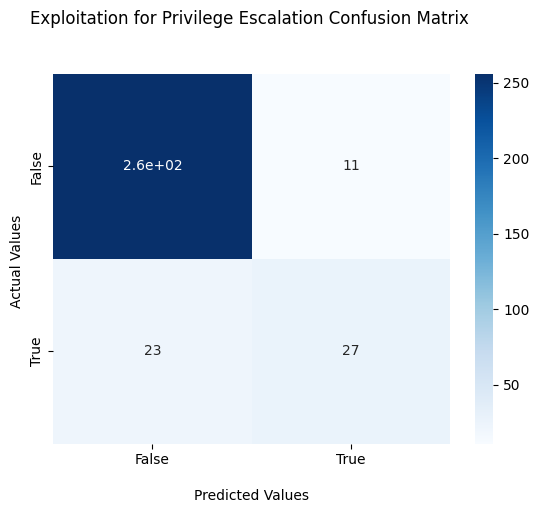

Command and Scripting Interpreter


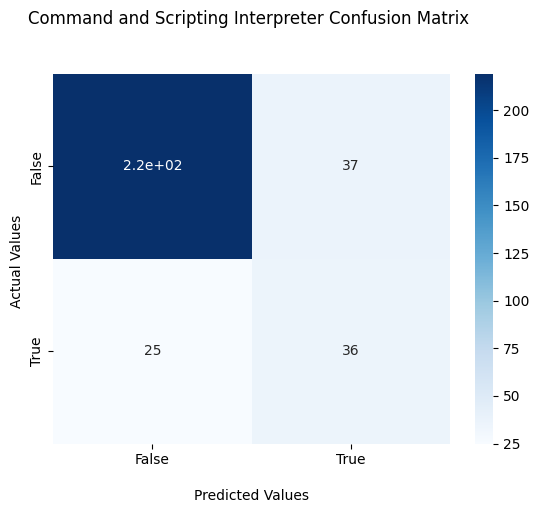

Phishing


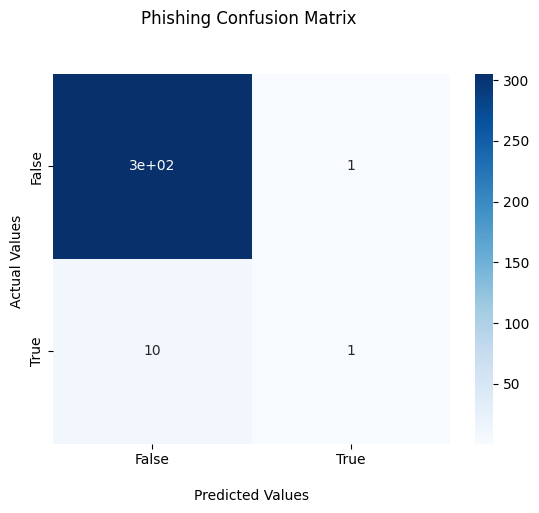

Server Software Component


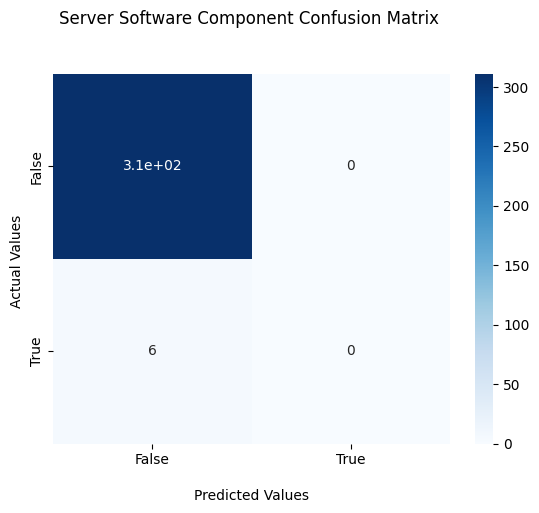

Archive Collected Data


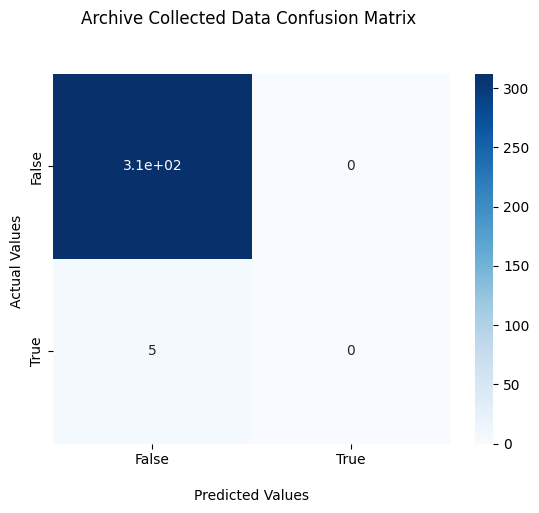

Data Destruction


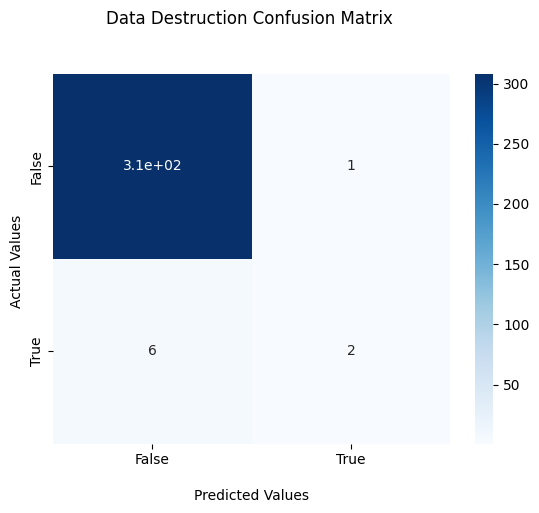

Browser Session Hijacking


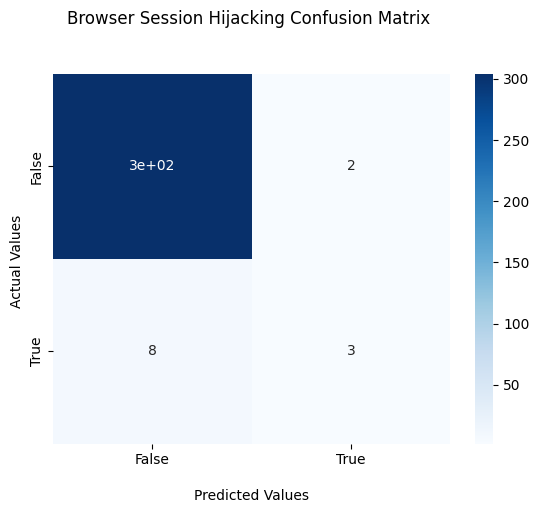

Exploitation for Credential Access


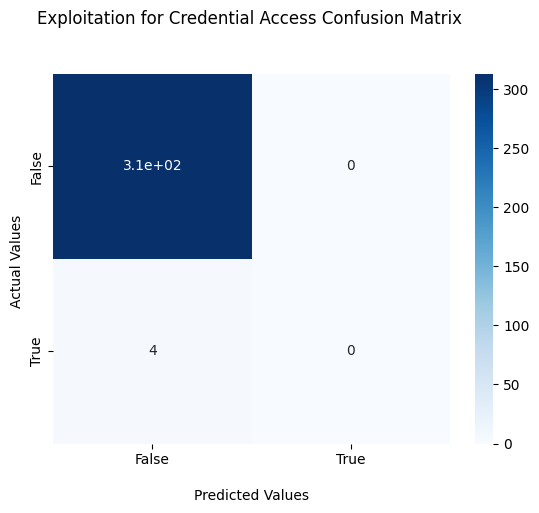

Abuse Elevation Control Mechanism


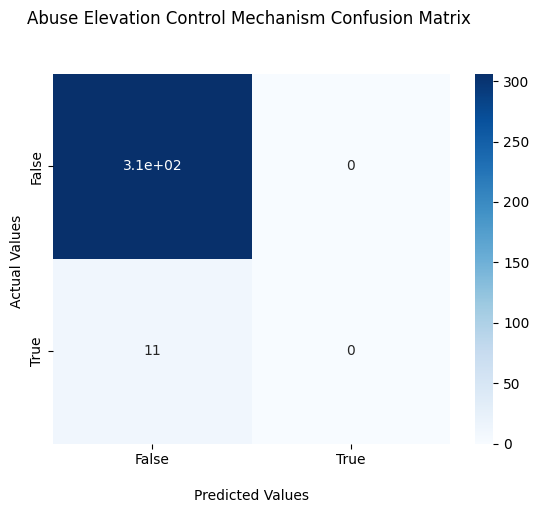

Adversary-in-the-Middle


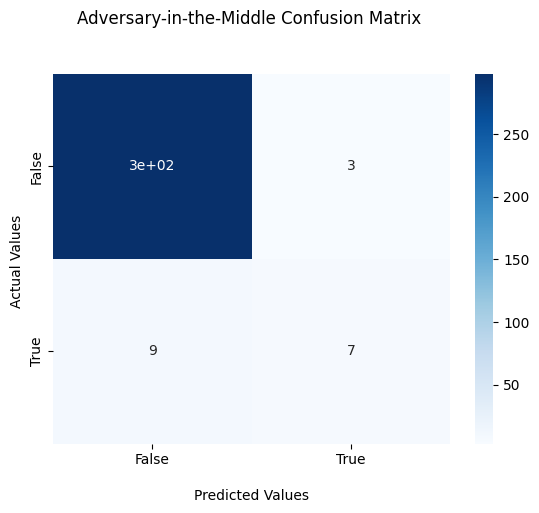

User Execution


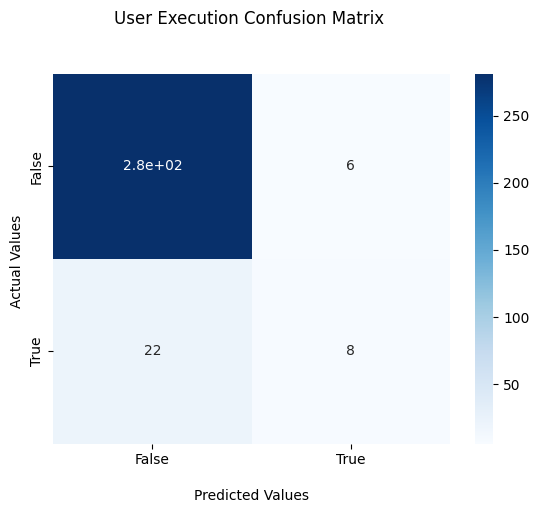

Unsecured Credentials


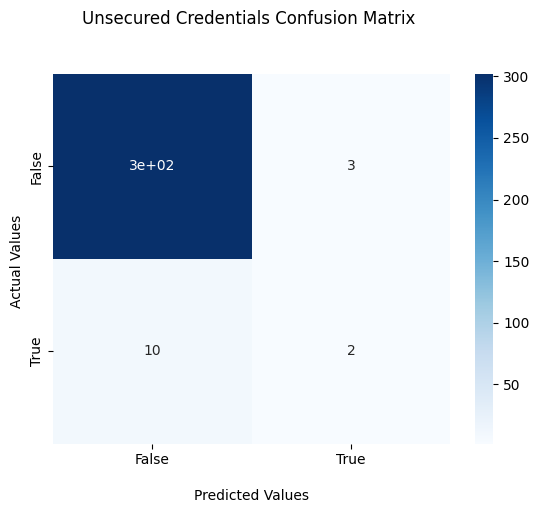

Brute Force


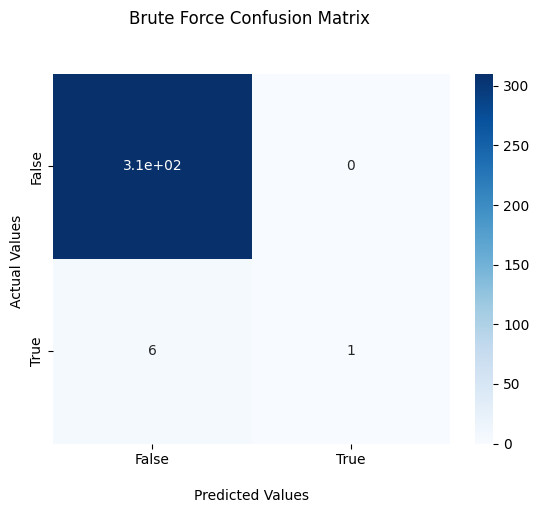

File and Directory Discovery


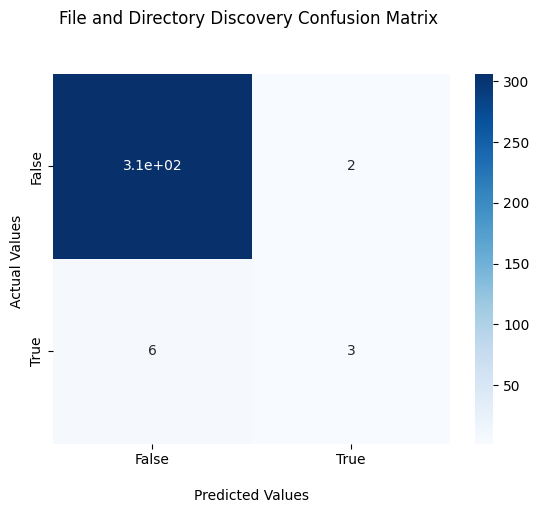

Valid Accounts


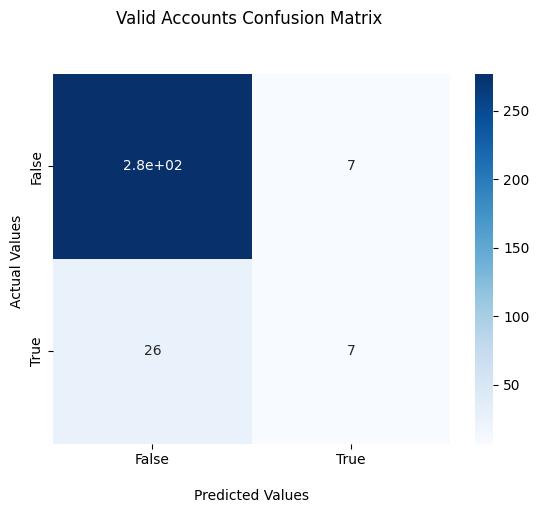

Exploitation for Defense Evasion


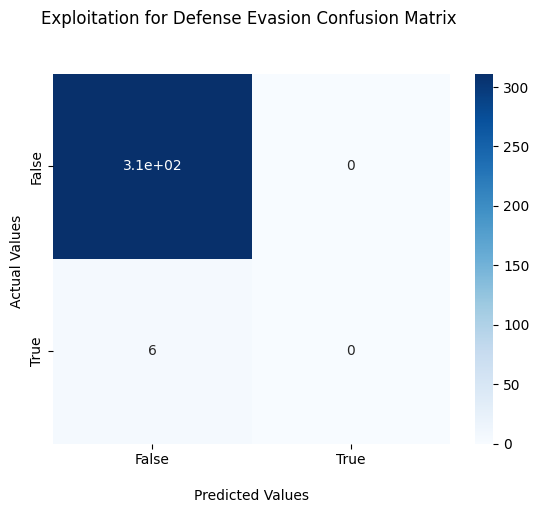

Create Account


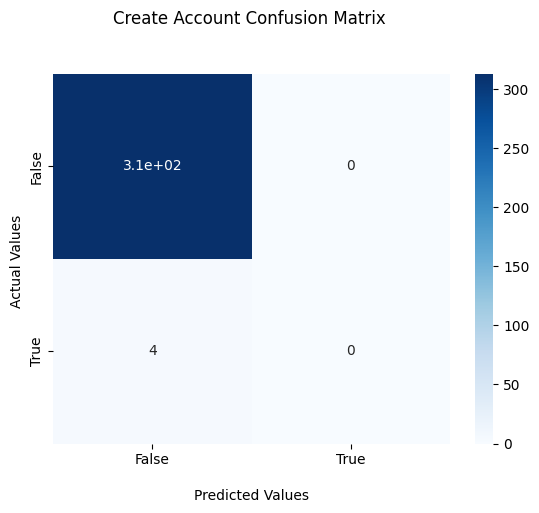

Endpoint Denial of Service


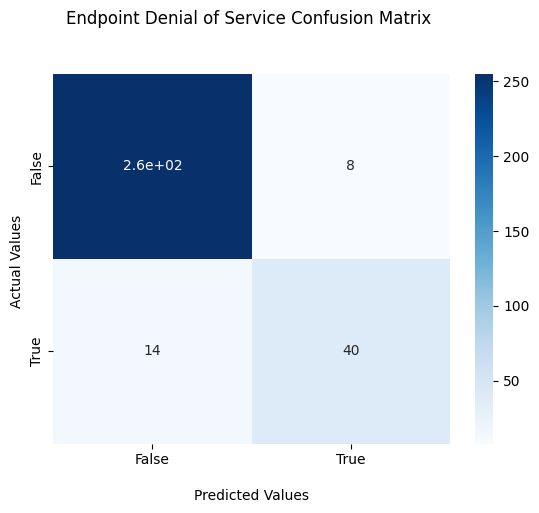

Drive-by Compromise


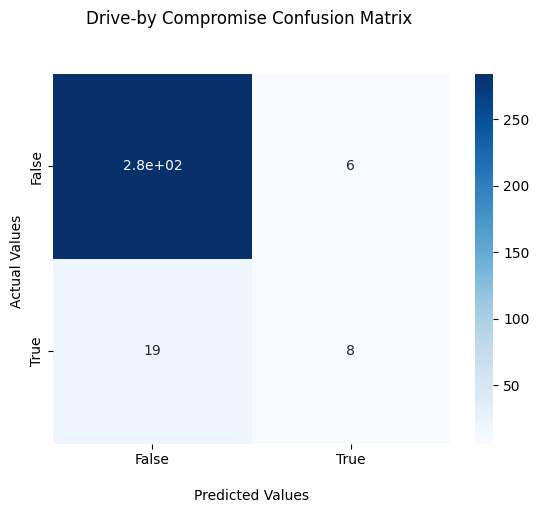

Exploitation for Client Execution


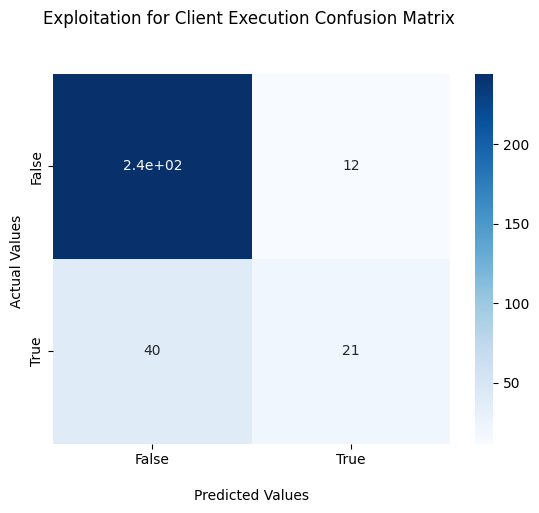

Exploitation of Remote Services


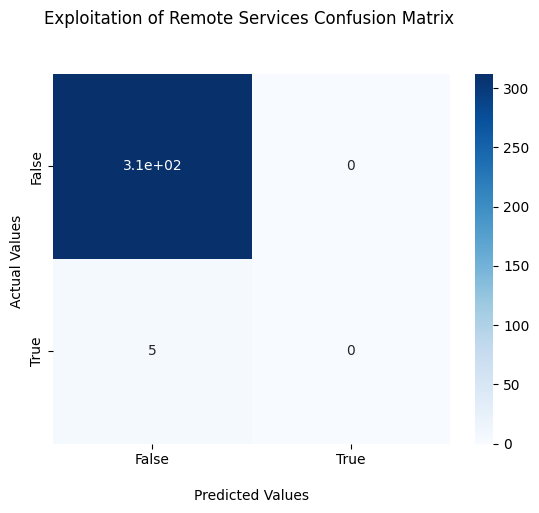

Stage Capabilities


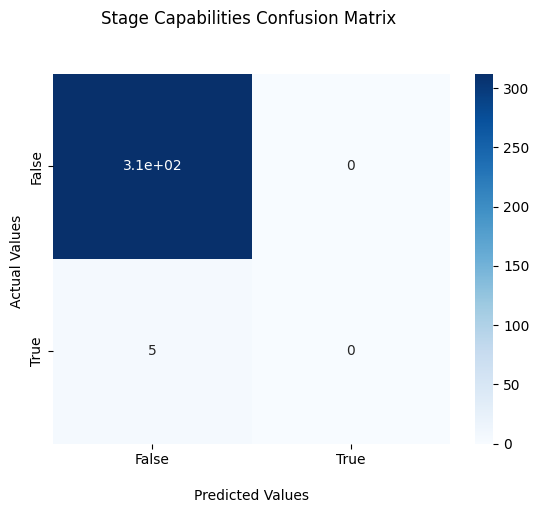

Exploit Public-Facing Application


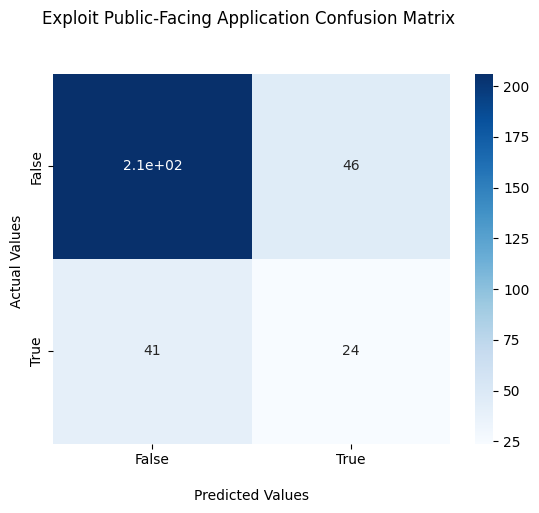

Forge Web Credentials


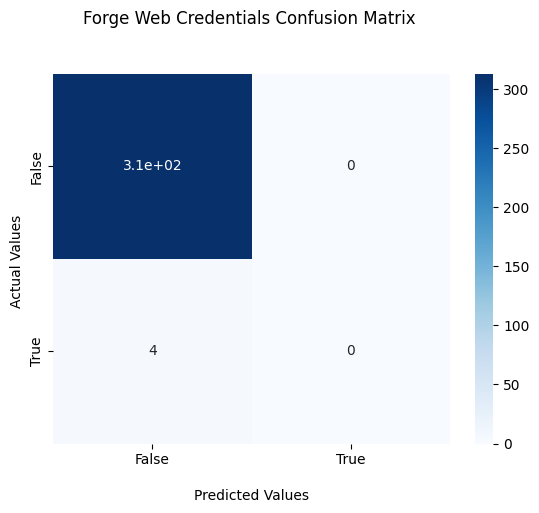

In [69]:
conf_matrix = multilabel_confusion_matrix(y_test.values, predicted_y)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

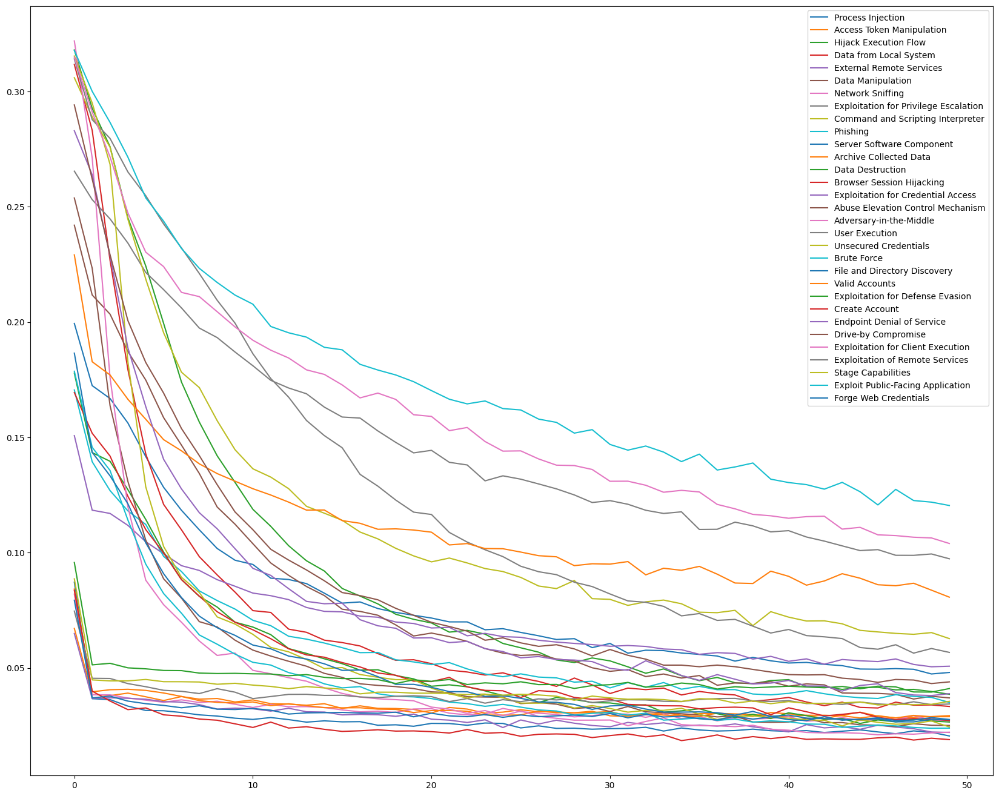

In [70]:

values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    plt.plot(history.history[col_name + '_loss'])
plt.legend(legend, loc='upper right')

fig = plt.gcf()
fig.set_size_inches(20.5, 16.5)
plt.show()

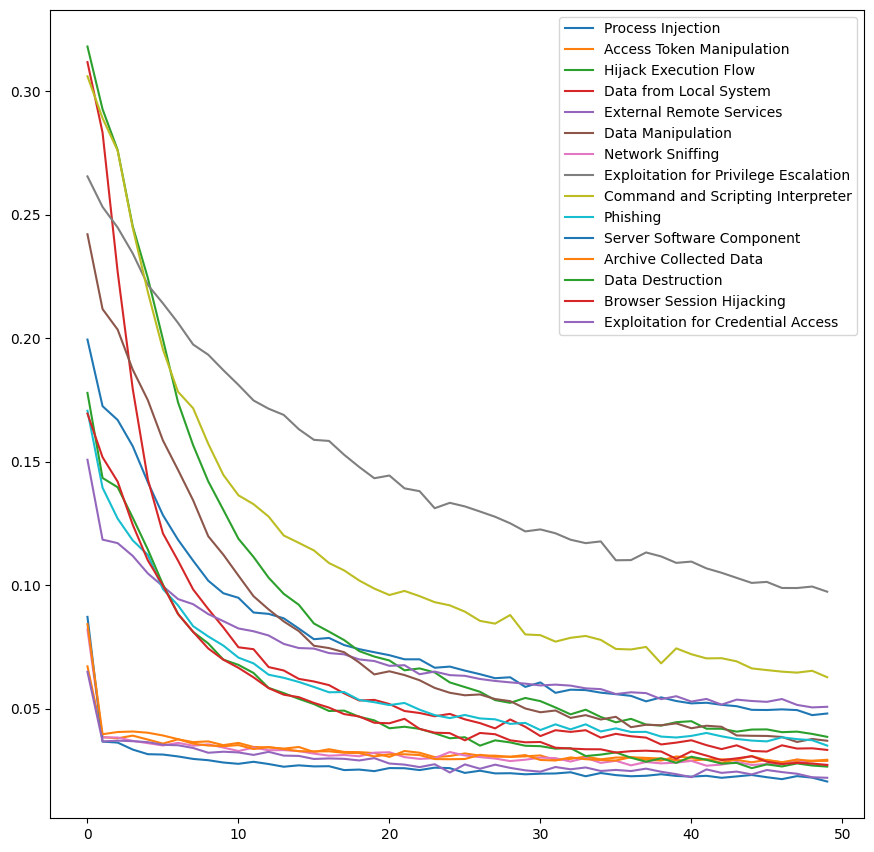

In [71]:

values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(0, 15):
  plt.plot(values[i])
plt.legend(legend[:15], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 10.5)
plt.show()

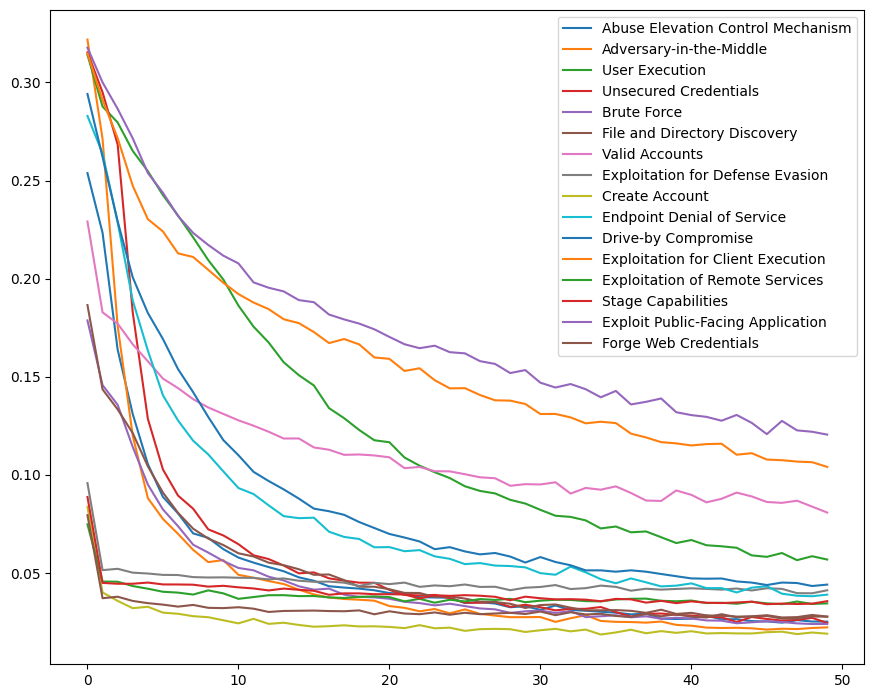

In [72]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(15, 31):
  plt.plot(values[i])
plt.legend(legend[15:], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 8.5)
plt.show()

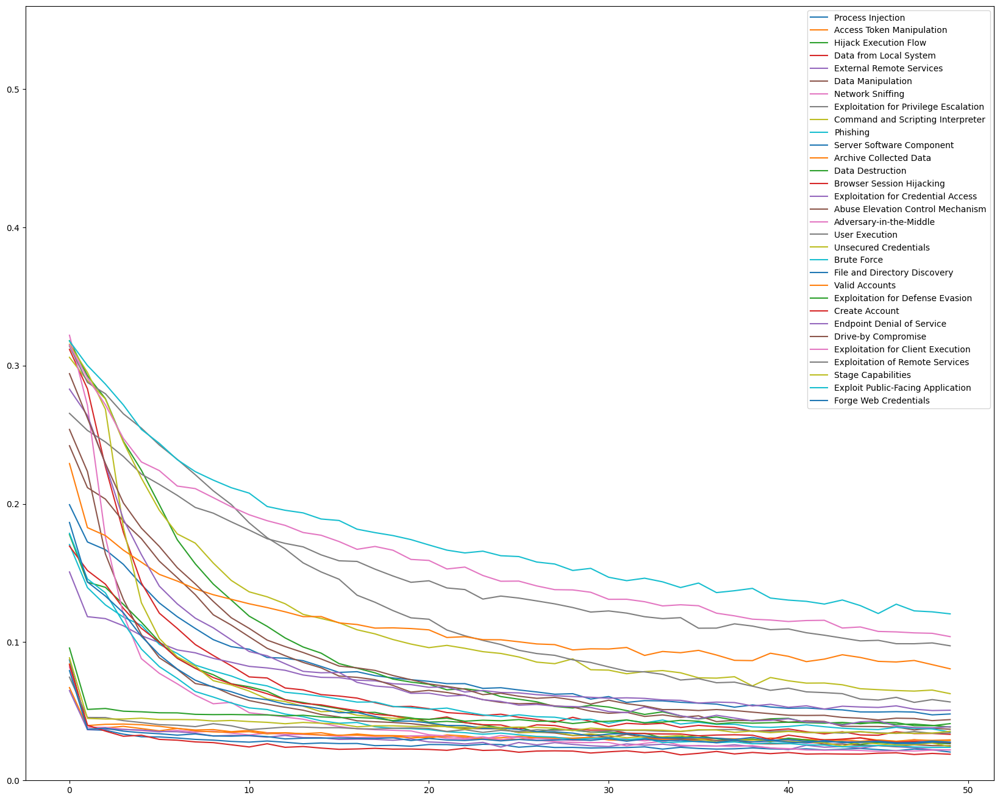

In [73]:

values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    plt.plot(history.history[col_name + '_loss'])
plt.legend(legend, loc='upper right')

fig = plt.gcf()
fig.set_size_inches(20.5, 16.5)
plt.ylim(0, 0.56)
plt.show()

In [74]:
# model.save('/kaggle/working/extended_bert_binomial')

In [ ]:

# !zip -r  extended_bert_binomial.zip extended_bert_binomial

Multi-label BERT

In [ ]:

# !pip install -q transformers


In [103]:
import torch

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

# Try allocating a tensor on GPU 1
try:
    x = torch.randn(10000, 10000, device="cuda:1")
    print("✅ Successfully allocated tensor on GPU 1")
except Exception as e:
    print("❌ Cannot use GPU 1:", e)


GPU 0: Tesla T4
GPU 1: Tesla T4
✅ Successfully allocated tensor on GPU 1


In [104]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer
pd.set_option('display.max_columns', None)

In [105]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [106]:
(X_train, y_train) = load_data_from_file('/kaggle/input/input-files/X_train.csv', '/kaggle/input/input-files/y_train.csv')
(X_test, y_test) = load_data_from_file('/kaggle/input/input-files/X_test.csv', '/kaggle/input/input-files/y_test.csv')

In [107]:

def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [108]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]

In [109]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [110]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [111]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'bert-base-uncased'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 320
    self.BATCH_SIZE = 32
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

In [112]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        padding='max_length',
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }

In [113]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([32, 320])
attention_mask shape: torch.Size([32, 320])
labels shape: torch.Size([32, 31])


In [114]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.3)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [115]:
# device = config.DEVICE
# device
import torch

# In your config
config.DEVICE = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

# Then everywhere you call
device = config.DEVICE
     

In [116]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)

In [117]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score

In [118]:
model = Model()
model.to(device);

In [119]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.4573744684457779
Eval Val accuracy: 0.006309148264984227
Eval Val micro f1 score: 0.015527950310559004
-- Step: 28
Eval Val loss: 0.3620824903249741
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.3076174557209015
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.4474226846251377
Eval Val loss: 0.3076174557209015
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.2702006086707115
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.24832243621349334
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.23485470861196517
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.26619610918122666
Eval Val loss: 0.23485470861196517
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 1/50: F1 Score 0.0


Epoch 2:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.22630729377269745
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.22080274075269699
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.21784757822752
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.22390375511590824
Eval Val loss: 0.21784757822752
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 2/50: F1 Score 0.0


Epoch 3:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.21471500247716904
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.21205490827560425
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.21226911395788192
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20992263666419095
Eval Val loss: 0.21226911395788192
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 3/50: F1 Score 0.0


Epoch 4:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.2096577063202858
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.2084984540939331
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.2087930217385292
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20542105131371077
Eval Val loss: 0.2087930217385292
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 4/50: F1 Score 0.0


Epoch 5:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.20724636912345887
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.20618971586227416
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.2076701208949089
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20242712906626767
Eval Val loss: 0.2076701208949089
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 5/50: F1 Score 0.0


Epoch 6:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.20524290651082994
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.2042413219809532
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.2065535306930542
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.1987896416076394
Eval Val loss: 0.2065535306930542
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 6/50: F1 Score 0.0


Epoch 7:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.20314105302095414
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0032733224222585926
-- Step: 28
Eval Val loss: 0.2018953412771225
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.20542011708021163
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.19595758062462473
Eval Val loss: 0.20542011708021163
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 7/50: F1 Score 0.0


Epoch 8:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.2006775602698326
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.006535947712418301
-- Step: 28
Eval Val loss: 0.20046027451753617
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.20162694603204728
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.006535947712418301
Training loss: 0.192419002568999
Eval Val loss: 0.20162694603204728
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.006535947712418301
Epoch 8/50: F1 Score 0.006535947712418301
--- Best Model. Val loss: 0.0 -> 0.006535947712418301


Epoch 9:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.19804350435733795
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.19736816138029098
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.20180954933166503
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.11994002998500752
Training loss: 0.18882090719633324
Eval Val loss: 0.20180954933166503
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.11994002998500752
Epoch 9/50: F1 Score 0.11994002998500752
--- Best Model. Val loss: 0.006535947712418301 -> 0.11994002998500752


Epoch 10:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1960710197687149
Eval Val accuracy: 0.022082018927444796
Eval Val micro f1 score: 0.09006211180124224
-- Step: 28
Eval Val loss: 0.19532887786626815
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.016233766233766236
-- Step: 42
Eval Val loss: 0.20275559276342392
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.14825581395348839
Training loss: 0.1835378120804942
Eval Val loss: 0.20275559276342392
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.14825581395348839
Epoch 10/50: F1 Score 0.14825581395348839
--- Best Model. Val loss: 0.11994002998500752 -> 0.14825581395348839


Epoch 11:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.19302527159452437
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.09627329192546583
-- Step: 28
Eval Val loss: 0.1901482790708542
Eval Val accuracy: 0.025236593059936908
Eval Val micro f1 score: 0.08398133748055987
-- Step: 42
Eval Val loss: 0.19576491564512252
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.14307004470938897
Training loss: 0.17986754674551098
Eval Val loss: 0.19576491564512252
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.14307004470938897
Epoch 11/50: F1 Score 0.14307004470938897


Epoch 12:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1881662741303444
Eval Val accuracy: 0.006309148264984227
Eval Val micro f1 score: 0.07210031347962384
-- Step: 28
Eval Val loss: 0.18851287066936492
Eval Val accuracy: 0.015772870662460567
Eval Val micro f1 score: 0.0974124809741248
-- Step: 42
Eval Val loss: 0.19247380197048186
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.15066469719350076
Training loss: 0.175229333514391
Eval Val loss: 0.19247380197048186
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.15066469719350076
Epoch 12/50: F1 Score 0.15066469719350076
--- Best Model. Val loss: 0.14825581395348839 -> 0.15066469719350076


Epoch 13:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.18580330312252044
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.09538461538461539
-- Step: 28
Eval Val loss: 0.1850319355726242
Eval Val accuracy: 0.012618296529968454
Eval Val micro f1 score: 0.07763975155279501
-- Step: 42
Eval Val loss: 0.18994493633508683
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.17216642754662842
Training loss: 0.16873672881791757
Eval Val loss: 0.18994493633508683
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.17216642754662842
Epoch 13/50: F1 Score 0.17216642754662842
--- Best Model. Val loss: 0.15066469719350076 -> 0.17216642754662842


Epoch 14:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.18431320339441298
Eval Val accuracy: 0.015772870662460567
Eval Val micro f1 score: 0.1142857142857143
-- Step: 28
Eval Val loss: 0.18342527449131013
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.13392857142857142
-- Step: 42
Eval Val loss: 0.18405147194862365
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.18518518518518515
Training loss: 0.1635482060008271
Eval Val loss: 0.18405147194862365
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.18518518518518515
Epoch 14/50: F1 Score 0.18518518518518515
--- Best Model. Val loss: 0.17216642754662842 -> 0.18518518518518515


Epoch 15:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1816081538796425
Eval Val accuracy: 0.022082018927444796
Eval Val micro f1 score: 0.14138438880706922
-- Step: 28
Eval Val loss: 0.18214594274759294
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.13432835820895522
-- Step: 42
Eval Val loss: 0.18005956560373307
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.18624641833810887
Training loss: 0.15819356954374977
Eval Val loss: 0.18005956560373307
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.18624641833810887
Epoch 15/50: F1 Score 0.18624641833810887
--- Best Model. Val loss: 0.18518518518518515 -> 0.18624641833810887


Epoch 16:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1784886196255684
Eval Val accuracy: 0.0473186119873817
Eval Val micro f1 score: 0.1644640234948605
-- Step: 28
Eval Val loss: 0.18190347254276276
Eval Val accuracy: 0.04416403785488959
Eval Val micro f1 score: 0.14605067064083457
-- Step: 42
Eval Val loss: 0.17856666147708894
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.15634218289085547
Training loss: 0.15450782987267472
Eval Val loss: 0.17856666147708894
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.15634218289085547
Epoch 16/50: F1 Score 0.15634218289085547


Epoch 17:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17702087610960007
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.20827389443651928
-- Step: 28
Eval Val loss: 0.18029512763023375
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.21666666666666665
-- Step: 42
Eval Val loss: 0.1843983456492424
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.25326370757180156
Training loss: 0.15161744591801665
Eval Val loss: 0.1843983456492424
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.25326370757180156
Epoch 17/50: F1 Score 0.25326370757180156
--- Best Model. Val loss: 0.18624641833810887 -> 0.25326370757180156


Epoch 18:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.18069491684436798
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.19858156028368792
-- Step: 28
Eval Val loss: 0.17699779868125914
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.28498074454428757
-- Step: 42
Eval Val loss: 0.1782558172941208
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2299168975069252
Training loss: 0.14859094834604927
Eval Val loss: 0.1782558172941208
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2299168975069252
Epoch 18/50: F1 Score 0.2299168975069252


Epoch 19:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1767306461930275
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.23868312757201646
-- Step: 28
Eval Val loss: 0.1767934024333954
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.32512315270935965
-- Step: 42
Eval Val loss: 0.17574024200439453
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2087447108603667
Training loss: 0.14082270583441092
Eval Val loss: 0.17574024200439453
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2087447108603667
Epoch 19/50: F1 Score 0.2087447108603667


Epoch 20:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17296195924282073
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.2804232804232804
-- Step: 28
Eval Val loss: 0.17331743389368057
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.3283582089552239
-- Step: 42
Eval Val loss: 0.1739011213183403
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2598105548037889
Training loss: 0.13539690021858658
Eval Val loss: 0.1739011213183403
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2598105548037889
Epoch 20/50: F1 Score 0.2598105548037889
--- Best Model. Val loss: 0.25326370757180156 -> 0.2598105548037889


Epoch 21:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17091187834739685
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.28380187416332
-- Step: 28
Eval Val loss: 0.1712714895606041
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.3144654088050315
-- Step: 42
Eval Val loss: 0.1735987424850464
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2796833773087071
Training loss: 0.13044413958871087
Eval Val loss: 0.1735987424850464
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2796833773087071
Epoch 21/50: F1 Score 0.2796833773087071
--- Best Model. Val loss: 0.2598105548037889 -> 0.2796833773087071


Epoch 22:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17123192250728608
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.2981530343007916
-- Step: 28
Eval Val loss: 0.17223390936851501
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3481392557022809
-- Step: 42
Eval Val loss: 0.173013636469841
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.29343629343629346
Training loss: 0.12622335189303688
Eval Val loss: 0.173013636469841
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.29343629343629346
Epoch 22/50: F1 Score 0.29343629343629346
--- Best Model. Val loss: 0.2796833773087071 -> 0.29343629343629346


Epoch 23:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17188792824745178
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.29396325459317585
-- Step: 28
Eval Val loss: 0.17404379844665527
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3433373349339736
-- Step: 42
Eval Val loss: 0.1737484112381935
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.33211233211233215
Training loss: 0.12377210238645243
Eval Val loss: 0.1737484112381935
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.33211233211233215
Epoch 23/50: F1 Score 0.33211233211233215
--- Best Model. Val loss: 0.29343629343629346 -> 0.33211233211233215


Epoch 24:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1711912050843239
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.31498079385403327
-- Step: 28
Eval Val loss: 0.1749274343252182
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.36890951276102085
-- Step: 42
Eval Val loss: 0.17432238161563873
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.3421686746987952
Training loss: 0.11955499302509219
Eval Val loss: 0.17432238161563873
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.3421686746987952
Epoch 24/50: F1 Score 0.3421686746987952
--- Best Model. Val loss: 0.33211233211233215 -> 0.3421686746987952


Epoch 25:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17153404355049134
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.2872200263504612
-- Step: 28
Eval Val loss: 0.17394169867038728
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.38805970149253727
-- Step: 42
Eval Val loss: 0.17288055568933486
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3362175525339926
Training loss: 0.1164110209359679
Eval Val loss: 0.17288055568933486
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3362175525339926
Epoch 25/50: F1 Score 0.3362175525339926


Epoch 26:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17093372642993926
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.29128738621586475
-- Step: 28
Eval Val loss: 0.17152089774608612
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.37995337995337997
-- Step: 42
Eval Val loss: 0.16814636141061784
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.34328358208955223
Training loss: 0.11278373020332913
Eval Val loss: 0.16814636141061784
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.34328358208955223
Epoch 26/50: F1 Score 0.34328358208955223
--- Best Model. Val loss: 0.3421686746987952 -> 0.34328358208955223


Epoch 27:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16927732676267623
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.2961038961038961
-- Step: 28
Eval Val loss: 0.1737610027194023
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3941109852774632
-- Step: 42
Eval Val loss: 0.1693832516670227
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.35207823960880197
Training loss: 0.11033181083756824
Eval Val loss: 0.1693832516670227
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.35207823960880197
Epoch 27/50: F1 Score 0.35207823960880197
--- Best Model. Val loss: 0.34328358208955223 -> 0.35207823960880197


Epoch 28:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17123935371637344
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3353884093711467
-- Step: 28
Eval Val loss: 0.1747185617685318
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3774453394706559
-- Step: 42
Eval Val loss: 0.16816137582063675
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3645200486026731
Training loss: 0.10806772268788759
Eval Val loss: 0.16816137582063675
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3645200486026731
Epoch 28/50: F1 Score 0.3645200486026731
--- Best Model. Val loss: 0.35207823960880197 -> 0.3645200486026731


Epoch 29:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17344157993793488
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.33413461538461536
-- Step: 28
Eval Val loss: 0.17460694164037704
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3647058823529412
-- Step: 42
Eval Val loss: 0.1678085520863533
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3783783783783784
Training loss: 0.10618624212436897
Eval Val loss: 0.1678085520863533
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3783783783783784
Epoch 29/50: F1 Score 0.3783783783783784
--- Best Model. Val loss: 0.3645200486026731 -> 0.3783783783783784


Epoch 30:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1748955190181732
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.352112676056338
-- Step: 28
Eval Val loss: 0.17293044179677963
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.37122969837587005
-- Step: 42
Eval Val loss: 0.170342817902565
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3897316219369895
Training loss: 0.10408147251190142
Eval Val loss: 0.170342817902565
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3897316219369895
Epoch 30/50: F1 Score 0.3897316219369895
--- Best Model. Val loss: 0.3783783783783784 -> 0.3897316219369895


Epoch 31:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1729411005973816
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3599523241954708
-- Step: 28
Eval Val loss: 0.1707124665379524
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.3888888888888889
-- Step: 42
Eval Val loss: 0.172305828332901
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.39310344827586213
Training loss: 0.10252115147751431
Eval Val loss: 0.172305828332901
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.39310344827586213
Epoch 31/50: F1 Score 0.39310344827586213
--- Best Model. Val loss: 0.3897316219369895 -> 0.39310344827586213


Epoch 32:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17069582343101503
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37604790419161677
-- Step: 28
Eval Val loss: 0.17027456164360047
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.365566037735849
-- Step: 42
Eval Val loss: 0.17316609472036362
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3870220162224797
Training loss: 0.10030962526798248
Eval Val loss: 0.17316609472036362
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3870220162224797
Epoch 32/50: F1 Score 0.3870220162224797


Epoch 33:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16814789772033692
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3905882352941177
-- Step: 28
Eval Val loss: 0.17024586647748946
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.3670588235294117
-- Step: 42
Eval Val loss: 0.17103571742773055
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3796296296296296
Training loss: 0.09831204828481342
Eval Val loss: 0.17103571742773055
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3796296296296296
Epoch 33/50: F1 Score 0.3796296296296296


Epoch 34:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16755995154380798
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3976470588235294
-- Step: 28
Eval Val loss: 0.1703835979104042
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.35915492957746475
-- Step: 42
Eval Val loss: 0.16941641569137572
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3953757225433526
Training loss: 0.0963583761869475
Eval Val loss: 0.16941641569137572
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3953757225433526
Epoch 34/50: F1 Score 0.3953757225433526
--- Best Model. Val loss: 0.39310344827586213 -> 0.3953757225433526


Epoch 35:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16661666035652162
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.40603248259860786
-- Step: 28
Eval Val loss: 0.16968071609735488
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.36811254396248533
-- Step: 42
Eval Val loss: 0.1690012812614441
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.3858823529411765
Training loss: 0.09401764997909236
Eval Val loss: 0.1690012812614441
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.3858823529411765
Epoch 35/50: F1 Score 0.3858823529411765


Epoch 36:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1673952743411064
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40914285714285714
-- Step: 28
Eval Val loss: 0.16996085047721862
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37731481481481477
-- Step: 42
Eval Val loss: 0.1694060370326042
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.3795966785290629
Training loss: 0.09150716904983965
Eval Val loss: 0.1694060370326042
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.3795966785290629
Epoch 36/50: F1 Score 0.3795966785290629


Epoch 37:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1675594925880432
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4096109839816934
-- Step: 28
Eval Val loss: 0.16895055174827575
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.38946162657502864
-- Step: 42
Eval Val loss: 0.17023578137159348
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3717026378896882
Training loss: 0.09032053093231002
Eval Val loss: 0.17023578137159348
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3717026378896882
Epoch 37/50: F1 Score 0.3717026378896882


Epoch 38:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16822381168603898
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4217687074829932
-- Step: 28
Eval Val loss: 0.1689152628183365
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40770101925254815
-- Step: 42
Eval Val loss: 0.17030396759510041
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37001209189842804
Training loss: 0.08814644752893337
Eval Val loss: 0.17030396759510041
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37001209189842804
Epoch 38/50: F1 Score 0.37001209189842804


Epoch 39:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1679820016026497
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4074074074074074
-- Step: 28
Eval Val loss: 0.16812947243452073
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4057971014492754
-- Step: 42
Eval Val loss: 0.16998591870069504
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3659976387249115
Training loss: 0.08687874137662178
Eval Val loss: 0.16998591870069504
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3659976387249115
Epoch 39/50: F1 Score 0.3659976387249115


Epoch 40:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1683416485786438
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4074505238649592
-- Step: 28
Eval Val loss: 0.16756837218999862
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4045197740112994
-- Step: 42
Eval Val loss: 0.1705126255750656
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.3619047619047619
Training loss: 0.0858788226059703
Eval Val loss: 0.1705126255750656
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.3619047619047619
Epoch 40/50: F1 Score 0.3619047619047619


Epoch 41:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16863675713539122
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4055944055944056
-- Step: 28
Eval Val loss: 0.16761796027421952
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4150943396226415
-- Step: 42
Eval Val loss: 0.16995157897472382
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3822843822843822
Training loss: 0.08502547590191974
Eval Val loss: 0.16995157897472382
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3822843822843822
Epoch 41/50: F1 Score 0.3822843822843822


Epoch 42:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16924767047166825
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40467836257309947
-- Step: 28
Eval Val loss: 0.16723109185695648
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.42259887005649716
-- Step: 42
Eval Val loss: 0.1691606119275093
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.39862542955326463
Training loss: 0.08391178295362828
Eval Val loss: 0.1691606119275093
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.39862542955326463
Epoch 42/50: F1 Score 0.39862542955326463
--- Best Model. Val loss: 0.3953757225433526 -> 0.39862542955326463


Epoch 43:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.168808014690876
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.3971797884841363
-- Step: 28
Eval Val loss: 0.16732646077871322
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.42596810933940776
-- Step: 42
Eval Val loss: 0.16852280199527742
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4018058690744921
Training loss: 0.0835658214813055
Eval Val loss: 0.16852280199527742
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4018058690744921
Epoch 43/50: F1 Score 0.4018058690744921
--- Best Model. Val loss: 0.39862542955326463 -> 0.4018058690744921


Epoch 44:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16893862038850785
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3901292596944771
-- Step: 28
Eval Val loss: 0.16739277839660643
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4161849710982659
-- Step: 42
Eval Val loss: 0.16801353842020034
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.40723981900452483
Training loss: 0.08236266629293908
Eval Val loss: 0.16801353842020034
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.40723981900452483
Epoch 44/50: F1 Score 0.40723981900452483
--- Best Model. Val loss: 0.4018058690744921 -> 0.40723981900452483


Epoch 45:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16865207701921464
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3869463869463869
-- Step: 28
Eval Val loss: 0.167955282330513
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.41347270615563303
-- Step: 42
Eval Val loss: 0.1678316965699196
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4059293044469783
Training loss: 0.08150029563626578
Eval Val loss: 0.1678316965699196
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4059293044469783
Epoch 45/50: F1 Score 0.4059293044469783


Epoch 46:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16825250685214996
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.3990772779700116
-- Step: 28
Eval Val loss: 0.16792432218790054
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4170506912442396
-- Step: 42
Eval Val loss: 0.16781997829675674
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4114942528735632
Training loss: 0.08092572592025579
Eval Val loss: 0.16781997829675674
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4114942528735632
Epoch 46/50: F1 Score 0.4114942528735632
--- Best Model. Val loss: 0.40723981900452483 -> 0.4114942528735632


Epoch 47:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16821675449609758
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.40369088811995385
-- Step: 28
Eval Val loss: 0.16807951778173447
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4074074074074074
-- Step: 42
Eval Val loss: 0.16786232888698577
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4114942528735632
Training loss: 0.08030103701491688
Eval Val loss: 0.16786232888698577
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4114942528735632
Epoch 47/50: F1 Score 0.4114942528735632


Epoch 48:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16803905814886094
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4032258064516129
-- Step: 28
Eval Val loss: 0.16798072159290314
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.40830449826989623
-- Step: 42
Eval Val loss: 0.16794102340936662
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40415704387990764
Training loss: 0.0797132957986621
Eval Val loss: 0.16794102340936662
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40415704387990764
Epoch 48/50: F1 Score 0.40415704387990764


Epoch 49:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16799963861703873
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40415704387990764
-- Step: 28
Eval Val loss: 0.1679698035120964
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40599769319492507
-- Step: 42
Eval Val loss: 0.16796340942382812
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40599769319492507
Training loss: 0.07930527757420096
Eval Val loss: 0.16796340942382812
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40599769319492507
Epoch 49/50: F1 Score 0.40599769319492507


Test

In [120]:
test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)

In [121]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [122]:
test_pred = predict(best_model)

In [123]:

test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [124]:
print(accuracy_score(y_test.values, test_pred))

0.12933753943217666


In [125]:

print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,User Execution,Data from Local System,Exploit Public-Facing Application,File and Directory Discovery,Valid Accounts,Hijack Execution Flow,Drive-by Compromise,Data Manipulation,Phishing,Unsecured Credentials,Exploitation for Credential Access,Browser Session Hijacking,Data Destruction,Archive Collected Data,Server Software Component,Process Injection,External Remote Services,Network Sniffing,Access Token Manipulation,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Brute Force,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.772277,0.666667,0.583333,0.485981,0.431818,0.418605,0.390244,0.387755,0.333333,0.318182,0.30303,0.25,0.190476,0.166667,0.133333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:

print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,User Execution,Exploit Public-Facing Application,Data from Local System,File and Directory Discovery,Valid Accounts,Hijack Execution Flow,Drive-by Compromise,Data Manipulation,Phishing,Unsecured Credentials,Exploitation for Credential Access,Browser Session Hijacking,Data Destruction,Archive Collected Data,Server Software Component,Process Injection,External Remote Services,Network Sniffing,Access Token Manipulation,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Brute Force,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.722222,0.6,0.4375,0.42623,0.311475,0.3,0.292308,0.275862,0.222222,0.212121,0.185185,0.148148,0.117647,0.090909,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [127]:

print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Phishing,Adversary-in-the-Middle,Hijack Execution Flow,Endpoint Denial of Service,Drive-by Compromise,Exploitation for Privilege Escalation,Exploitation for Client Execution,User Execution,Data from Local System,File and Directory Discovery,Valid Accounts,Exploit Public-Facing Application,Command and Scripting Interpreter,Data Manipulation,Unsecured Credentials,Exploitation for Credential Access,Browser Session Hijacking,Data Destruction,Archive Collected Data,Server Software Component,Process Injection,External Remote Services,Network Sniffing,Access Token Manipulation,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Brute Force,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,1.0,0.875,0.833333,0.829787,0.8,0.75,0.703704,0.692308,0.666667,0.666667,0.636364,0.575758,0.565217,0.5,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [128]:

print(f1_score(y_test.values, test_pred, average='weighted'))

0.36809499501508985


In [129]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.2934426229508197


In [130]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5669500064927796


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


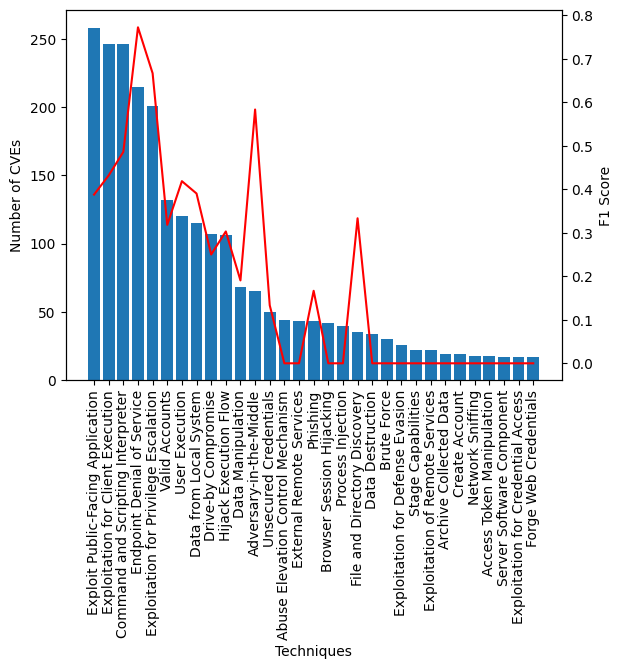

In [131]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


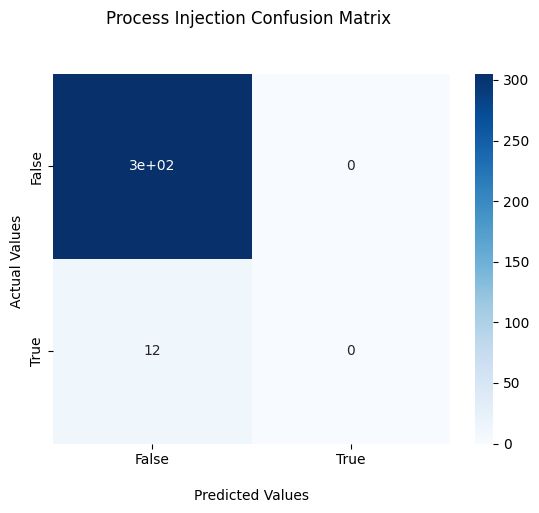

Access Token Manipulation


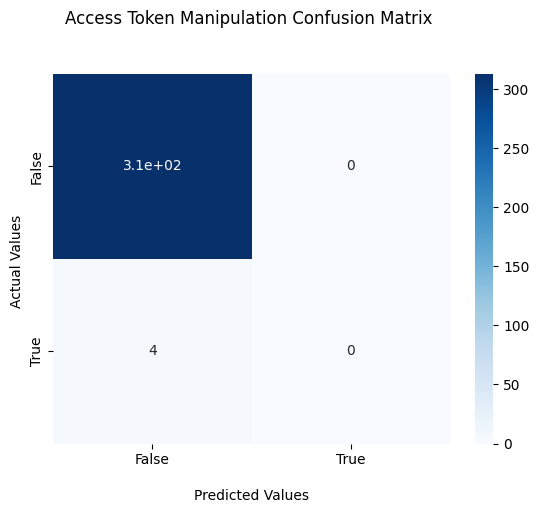

Hijack Execution Flow


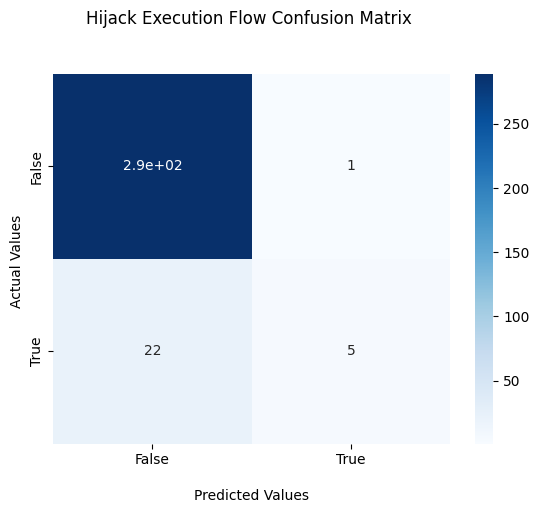

Data from Local System


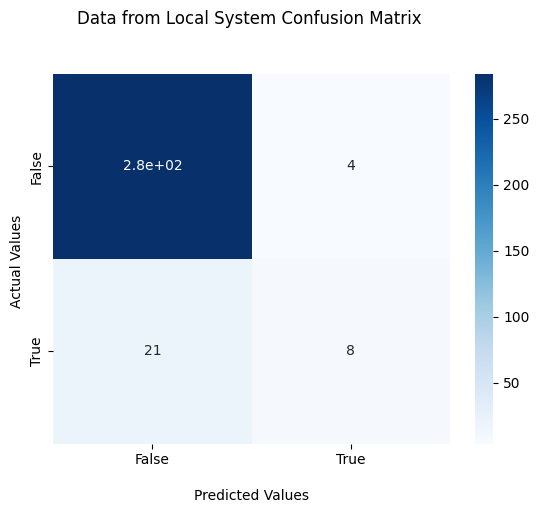

External Remote Services


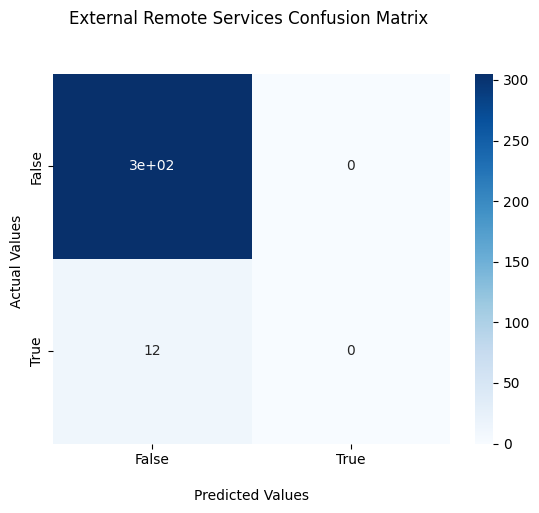

Data Manipulation


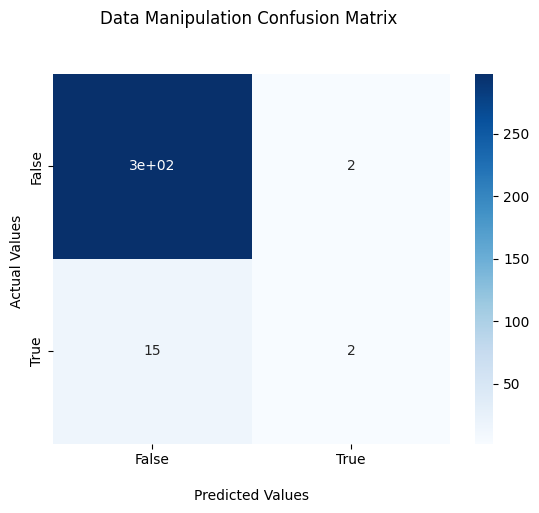

Network Sniffing


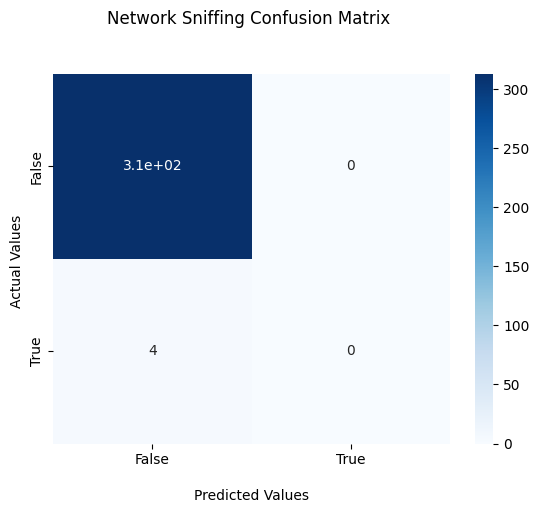

Exploitation for Privilege Escalation


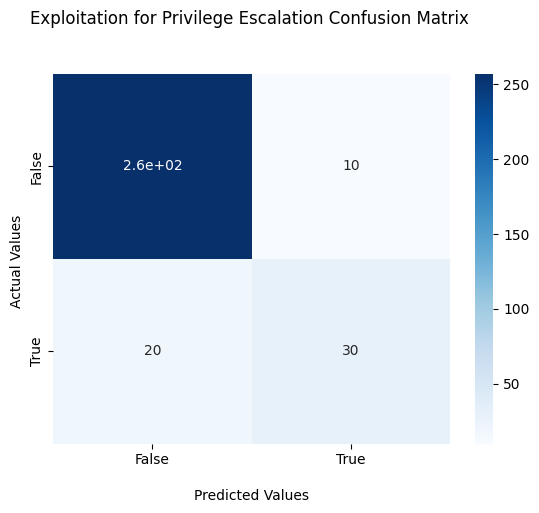

Command and Scripting Interpreter


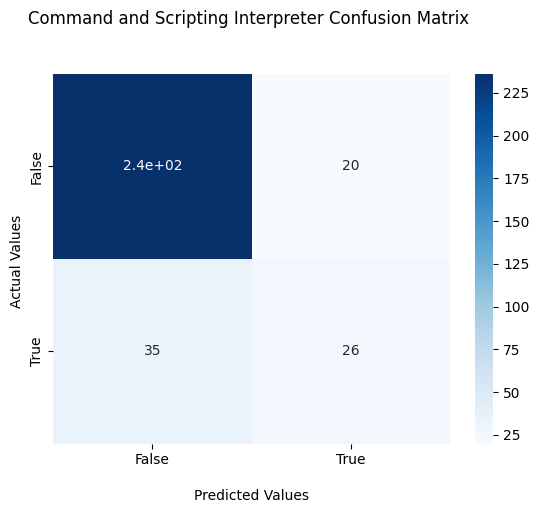

Phishing


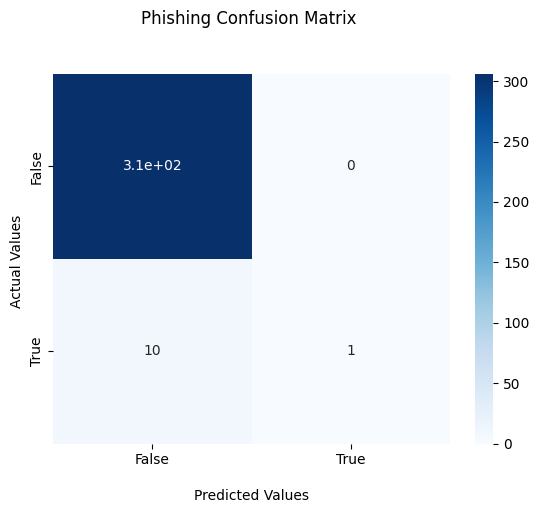

Server Software Component


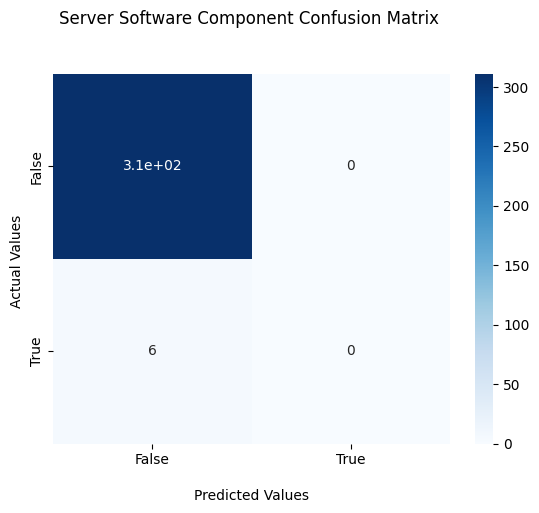

Archive Collected Data


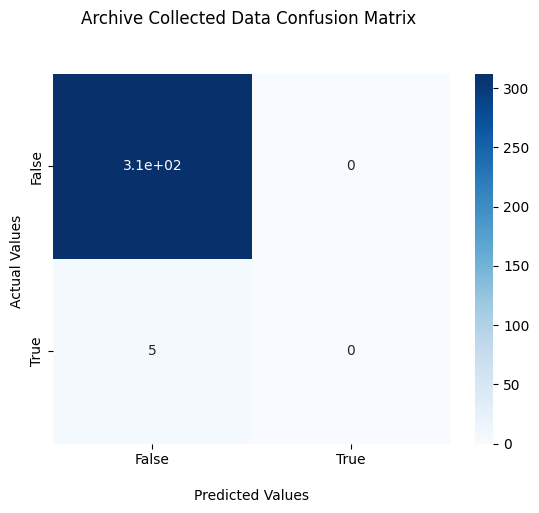

Data Destruction


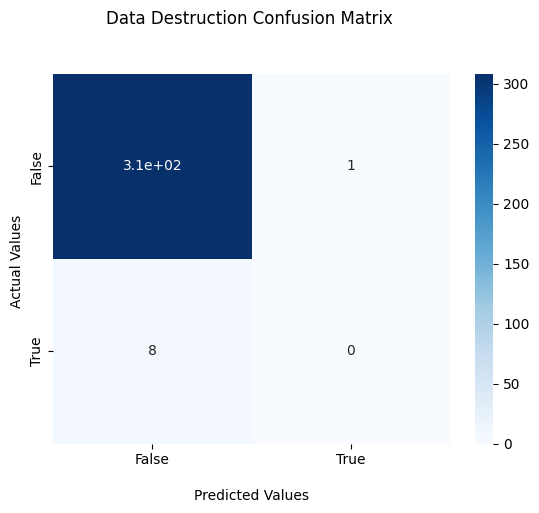

Browser Session Hijacking


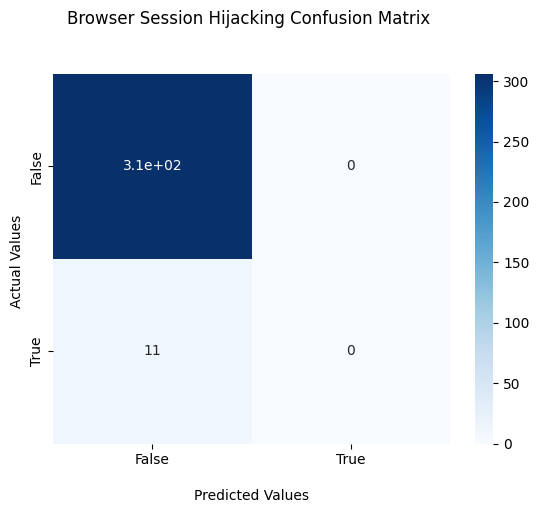

Exploitation for Credential Access


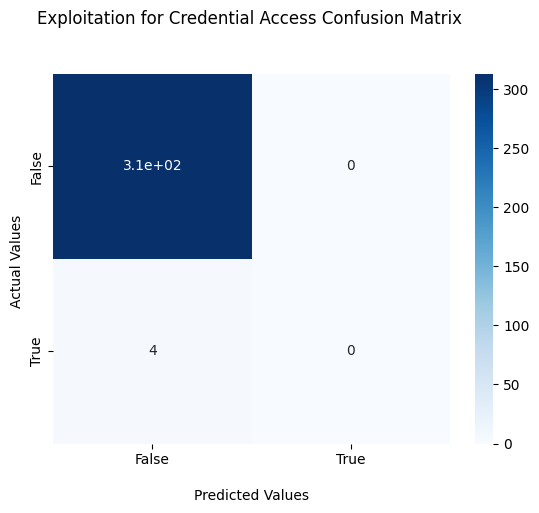

Abuse Elevation Control Mechanism


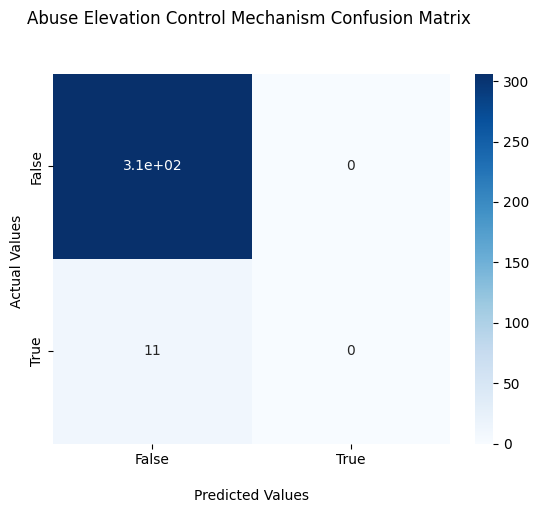

Adversary-in-the-Middle


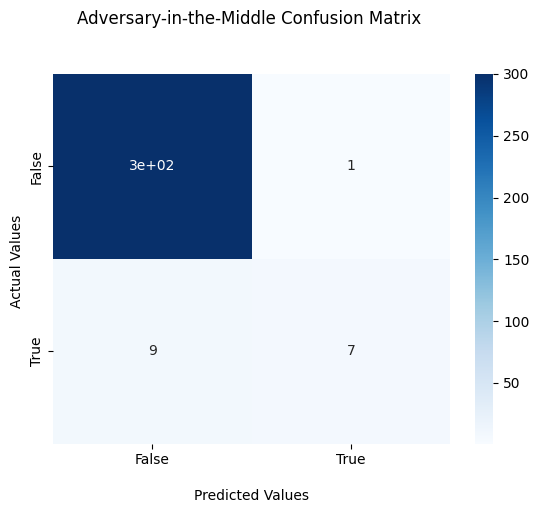

User Execution


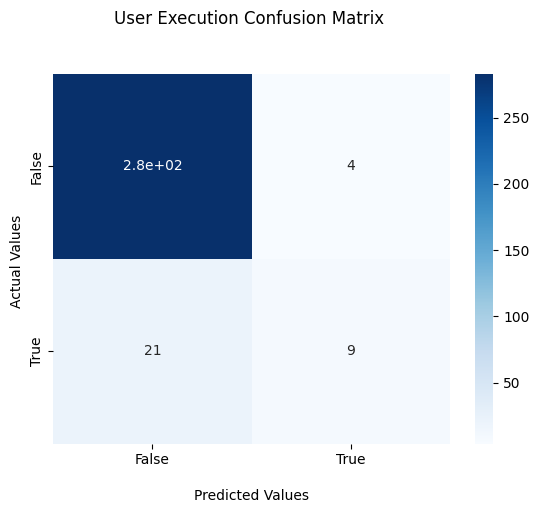

Unsecured Credentials


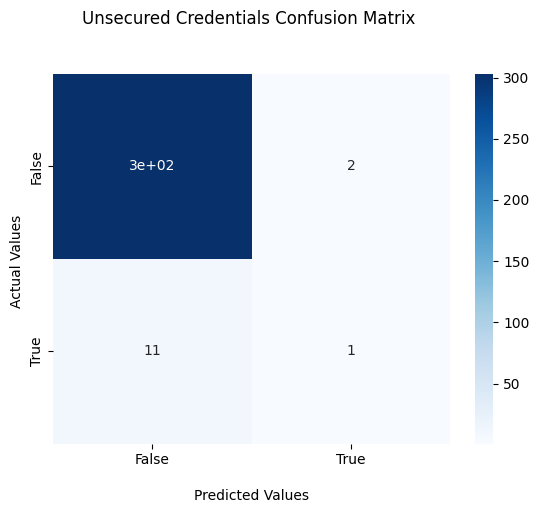

Brute Force


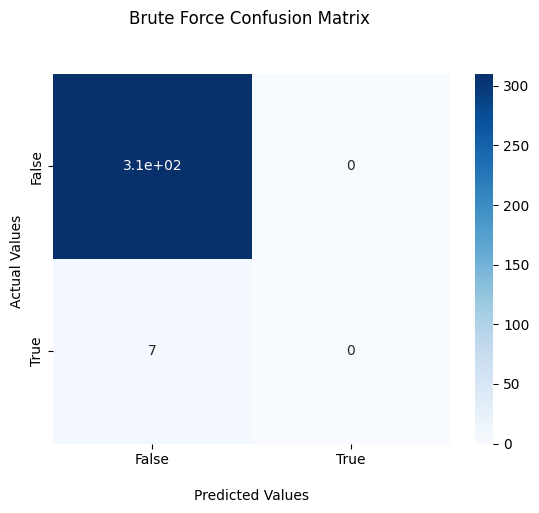

File and Directory Discovery


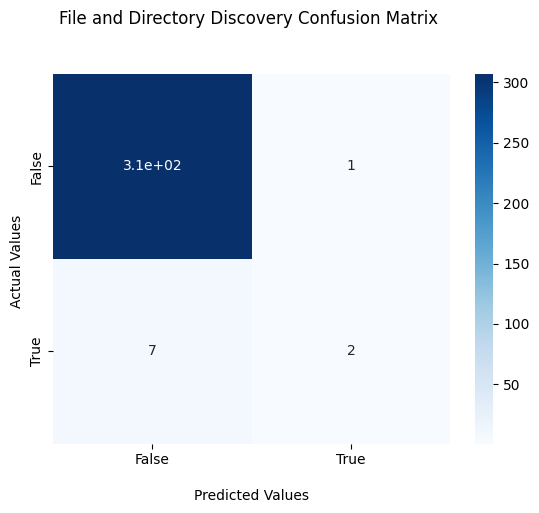

Valid Accounts


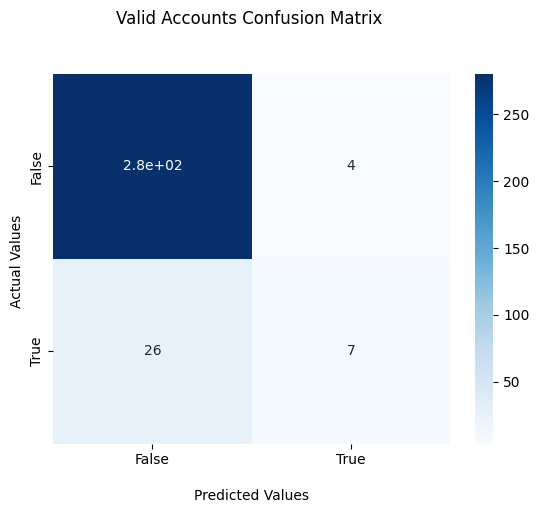

Exploitation for Defense Evasion


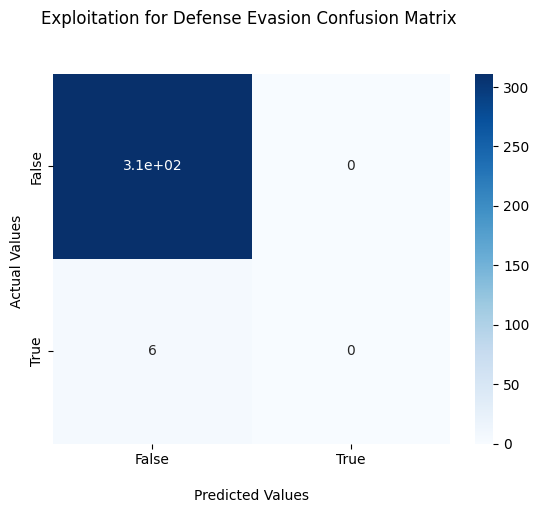

Create Account


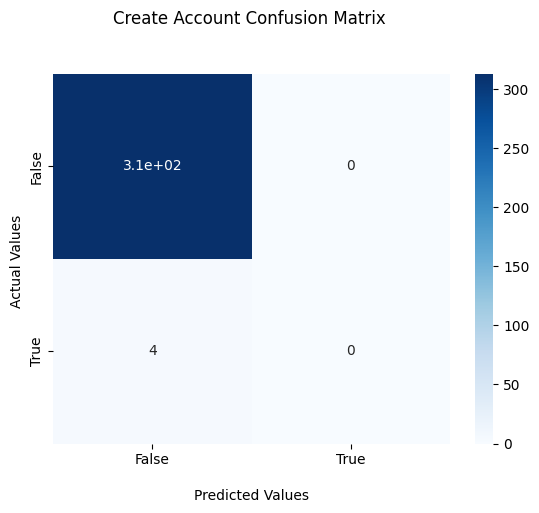

Endpoint Denial of Service


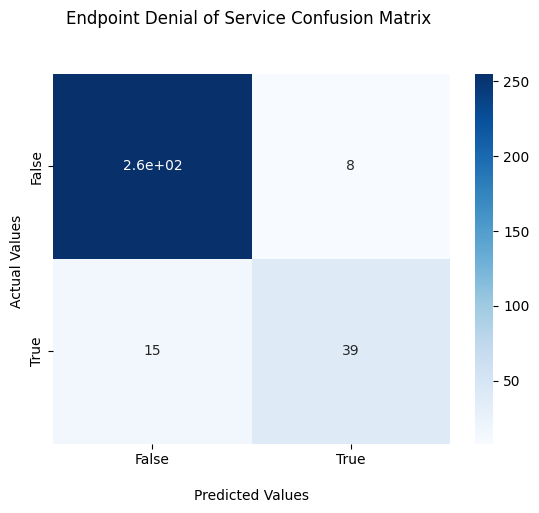

Drive-by Compromise


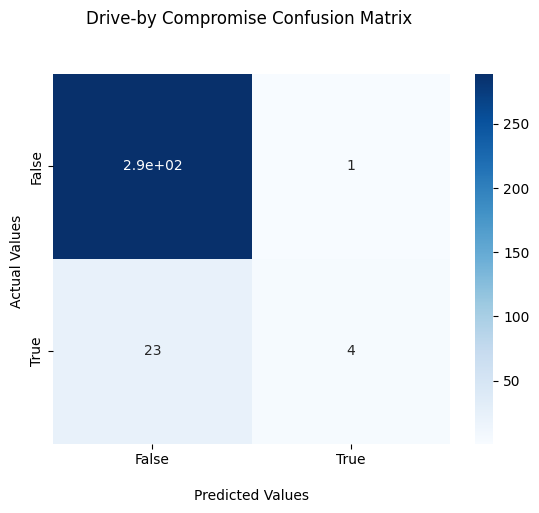

Exploitation for Client Execution


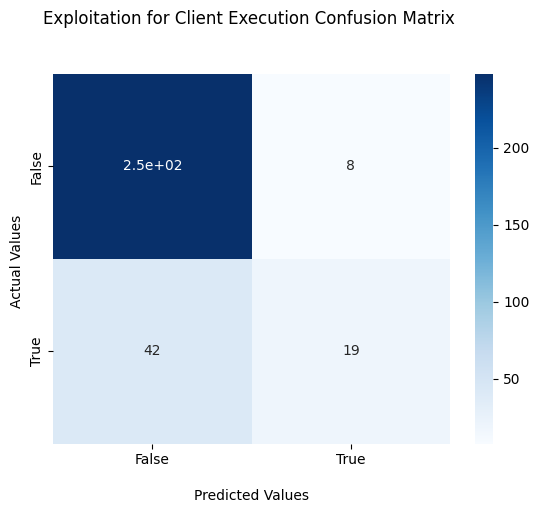

Exploitation of Remote Services


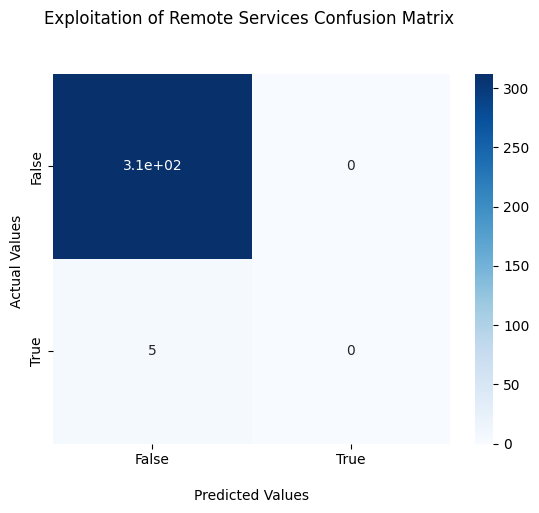

Stage Capabilities


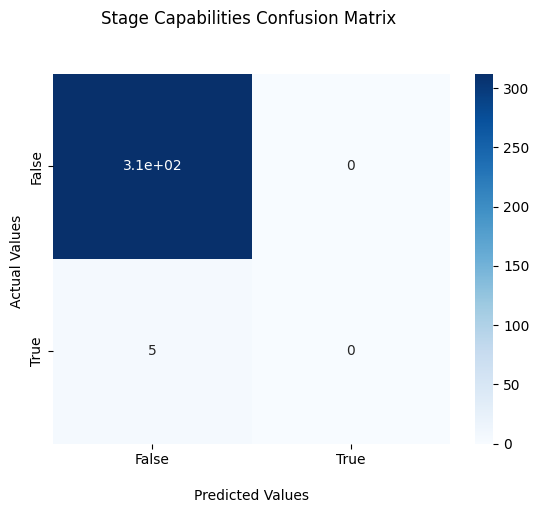

Exploit Public-Facing Application


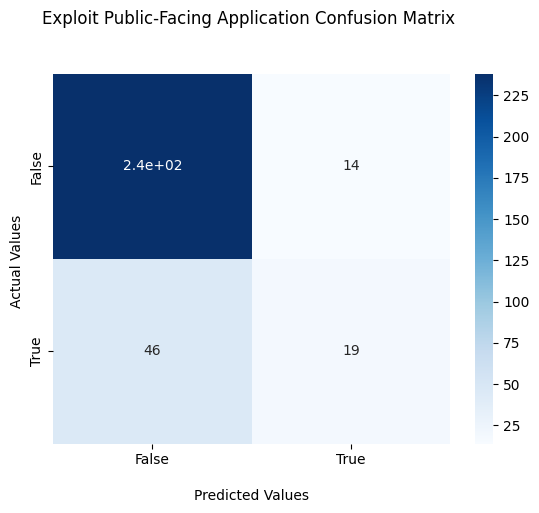

Forge Web Credentials


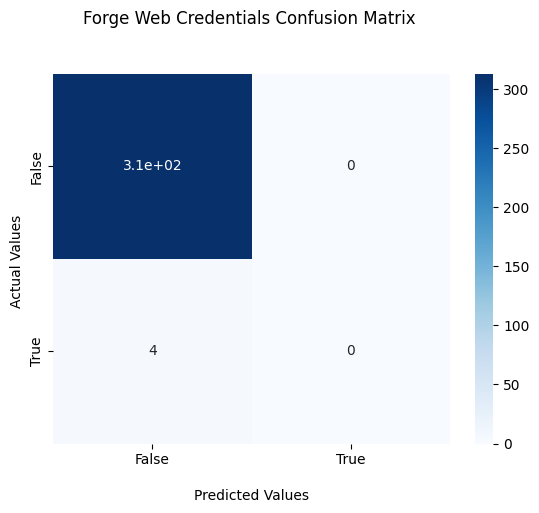

In [132]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

Multi-label SecBERT


In [133]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer
     

In [134]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [135]:
(X_train, y_train) = load_data_from_file('/kaggle/input/input-files/X_train.csv', '/kaggle/input/input-files/y_train.csv')
(X_train_extended, y_train_extended) = load_data_from_file('/kaggle/input/input-files/final_extended_X_train.csv', '/kaggle/input/input-files/final_extended_y_train.csv')
(X_test, y_test) = load_data_from_file('/kaggle/input/input-files/X_test.csv', '/kaggle/input/input-files/y_test.csv')

In [136]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens

In [137]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]

In [138]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [139]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [140]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'jackaduma/SecBERT'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 320
    self.BATCH_SIZE = 16
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

config.json:   0%|          | 0.00/467 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

In [141]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        padding='max_length',   
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }

In [142]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([16, 320])
attention_mask shape: torch.Size([16, 320])
labels shape: torch.Size([16, 31])


In [143]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.5)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x
     

In [144]:
# device = config.DEVICE
# device
# device = config.DEVICE
# device
import torch

# In your config
config.DEVICE = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

# Then everywhere you call
device = config.DEVICE

In [145]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)


In [146]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score

Train

In [147]:

model = Model()
model.to(device);

model.safetensors:   0%|          | 0.00/336M [00:00<?, ?B/s]

In [148]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.2838393449783325
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 56
Eval Val loss: 0.23696813806891442
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 84
Eval Val loss: 0.2203696109354496
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.3120094630648108
Eval Val loss: 0.2203696109354496
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.21324381977319717
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 56
Eval Val loss: 0.2104824773967266
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 84
Eval Val loss: 0.20866364762187004
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.2131246154799181
Eval Val loss: 0.20866364762187004
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 1/50: F1 Score 0.0


Epoch 2:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.20702015608549118
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 56
Eval Val loss: 0.20490730032324792
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 84
Eval Val loss: 0.20090968459844588
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20440377470325022
Eval Val loss: 0.20090968459844588
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 2/50: F1 Score 0.0


Epoch 3:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19800939336419104
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.01948051948051948
-- Step: 56
Eval Val loss: 0.19519539102911948
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.006535947712418301
-- Step: 84
Eval Val loss: 0.19153715819120407
Eval Val accuracy: 0.025236593059936908
Eval Val micro f1 score: 0.09006211180124224
Training loss: 0.1951165529734948
Eval Val loss: 0.19153715819120407
Eval Val accuracy: 0.025236593059936908
Eval Val micro f1 score: 0.09006211180124224
Epoch 3/50: F1 Score 0.09006211180124224
--- Best Model. Val loss: 0.0 -> 0.09006211180124224


Epoch 4:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1892780490219593
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.13834586466165413
-- Step: 56
Eval Val loss: 0.18802795112133025
Eval Val accuracy: 0.00946372239747634
Eval Val micro f1 score: 0.05705229793977813
-- Step: 84
Eval Val loss: 0.18235656693577768
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.16715542521994134
Training loss: 0.18279873676159802
Eval Val loss: 0.18235656693577768
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.16715542521994134
Epoch 4/50: F1 Score 0.16715542521994134
--- Best Model. Val loss: 0.09006211180124224 -> 0.16715542521994134


Epoch 5:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.18169287070631981
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.15789473684210525
-- Step: 56
Eval Val loss: 0.18649743869900703
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.11624441132637854
-- Step: 84
Eval Val loss: 0.17578302919864655
Eval Val accuracy: 0.0473186119873817
Eval Val micro f1 score: 0.23756906077348067
Training loss: 0.1693967028575785
Eval Val loss: 0.17578302919864655
Eval Val accuracy: 0.0473186119873817
Eval Val micro f1 score: 0.23756906077348067
Epoch 5/50: F1 Score 0.23756906077348067
--- Best Model. Val loss: 0.16715542521994134 -> 0.23756906077348067


Epoch 6:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17533751018345356
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.20891364902506962
-- Step: 56
Eval Val loss: 0.18510448113083838
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.19973368841544606
-- Step: 84
Eval Val loss: 0.17364694327116012
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2643524699599466
Training loss: 0.15833150209749447
Eval Val loss: 0.17364694327116012
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2643524699599466
Epoch 6/50: F1 Score 0.2643524699599466
--- Best Model. Val loss: 0.23756906077348067 -> 0.2643524699599466


Epoch 7:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.16991305053234101
Eval Val accuracy: 0.0473186119873817
Eval Val micro f1 score: 0.21560283687943263
-- Step: 56
Eval Val loss: 0.1781056009232998
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.26022304832713755
-- Step: 84
Eval Val loss: 0.17151944525539875
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.2871927554980595
Training loss: 0.1416110668988789
Eval Val loss: 0.17151944525539875
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.2871927554980595
Epoch 7/50: F1 Score 0.2871927554980595
--- Best Model. Val loss: 0.2643524699599466 -> 0.2871927554980595


Epoch 8:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.16799333579838277
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.23803009575923392
-- Step: 56
Eval Val loss: 0.17606237530708313
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3156626506024096
-- Step: 84
Eval Val loss: 0.17208402939140796
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.2724867724867725
Training loss: 0.1300979479270823
Eval Val loss: 0.17208402939140796
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.2724867724867725
Epoch 8/50: F1 Score 0.2724867724867725


Epoch 9:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1669899482280016
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.3016905071521457
-- Step: 56
Eval Val loss: 0.1765280608087778
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3317972350230414
-- Step: 84
Eval Val loss: 0.16848492622375488
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.30749354005167956
Training loss: 0.1193227181539816
Eval Val loss: 0.16848492622375488
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.30749354005167956
Epoch 9/50: F1 Score 0.30749354005167956
--- Best Model. Val loss: 0.2871927554980595 -> 0.30749354005167956


Epoch 10:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.16579379178583623
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3286624203821656
-- Step: 56
Eval Val loss: 0.17282926440238952
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.37500000000000006
-- Step: 84
Eval Val loss: 0.17030370309948922
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.315
Training loss: 0.10805084477452671
Eval Val loss: 0.17030370309948922
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.315
Epoch 10/50: F1 Score 0.315
--- Best Model. Val loss: 0.30749354005167956 -> 0.315


Epoch 11:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.166257543861866
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3685446009389671
-- Step: 56
Eval Val loss: 0.1711033448576927
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.40044742729306493
-- Step: 84
Eval Val loss: 0.16876675710082054
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.34264884568651277
Training loss: 0.09989527661134215
Eval Val loss: 0.16876675710082054
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.34264884568651277
Epoch 11/50: F1 Score 0.34264884568651277
--- Best Model. Val loss: 0.315 -> 0.34264884568651277


Epoch 12:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.16621001586318015
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.37441860465116283
-- Step: 56
Eval Val loss: 0.16649776622653006
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4050343249427918
-- Step: 84
Eval Val loss: 0.16638770438730716
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.36860879904875155
Training loss: 0.0918242389226661
Eval Val loss: 0.16638770438730716
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.36860879904875155
Epoch 12/50: F1 Score 0.36860879904875155
--- Best Model. Val loss: 0.34264884568651277 -> 0.36860879904875155


Epoch 13:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.16477898731827736
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.39595050618672667
-- Step: 56
Eval Val loss: 0.17011774517595768
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.41657579062159217
-- Step: 84
Eval Val loss: 0.1688345268368721
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.36992840095465396
Training loss: 0.0840787253835622
Eval Val loss: 0.1688345268368721
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.36992840095465396
Epoch 13/50: F1 Score 0.36992840095465396
--- Best Model. Val loss: 0.36860879904875155 -> 0.36992840095465396


Epoch 14:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.16688704453408718
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.38039673278879815
-- Step: 56
Eval Val loss: 0.1747663889080286
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.42006269592476486
-- Step: 84
Eval Val loss: 0.17277770563960076
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.37236533957845436
Training loss: 0.07784105881172068
Eval Val loss: 0.17277770563960076
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.37236533957845436
Epoch 14/50: F1 Score 0.37236533957845436
--- Best Model. Val loss: 0.36992840095465396 -> 0.37236533957845436


Epoch 15:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17070229053497316
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.3944636678200692
-- Step: 56
Eval Val loss: 0.17687636949121952
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.37569060773480656
-- Step: 84
Eval Val loss: 0.1734224170446396
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4023121387283237
Training loss: 0.07144572105916107
Eval Val loss: 0.1734224170446396
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4023121387283237
Epoch 15/50: F1 Score 0.4023121387283237
--- Best Model. Val loss: 0.37236533957845436 -> 0.4023121387283237


Epoch 16:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17179603688418865
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.39449541284403666
-- Step: 56
Eval Val loss: 0.18499927930533885
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.39375000000000004
-- Step: 84
Eval Val loss: 0.1739507745951414
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.38479809976247026
Training loss: 0.06701705679297447
Eval Val loss: 0.1739507745951414
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.38479809976247026
Epoch 16/50: F1 Score 0.38479809976247026


Epoch 17:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17204760387539864
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.37995337995337997
-- Step: 56
Eval Val loss: 0.19637309946119785
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3976833976833977
-- Step: 84
Eval Val loss: 0.17683210149407386
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.399529964747356
Training loss: 0.06367235654855476
Eval Val loss: 0.17683210149407386
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.399529964747356
Epoch 17/50: F1 Score 0.399529964747356


Epoch 18:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.16929909363389015
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4151785714285714
-- Step: 56
Eval Val loss: 0.18411112613976002
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.42136498516320475
-- Step: 84
Eval Val loss: 0.17535215355455874
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.39629200463499425
Training loss: 0.05966977251364904
Eval Val loss: 0.17535215355455874
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.39629200463499425
Epoch 18/50: F1 Score 0.39629200463499425


Epoch 19:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1694494403898716
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.41417497231450723
-- Step: 56
Eval Val loss: 0.17581674680113793
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.43769633507853406
-- Step: 84
Eval Val loss: 0.17393676564097404
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.3981264637002342
Training loss: 0.05553587035221212
Eval Val loss: 0.17393676564097404
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.3981264637002342
Epoch 19/50: F1 Score 0.3981264637002342


Epoch 20:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1698293212801218
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4179775280898876
-- Step: 56
Eval Val loss: 0.1794303387403488
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.423982869379015
-- Step: 84
Eval Val loss: 0.17750624790787697
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.37590361445783127
Training loss: 0.05061686882639632
Eval Val loss: 0.17750624790787697
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.37590361445783127
Epoch 20/50: F1 Score 0.37590361445783127


Epoch 21:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17221719548106193
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42151481888035125
-- Step: 56
Eval Val loss: 0.1781589835882187
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.430540827147402
-- Step: 84
Eval Val loss: 0.17613045312464237
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.3947990543735224
Training loss: 0.047951412398148985
Eval Val loss: 0.17613045312464237
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.3947990543735224
Epoch 21/50: F1 Score 0.3947990543735224


Epoch 22:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17392101436853408
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.42857142857142855
-- Step: 56
Eval Val loss: 0.18114921897649766
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42149631190727077
-- Step: 84
Eval Val loss: 0.1775397028774023
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4144960362400906
Training loss: 0.04503234503242899
Eval Val loss: 0.1775397028774023
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4144960362400906
Epoch 22/50: F1 Score 0.4144960362400906
--- Best Model. Val loss: 0.4023121387283237 -> 0.4144960362400906


Epoch 23:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17379588969051837
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4240437158469945
-- Step: 56
Eval Val loss: 0.18021017089486122
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42116630669546434
-- Step: 84
Eval Val loss: 0.17914429530501366
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.40674157303370784
Training loss: 0.04257044168737005
Eval Val loss: 0.17914429530501366
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.40674157303370784
Epoch 23/50: F1 Score 0.40674157303370784


Epoch 24:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17596780359745026
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4022598870056497
-- Step: 56
Eval Val loss: 0.17983945831656456
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.43441762854144805
-- Step: 84
Eval Val loss: 0.1814031943678856
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4116331096196868
Training loss: 0.04001156641718219
Eval Val loss: 0.1814031943678856
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4116331096196868
Epoch 24/50: F1 Score 0.4116331096196868


Epoch 25:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17646888308227063
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.39550561797752815
-- Step: 56
Eval Val loss: 0.17812208756804465
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42947368421052634
-- Step: 84
Eval Val loss: 0.18265386074781417
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4128035320088301
Training loss: 0.03846435023143011
Eval Val loss: 0.18265386074781417
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4128035320088301
Epoch 25/50: F1 Score 0.4128035320088301


Epoch 26:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17698585689067842
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.40229885057471265
-- Step: 56
Eval Val loss: 0.1766028504818678
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.43478260869565216
-- Step: 84
Eval Val loss: 0.18361044600605964
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4180418041804181
Training loss: 0.03648915596525459
Eval Val loss: 0.18361044600605964
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4180418041804181
Epoch 26/50: F1 Score 0.4180418041804181
--- Best Model. Val loss: 0.4144960362400906 -> 0.4180418041804181


Epoch 27:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.17882439866662025
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.40271493212669685
-- Step: 56
Eval Val loss: 0.17763047888875008
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4351464435146443
-- Step: 84
Eval Val loss: 0.18647047244012355
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4222222222222222
Training loss: 0.034518926623551285
Eval Val loss: 0.18647047244012355
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4222222222222222
Epoch 27/50: F1 Score 0.4222222222222222
--- Best Model. Val loss: 0.4180418041804181 -> 0.4222222222222222


Epoch 28:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.178694961220026
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42045454545454547
-- Step: 56
Eval Val loss: 0.17631366550922395
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.45188284518828453
-- Step: 84
Eval Val loss: 0.18747477903962134
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.42358078602620086
Training loss: 0.03360598784159211
Eval Val loss: 0.18747477903962134
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.42358078602620086
Epoch 28/50: F1 Score 0.42358078602620086
--- Best Model. Val loss: 0.4222222222222222 -> 0.42358078602620086


Epoch 29:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.179968523979187
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.40732265446224253
-- Step: 56
Eval Val loss: 0.1771522007882595
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.44539614561027835
-- Step: 84
Eval Val loss: 0.18821362033486366
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42278203723986857
Training loss: 0.03233789287726669
Eval Val loss: 0.18821362033486366
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42278203723986857
Epoch 29/50: F1 Score 0.42278203723986857


Epoch 30:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1816174104809761
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.41855203619909503
-- Step: 56
Eval Val loss: 0.17869161069393158
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.44186046511627913
-- Step: 84
Eval Val loss: 0.18694343008100986
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4240437158469945
Training loss: 0.03132812155081945
Eval Val loss: 0.18694343008100986
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4240437158469945
Epoch 30/50: F1 Score 0.4240437158469945
--- Best Model. Val loss: 0.42358078602620086 -> 0.4240437158469945


Epoch 31:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.18245648220181465
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4153498871331829
-- Step: 56
Eval Val loss: 0.1796992227435112
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4264069264069264
-- Step: 84
Eval Val loss: 0.1861880861222744
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42590559824368823
Training loss: 0.029865522627883098
Eval Val loss: 0.1861880861222744
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42590559824368823
Epoch 31/50: F1 Score 0.42590559824368823
--- Best Model. Val loss: 0.4240437158469945 -> 0.42590559824368823


Epoch 32:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1838497843593359
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4149659863945578
-- Step: 56
Eval Val loss: 0.18142780438065528
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.438918918918919
-- Step: 84
Eval Val loss: 0.18418155796825886
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4324917672886937
Training loss: 0.02866767087184331
Eval Val loss: 0.18418155796825886
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4324917672886937
Epoch 32/50: F1 Score 0.4324917672886937
--- Best Model. Val loss: 0.42590559824368823 -> 0.4324917672886937


Epoch 33:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.18498674258589745
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42117117117117125
-- Step: 56
Eval Val loss: 0.18233399875462056
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.42686890574214514
-- Step: 84
Eval Val loss: 0.18479222767055034
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4334433443344334
Training loss: 0.02762835253139629
Eval Val loss: 0.18479222767055034
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4334433443344334
Epoch 33/50: F1 Score 0.4334433443344334
--- Best Model. Val loss: 0.4324917672886937 -> 0.4334433443344334


Epoch 34:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1872565560042858
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4118316268486916
-- Step: 56
Eval Val loss: 0.1823272667825222
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42516268980477223
-- Step: 84
Eval Val loss: 0.184150779992342
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.43278688524590164
Training loss: 0.02679582497871974
Eval Val loss: 0.184150779992342
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.43278688524590164
Epoch 34/50: F1 Score 0.43278688524590164


Epoch 35:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.18788950741291047
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.41277080957810713
-- Step: 56
Eval Val loss: 0.18355943858623505
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4362850971922246
-- Step: 84
Eval Val loss: 0.18574811667203903
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.437636761487965
Training loss: 0.025660737373811356
Eval Val loss: 0.18574811667203903
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.437636761487965
Epoch 35/50: F1 Score 0.437636761487965
--- Best Model. Val loss: 0.4334433443344334 -> 0.437636761487965


Epoch 36:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.18906174041330814
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.40966628308400455
-- Step: 56
Eval Val loss: 0.18430477119982241
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4385026737967914
-- Step: 84
Eval Val loss: 0.18632570505142212
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4410480349344978
Training loss: 0.025066848192363978
Eval Val loss: 0.18632570505142212
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4410480349344978
Epoch 36/50: F1 Score 0.4410480349344978
--- Best Model. Val loss: 0.437636761487965 -> 0.4410480349344978


Epoch 37:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.18948132693767547
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.41676104190260477
-- Step: 56
Eval Val loss: 0.18555774949491025
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.43260869565217386
-- Step: 84
Eval Val loss: 0.18578620366752147
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4336569579288026
Training loss: 0.02424775211359648
Eval Val loss: 0.18578620366752147
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4336569579288026
Epoch 37/50: F1 Score 0.4336569579288026


Epoch 38:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1927006036043167
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4106113033448674
-- Step: 56
Eval Val loss: 0.1860254541039467
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.44181034482758613
-- Step: 84
Eval Val loss: 0.18631320036947727
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.442286947141316
Training loss: 0.023842182437724926
Eval Val loss: 0.18631320036947727
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.442286947141316
Epoch 38/50: F1 Score 0.442286947141316
--- Best Model. Val loss: 0.4410480349344978 -> 0.442286947141316


Epoch 39:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19231463596224785
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4225028702640643
-- Step: 56
Eval Val loss: 0.18804021812975408
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4290429042904291
-- Step: 84
Eval Val loss: 0.18718729615211488
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44064171122994655
Training loss: 0.023304486691075214
Eval Val loss: 0.18718729615211488
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44064171122994655
Epoch 39/50: F1 Score 0.44064171122994655


Epoch 40:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19403314553201198
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.40977881257275905
-- Step: 56
Eval Val loss: 0.18952390290796756
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4161073825503356
-- Step: 84
Eval Val loss: 0.18748232796788217
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44064171122994655
Training loss: 0.022968579510993816
Eval Val loss: 0.18748232796788217
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44064171122994655
Epoch 40/50: F1 Score 0.44064171122994655


Epoch 41:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19308824017643927
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.41924398625429554
-- Step: 56
Eval Val loss: 0.19096392281353475
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.42117117117117125
-- Step: 84
Eval Val loss: 0.18825405277311802
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4353448275862069
Training loss: 0.0223989392959458
Eval Val loss: 0.18825405277311802
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4353448275862069
Epoch 41/50: F1 Score 0.4353448275862069


Epoch 42:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19218982048332692
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.41223103057757643
-- Step: 56
Eval Val loss: 0.19227071814239025
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.41733181299885974
-- Step: 84
Eval Val loss: 0.18921799249947072
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4358144552319309
Training loss: 0.02193962649497039
Eval Val loss: 0.18921799249947072
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4358144552319309
Epoch 42/50: F1 Score 0.4358144552319309


Epoch 43:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19162655360996722
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.42117117117117125
-- Step: 56
Eval Val loss: 0.19381551668047906
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4182857142857143
-- Step: 84
Eval Val loss: 0.18978832364082338
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4427480916030535
Training loss: 0.02150768078315784
Eval Val loss: 0.18978832364082338
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4427480916030535
Epoch 43/50: F1 Score 0.4427480916030535
--- Best Model. Val loss: 0.442286947141316 -> 0.4427480916030535


Epoch 44:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19121227227151394
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.43032329988851725
-- Step: 56
Eval Val loss: 0.19232311137020588
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4239007891770011
-- Step: 84
Eval Val loss: 0.19046235755085944
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.44004400440044
Training loss: 0.021208062187275466
Eval Val loss: 0.19046235755085944
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.44004400440044
Epoch 44/50: F1 Score 0.44004400440044


Epoch 45:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.1922473881393671
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.42666666666666664
-- Step: 56
Eval Val loss: 0.1933530941605568
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4234234234234235
-- Step: 84
Eval Val loss: 0.19197335429489612
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.44004400440044
Training loss: 0.0210711826405981
Eval Val loss: 0.19197335429489612
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.44004400440044
Epoch 45/50: F1 Score 0.44004400440044


Epoch 46:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19183925203979016
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4361233480176212
-- Step: 56
Eval Val loss: 0.19336171969771385
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.43032329988851725
-- Step: 84
Eval Val loss: 0.19234274439513682
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4388092613009923
Training loss: 0.020964295077411568
Eval Val loss: 0.19234274439513682
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4388092613009923
Epoch 46/50: F1 Score 0.4388092613009923


Epoch 47:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19230409674346446
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42967884828349945
-- Step: 56
Eval Val loss: 0.19311817921698093
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4271412680756396
-- Step: 84
Eval Val loss: 0.19312918335199356
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4280936454849498
Training loss: 0.020619758837582432
Eval Val loss: 0.19312918335199356
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4280936454849498
Epoch 47/50: F1 Score 0.4280936454849498


Epoch 48:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19267152510583402
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4288888888888889
-- Step: 56
Eval Val loss: 0.19308506399393083
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4280936454849498
-- Step: 84
Eval Val loss: 0.1930300511419773
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4298440979955456
Training loss: 0.020351593010127546
Eval Val loss: 0.1930300511419773
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4298440979955456
Epoch 48/50: F1 Score 0.4298440979955456


Epoch 49:   0%|          | 0/85 [00:00<?, ?it/s]

-- Step: 28
Eval Val loss: 0.19279302507638932
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4293659621802002
-- Step: 56
Eval Val loss: 0.19282893612980842
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.42761692650334077
-- Step: 84
Eval Val loss: 0.19283734858036042
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4298440979955456
Training loss: 0.020235499383552985
Eval Val loss: 0.19283734858036042
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4298440979955456
Epoch 49/50: F1 Score 0.4298440979955456


Test

In [149]:
test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)

In [150]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [151]:
test_pred = predict(best_model)

In [152]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [153]:

print(accuracy_score(y_test.values, test_pred))

0.17034700315457413


In [154]:

pd.set_option('display.max_columns', None)
print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Drive-by Compromise,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Exploitation for Client Execution,Command and Scripting Interpreter,Unsecured Credentials,User Execution,File and Directory Discovery,Archive Collected Data,Hijack Execution Flow,Exploit Public-Facing Application,Valid Accounts,Data from Local System,Phishing,Brute Force,Data Manipulation,Browser Session Hijacking,Server Software Component,Access Token Manipulation,Process Injection,External Remote Services,Network Sniffing,Exploitation for Credential Access,Data Destruction,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.787879,0.652174,0.64,0.6,0.537634,0.530973,0.526316,0.439024,0.363636,0.333333,0.324324,0.323232,0.304348,0.3,0.285714,0.25,0.24,0.142857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [155]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Drive-by Compromise,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Command and Scripting Interpreter,Unsecured Credentials,Exploitation for Client Execution,User Execution,Exploit Public-Facing Application,File and Directory Discovery,Hijack Execution Flow,Valid Accounts,Data from Local System,Archive Collected Data,Phishing,Data Manipulation,Brute Force,Browser Session Hijacking,Server Software Component,Access Token Manipulation,Process Injection,External Remote Services,Network Sniffing,Exploitation for Credential Access,Data Destruction,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.722222,0.555556,0.54,0.5,0.491803,0.416667,0.409836,0.3,0.246154,0.222222,0.222222,0.212121,0.206897,0.2,0.181818,0.176471,0.142857,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [156]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Archive Collected Data,Brute Force,File and Directory Discovery,Adversary-in-the-Middle,Endpoint Denial of Service,User Execution,Drive-by Compromise,Exploitation for Client Execution,Unsecured Credentials,Exploitation for Privilege Escalation,Phishing,Hijack Execution Flow,Command and Scripting Interpreter,Data from Local System,Valid Accounts,Exploit Public-Facing Application,Data Manipulation,Browser Session Hijacking,Server Software Component,Access Token Manipulation,Process Injection,External Remote Services,Network Sniffing,Exploitation for Credential Access,Data Destruction,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,1.0,1.0,1.0,0.888889,0.866667,0.818182,0.789474,0.78125,0.714286,0.675,0.666667,0.6,0.576923,0.545455,0.538462,0.470588,0.375,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [157]:

print(f1_score(y_test.values, test_pred, average='weighted'))

0.40829469920613337


In [158]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.33278688524590166


In [159]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5750886891584056


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


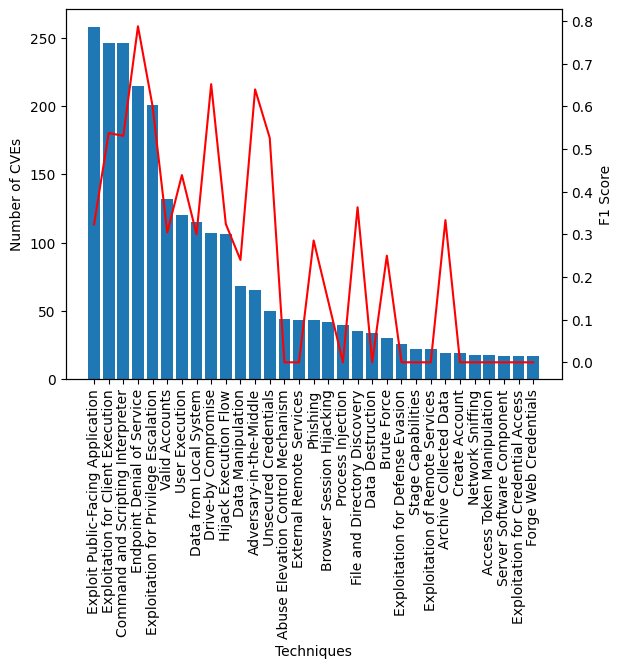

In [160]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


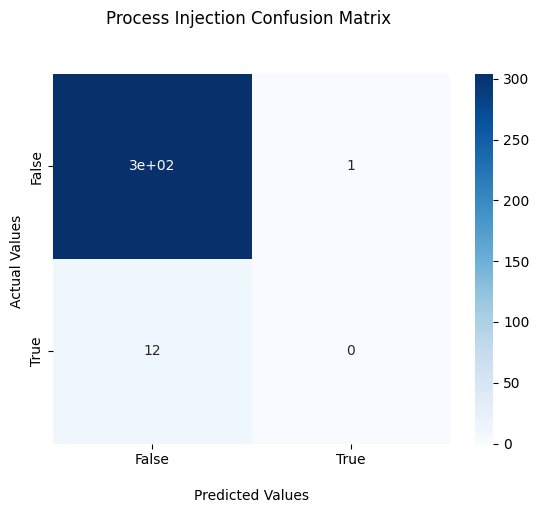

Access Token Manipulation


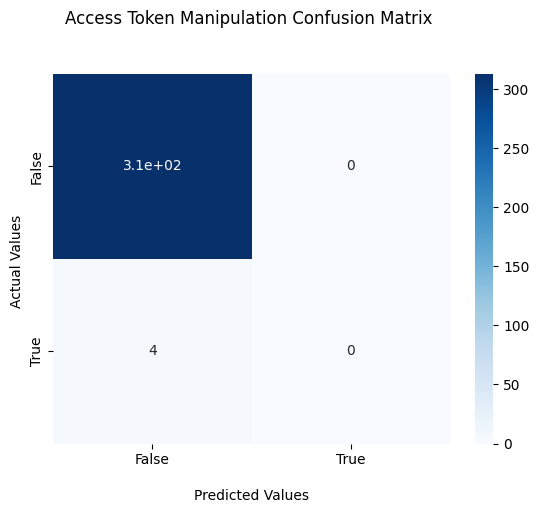

Hijack Execution Flow


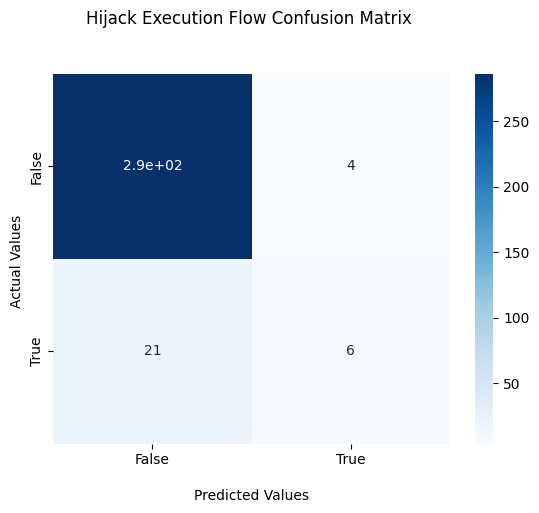

Data from Local System


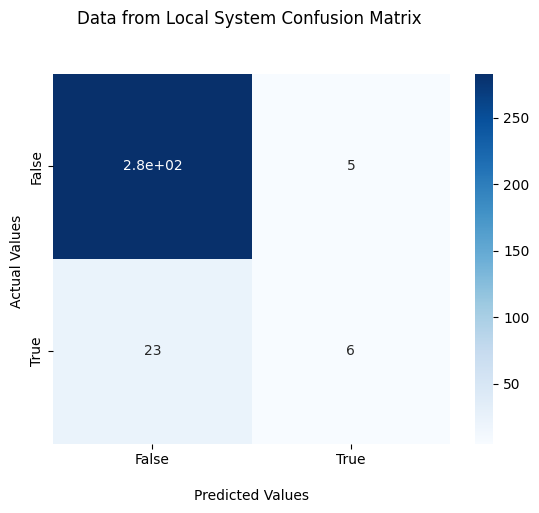

External Remote Services


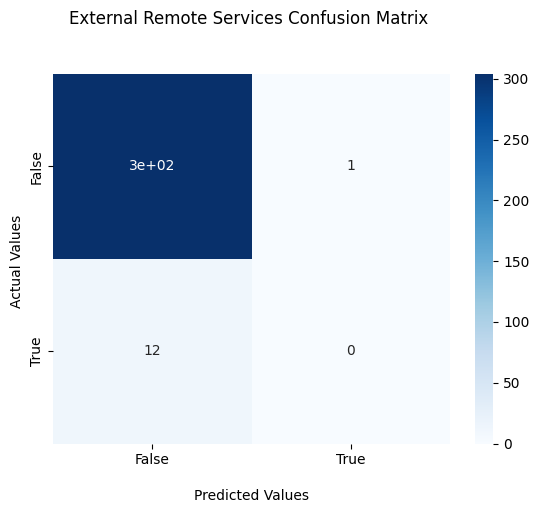

Data Manipulation


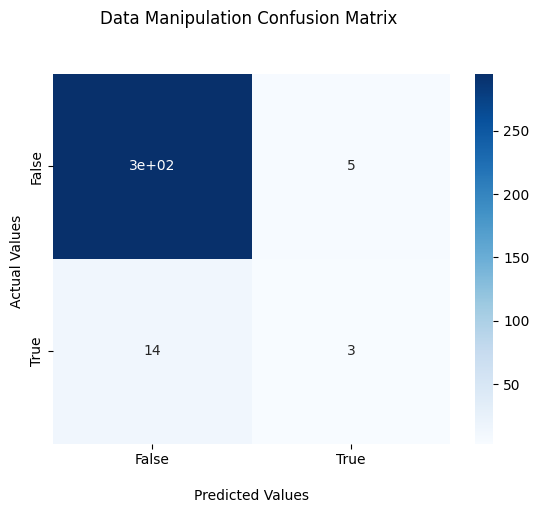

Network Sniffing


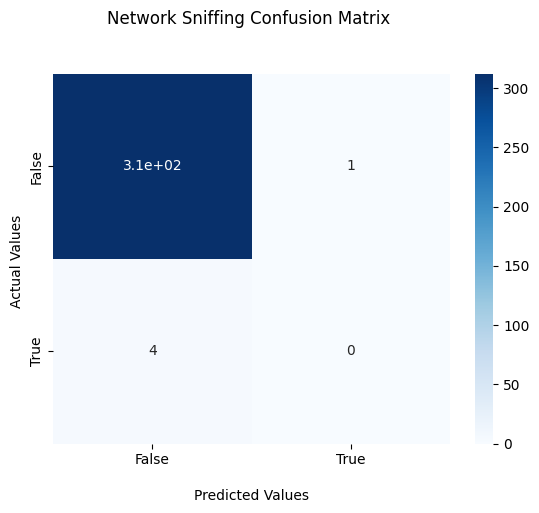

Exploitation for Privilege Escalation


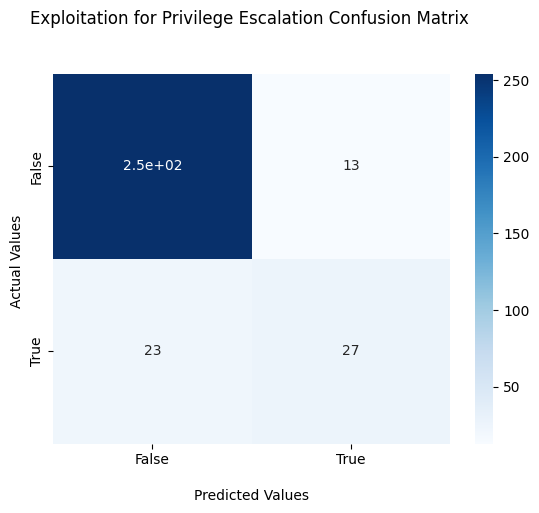

Command and Scripting Interpreter


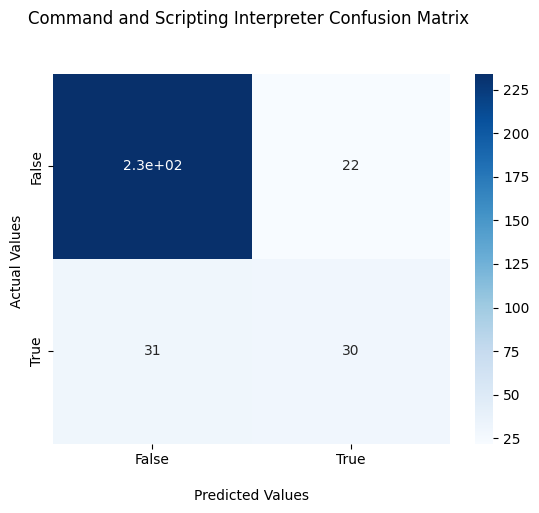

Phishing


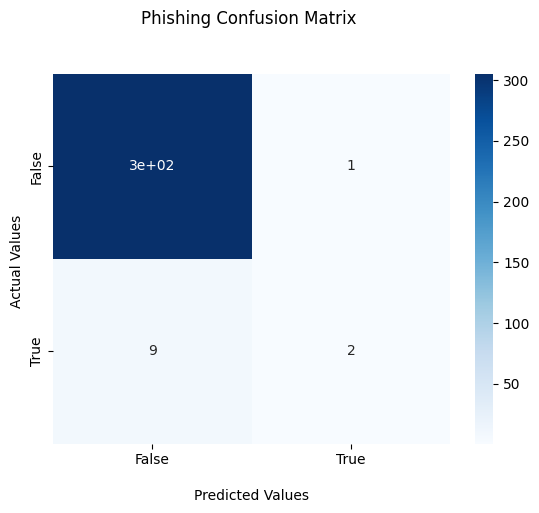

Server Software Component


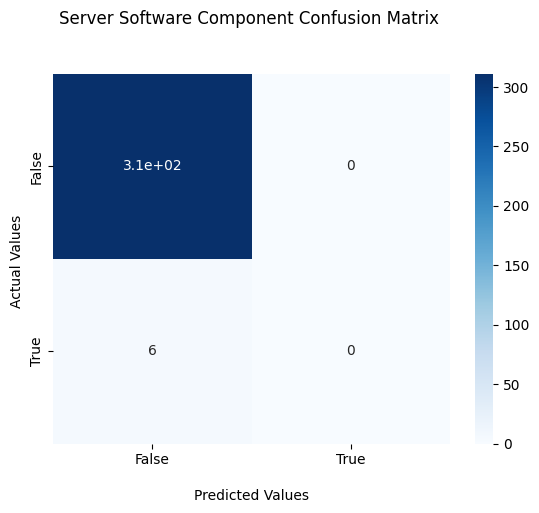

Archive Collected Data


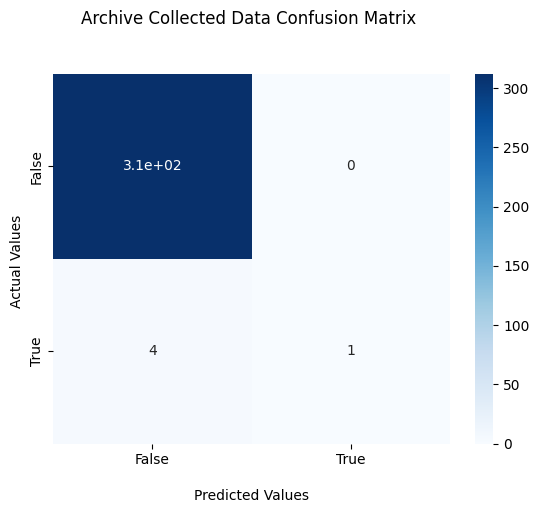

Data Destruction


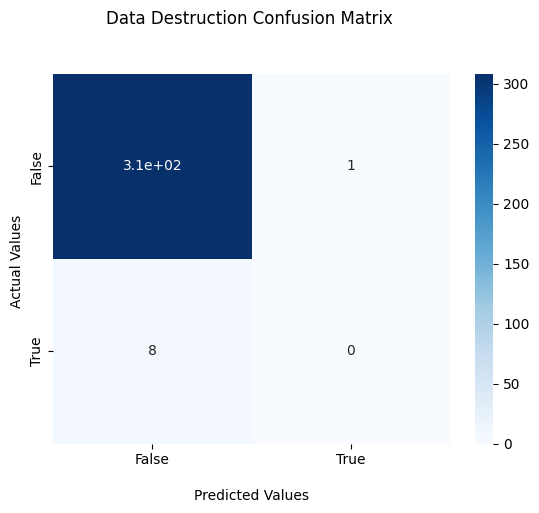

Browser Session Hijacking


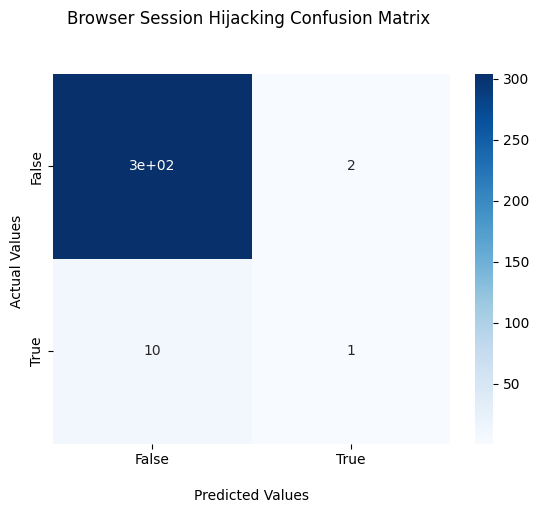

Exploitation for Credential Access


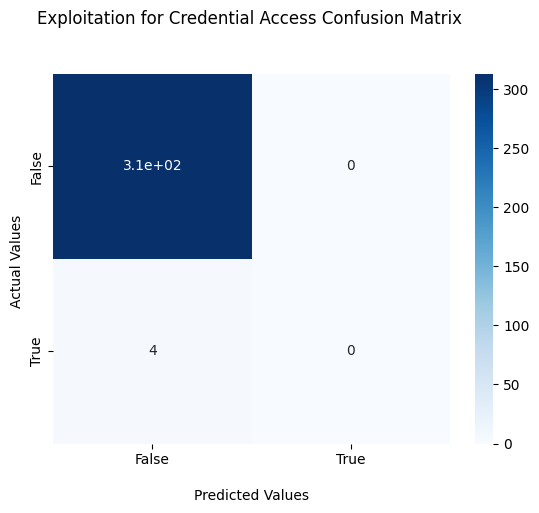

Abuse Elevation Control Mechanism


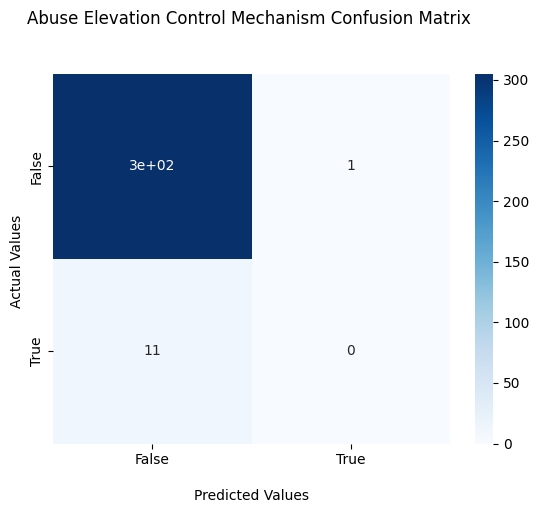

Adversary-in-the-Middle


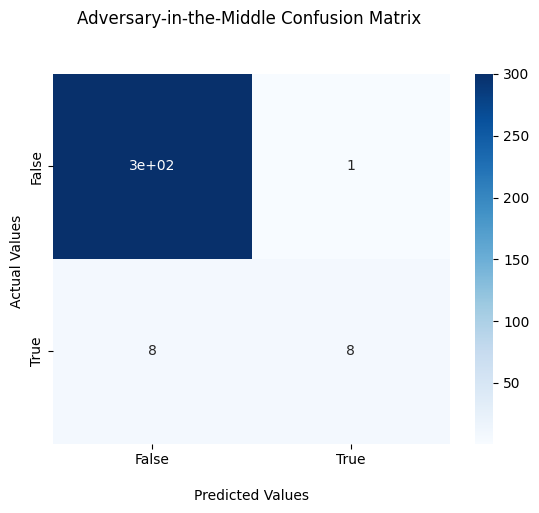

User Execution


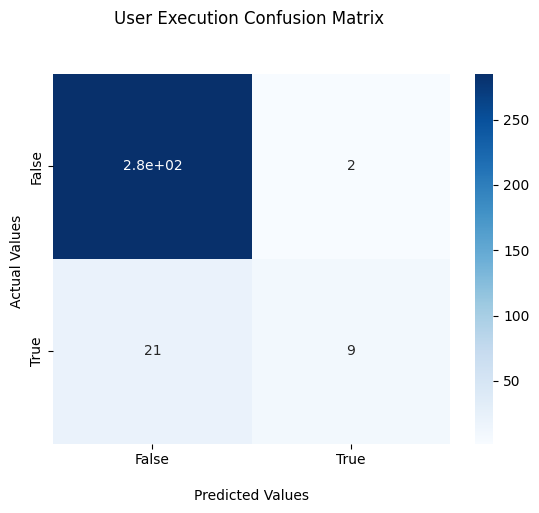

Unsecured Credentials


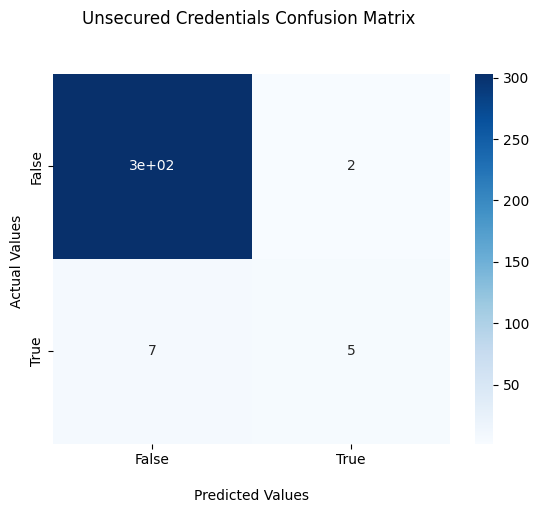

Brute Force


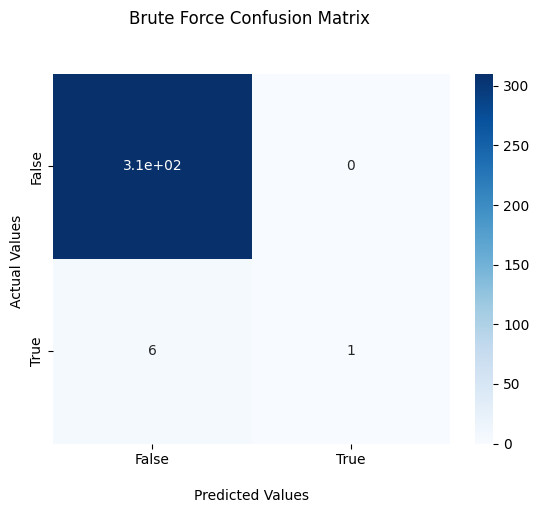

File and Directory Discovery


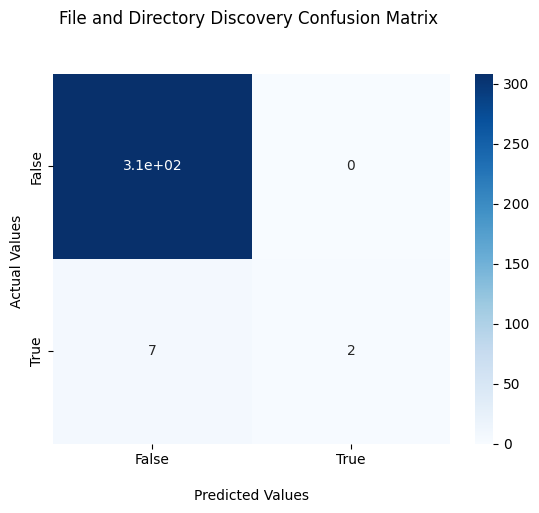

Valid Accounts


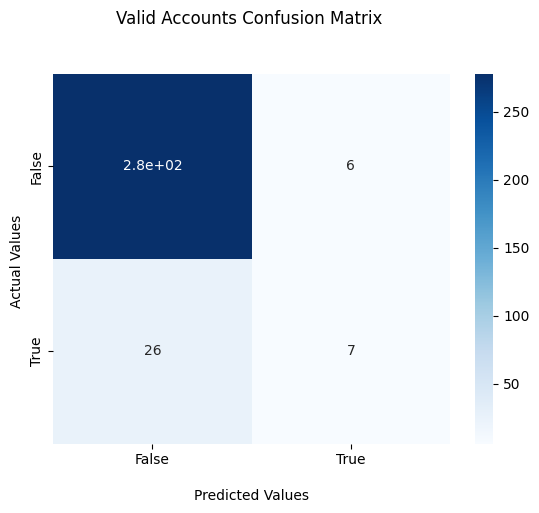

Exploitation for Defense Evasion


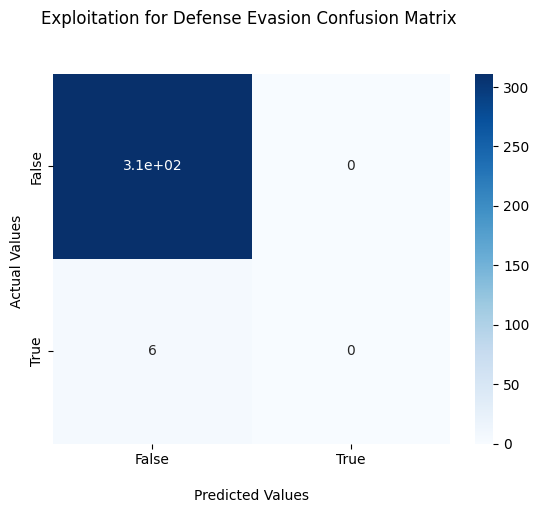

Create Account


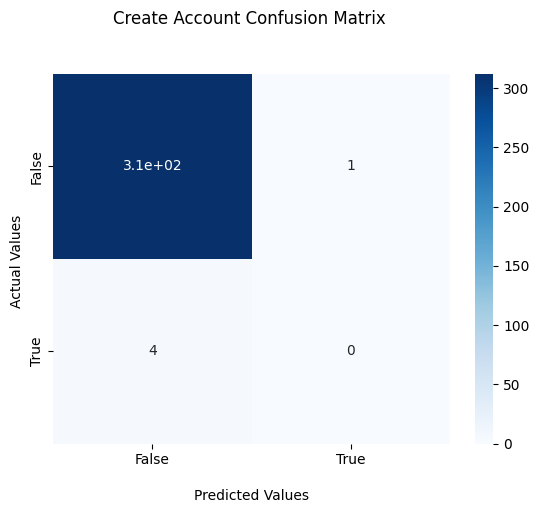

Endpoint Denial of Service


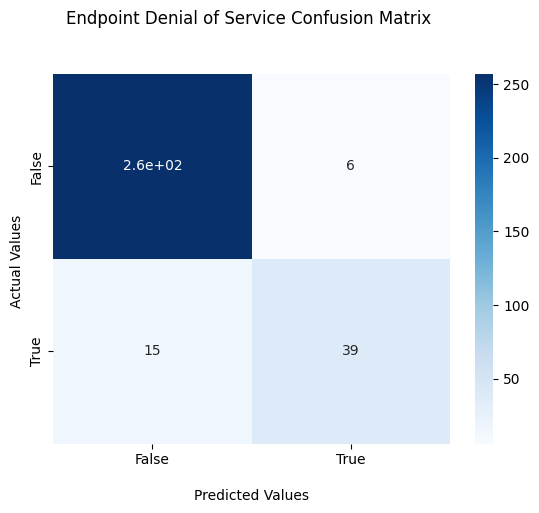

Drive-by Compromise


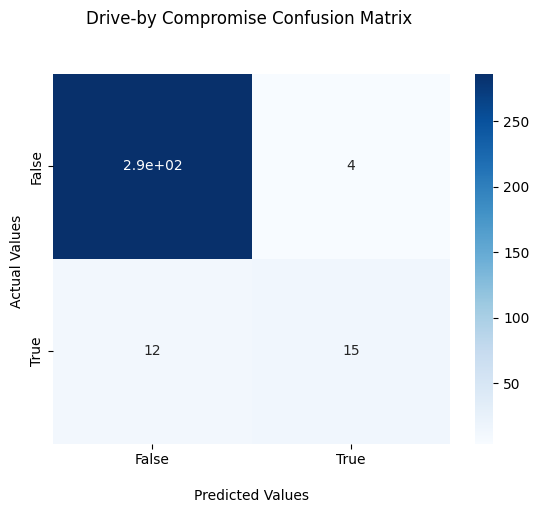

Exploitation for Client Execution


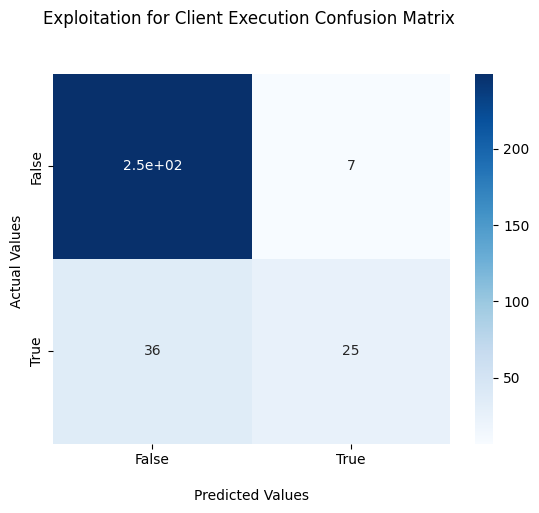

Exploitation of Remote Services


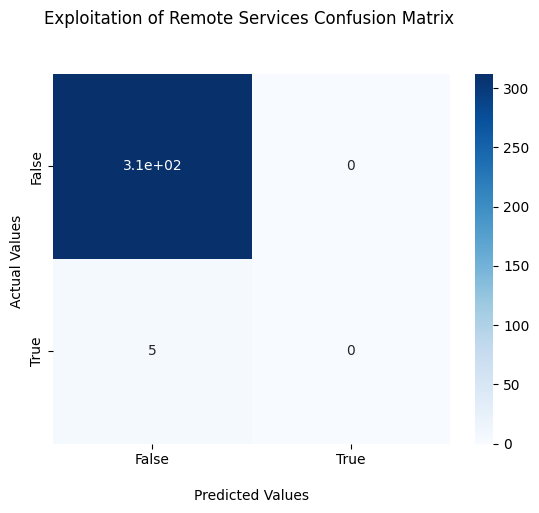

Stage Capabilities


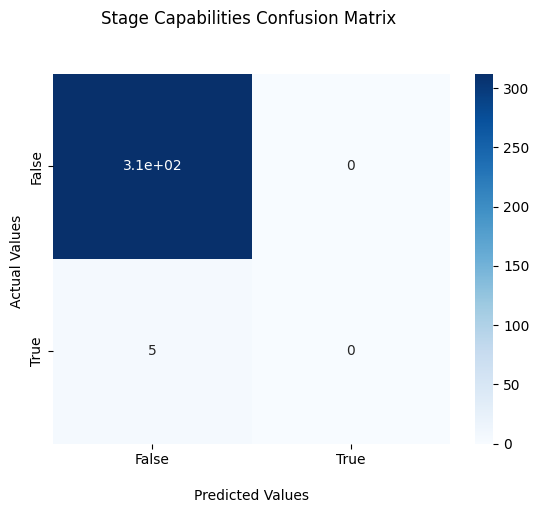

Exploit Public-Facing Application


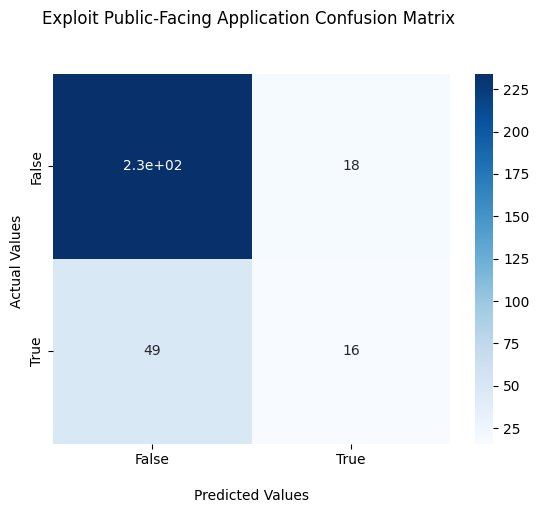

Forge Web Credentials


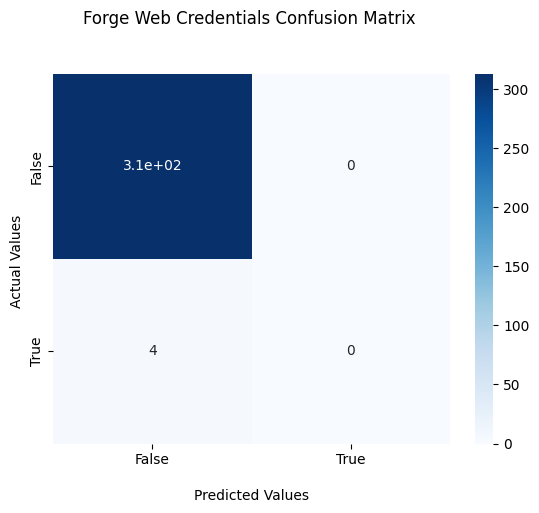

In [161]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

Multi-label SecBERT Extended

In [ ]:
# !pip install -q transformers
# # 

In [27]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer

In [28]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [29]:
(X_train_extended, y_train_extended) = load_data_from_file('/kaggle/input/input-files/final_extended_X_train.csv', '/kaggle/input/input-files/final_extended_y_train.csv')
(X_test, y_test) = load_data_from_file('/kaggle/input/input-files/X_test.csv', '/kaggle/input/input-files/y_test.csv')

from sklearn.model_selection import train_test_split
X_train, dummy_X_test, y_train, dummy_y_test = train_test_split(X_train_extended, y_train_extended, test_size=0.001, random_state=42)

In [30]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens


In [31]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]

In [32]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [33]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [34]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'jackaduma/SecBERT'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 512
    self.BATCH_SIZE = 16
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 100

config = Config()
     

config.json:   0%|          | 0.00/467 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

In [35]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        padding='max_length',
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [36]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([16, 512])
attention_mask shape: torch.Size([16, 512])
labels shape: torch.Size([16, 31])


In [37]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.3)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [38]:
device = config.DEVICE
device

device(type='cuda')

In [39]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)

In [40]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'extended_scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score


Train

In [41]:
model = Model()
model.to(device);

model.safetensors:   0%|          | 0.00/336M [00:00<?, ?B/s]

In [42]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22782710939645767
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 150
Eval Val loss: 0.22308445423841478
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 225
Eval Val loss: 0.21528854295611383
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20882764128984604
Eval Val loss: 0.21528854295611383
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/100: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.19735250174999236
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.006535947712418301
-- Step: 150
Eval Val loss: 0.18845489472150803
Eval Val accuracy: 0.022082018927444796
Eval Val micro f1 score: 0.0665610142630745
-- Step: 225
Eval Val loss: 0.1777289103716612
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.1897810218978102
Training loss: 0.13738761664228102
Eval Val loss: 0.1777289103716612
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.1897810218978102
Epoch 1/100: F1 Score 0.1897810218978102
--- Best Model. Val loss: 0.0 -> 0.1897810218978102


Epoch 2:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.17197876498103143
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.2661290322580645
-- Step: 150
Eval Val loss: 0.17133349888026714
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.24335664335664337
-- Step: 225
Eval Val loss: 0.16703508533537387
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.32051282051282054
Training loss: 0.08979093281766481
Eval Val loss: 0.16703508533537387
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.32051282051282054
Epoch 2/100: F1 Score 0.32051282051282054
--- Best Model. Val loss: 0.1897810218978102 -> 0.32051282051282054


Epoch 3:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.1667955968528986
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3320363164721141
-- Step: 225
Eval Val loss: 0.1648162666708231
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.41463414634146345
Training loss: 0.06237148787760365
Eval Val loss: 0.1648162666708231
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.41463414634146345
Epoch 3/100: F1 Score 0.41463414634146345
--- Best Model. Val loss: 0.32051282051282054 -> 0.41463414634146345


Epoch 4:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.16521596908569336
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.420353982300885
-- Step: 150
Eval Val loss: 0.17414816617965698
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.3504901960784314
-- Step: 225
Eval Val loss: 0.1734935764223337
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.43956043956043955
Training loss: 0.0462210168320257
Eval Val loss: 0.1734935764223337
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.43956043956043955
Epoch 4/100: F1 Score 0.43956043956043955
--- Best Model. Val loss: 0.41463414634146345 -> 0.43956043956043955


Epoch 5:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.17180511504411697
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4128745837957824
-- Step: 150
Eval Val loss: 0.17425344996154307
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.41048034934497823
-- Step: 225
Eval Val loss: 0.17058092318475246
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4474226804123711
Training loss: 0.03535622366563936
Eval Val loss: 0.17058092318475246
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4474226804123711
Epoch 5/100: F1 Score 0.4474226804123711
--- Best Model. Val loss: 0.43956043956043955 -> 0.4474226804123711


Epoch 6:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.17499752305448055
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.43829787234042555
-- Step: 150
Eval Val loss: 0.1789015345275402
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4322647362978283
-- Step: 225
Eval Val loss: 0.1772281438112259
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4351464435146443
Training loss: 0.027287408569415587
Eval Val loss: 0.1772281438112259
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4351464435146443
Epoch 6/100: F1 Score 0.4351464435146443


Epoch 7:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.18147151097655295
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.42436974789915966
-- Step: 150
Eval Val loss: 0.18192080967128277
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4439876670092497
-- Step: 225
Eval Val loss: 0.18662946820259094
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4167585446527012
Training loss: 0.021796655668094096
Eval Val loss: 0.18662946820259094
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4167585446527012
Epoch 7/100: F1 Score 0.4167585446527012


Epoch 8:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.18314863368868828
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4476386036960986
-- Step: 150
Eval Val loss: 0.18578718826174737
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4343329886246122
-- Step: 225
Eval Val loss: 0.1863038070499897
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44491978609625665
Training loss: 0.018259002165704044
Eval Val loss: 0.1863038070499897
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44491978609625665
Epoch 8/100: F1 Score 0.44491978609625665


Epoch 9:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.18470994867384433
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45972495088408644
-- Step: 150
Eval Val loss: 0.19447125755250455
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4157549234135668
-- Step: 225
Eval Val loss: 0.1906249776482582
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.44785276073619634
Training loss: 0.015028149726083585
Eval Val loss: 0.1906249776482582
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.44785276073619634
Epoch 9/100: F1 Score 0.44785276073619634
--- Best Model. Val loss: 0.4474226804123711 -> 0.44785276073619634


Epoch 10:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.19439128264784813
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.42521367521367526
-- Step: 150
Eval Val loss: 0.1942110177129507
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4353448275862069
-- Step: 225
Eval Val loss: 0.19241552725434302
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.447821681864235
Training loss: 0.01281512913549632
Eval Val loss: 0.19241552725434302
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.447821681864235
Epoch 10/100: F1 Score 0.447821681864235


Epoch 11:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.20035739243030548
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.42148760330578505
-- Step: 150
Eval Val loss: 0.1996657658368349
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4392819429778247
-- Step: 225
Eval Val loss: 0.2032300416380167
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.42094240837696334
Training loss: 0.010943272404488077
Eval Val loss: 0.2032300416380167
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.42094240837696334
Epoch 11/100: F1 Score 0.42094240837696334


Epoch 12:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.20480113960802554
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.435978835978836
-- Step: 150
Eval Val loss: 0.20571446195244789
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4472309299895507
-- Step: 225
Eval Val loss: 0.2066341795027256
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.432712215320911
Training loss: 0.009310118115375198
Eval Val loss: 0.2066341795027256
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.432712215320911
Epoch 12/100: F1 Score 0.432712215320911


Epoch 13:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.20902989357709884
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.430540827147402
-- Step: 150
Eval Val loss: 0.20627238377928733
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4374342797055731
-- Step: 225
Eval Val loss: 0.20672503784298896
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4455747711088504
Training loss: 0.00841454714969361
Eval Val loss: 0.20672503784298896
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4455747711088504
Epoch 13/100: F1 Score 0.4455747711088504


Epoch 14:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.20912206768989564
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.45398773006134974
-- Step: 150
Eval Val loss: 0.21102538332343102
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43533123028391163
-- Step: 225
Eval Val loss: 0.21415356025099755
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.42828282828282827
Training loss: 0.007548168993892923
Eval Val loss: 0.21415356025099755
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.42828282828282827
Epoch 14/100: F1 Score 0.42828282828282827


Epoch 15:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.21137891858816146
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44691607684529827
-- Step: 150
Eval Val loss: 0.21393266022205354
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4543610547667343
-- Step: 225
Eval Val loss: 0.21908995658159255
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.438871473354232
Training loss: 0.00665554223763468
Eval Val loss: 0.21908995658159255
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.438871473354232
Epoch 15/100: F1 Score 0.438871473354232


Epoch 16:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.216411417350173
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4573721163490472
-- Step: 150
Eval Val loss: 0.22078386060893535
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4476386036960986
-- Step: 225
Eval Val loss: 0.22393070235848428
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.437956204379562
Training loss: 0.00609696277240044
Eval Val loss: 0.22393070235848428
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.437956204379562
Epoch 16/100: F1 Score 0.437956204379562


Epoch 17:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.21569605693221092
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47563352826510724
-- Step: 150
Eval Val loss: 0.22151987999677658
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45128205128205134
-- Step: 225
Eval Val loss: 0.2248744361102581
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43264503441494595
Training loss: 0.005609212504015758
Eval Val loss: 0.2248744361102581
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43264503441494595
Epoch 17/100: F1 Score 0.43264503441494595


Epoch 18:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.21994215995073318
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.46564885496183206
-- Step: 150
Eval Val loss: 0.22349473722279073
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.45714285714285713
-- Step: 225
Eval Val loss: 0.22348189614713193
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4700098328416913
Training loss: 0.005014977668230711
Eval Val loss: 0.22348189614713193
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4700098328416913
Epoch 18/100: F1 Score 0.4700098328416913
--- Best Model. Val loss: 0.44785276073619634 -> 0.4700098328416913


Epoch 19:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2256074480712414
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.46918489065606367
-- Step: 150
Eval Val loss: 0.23046728149056434
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4557752341311134
-- Step: 225
Eval Val loss: 0.2313906379044056
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45352400408580185
Training loss: 0.004514098636686505
Eval Val loss: 0.2313906379044056
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45352400408580185
Epoch 19/100: F1 Score 0.45352400408580185


Epoch 20:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22677972838282584
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4626262626262626
-- Step: 150
Eval Val loss: 0.2327326402068138
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.45379876796714574
-- Step: 225
Eval Val loss: 0.23330990150570868
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.441025641025641
Training loss: 0.004143375379499048
Eval Val loss: 0.23330990150570868
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.441025641025641
Epoch 20/100: F1 Score 0.441025641025641


Epoch 21:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.23278943374752997
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45582329317269077
-- Step: 150
Eval Val loss: 0.22758410647511482
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46492985971943884
-- Step: 225
Eval Val loss: 0.2361922413110733
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.454728370221328
Training loss: 0.0037512379900379255
Eval Val loss: 0.2361922413110733
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.454728370221328
Epoch 21/100: F1 Score 0.454728370221328


Epoch 22:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2367015726864338
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46511627906976744
-- Step: 150
Eval Val loss: 0.24009942784905433
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.45314109165808447
-- Step: 225
Eval Val loss: 0.23907403498888016
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.46309403437815977
Training loss: 0.003357070126772685
Eval Val loss: 0.23907403498888016
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.46309403437815977
Epoch 22/100: F1 Score 0.46309403437815977


Epoch 23:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.23804598450660705
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.47731755424063116
-- Step: 150
Eval Val loss: 0.2402796432375908
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.46247464503042596
-- Step: 225
Eval Val loss: 0.24266446381807327
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4646061814556331
Training loss: 0.0031142834809905462
Eval Val loss: 0.24266446381807327
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4646061814556331
Epoch 23/100: F1 Score 0.4646061814556331


Epoch 24:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24253806918859483
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.46277665995975853
-- Step: 150
Eval Val loss: 0.24909497052431107
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.45100105374077976
-- Step: 225
Eval Val loss: 0.23842569589614868
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4518013631937682
Training loss: 0.002903484508592998
Eval Val loss: 0.23842569589614868
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4518013631937682
Epoch 24/100: F1 Score 0.4518013631937682


Epoch 25:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24336725994944572
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4657258064516129
-- Step: 150
Eval Val loss: 0.25002253577113154
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.446058091286307
-- Step: 225
Eval Val loss: 0.25000737980008125
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4549950544015826
Training loss: 0.0026887353500392517
Eval Val loss: 0.25000737980008125
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4549950544015826
Epoch 25/100: F1 Score 0.4549950544015826


Epoch 26:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.25142175480723383
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45592705167173253
-- Step: 150
Eval Val loss: 0.24934084191918374
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.46123260437375746
-- Step: 225
Eval Val loss: 0.25166492611169816
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4629258517034068
Training loss: 0.002508310774192873
Eval Val loss: 0.25166492611169816
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4629258517034068
Epoch 26/100: F1 Score 0.4629258517034068


Epoch 27:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.25383634865283966
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.46719681908548705
-- Step: 150
Eval Val loss: 0.2546015404164791
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4453280318091451
-- Step: 225
Eval Val loss: 0.2516196146607399
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46673095467695275
Training loss: 0.0023990667894363106
Eval Val loss: 0.2516196146607399
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46673095467695275
Epoch 27/100: F1 Score 0.46673095467695275


Epoch 28:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.25476641580462456
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47675568743818003
-- Step: 150
Eval Val loss: 0.2592328205704689
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4601593625498008
-- Step: 225
Eval Val loss: 0.261036042124033
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4551724137931035
Training loss: 0.00217912916559726
Eval Val loss: 0.261036042124033
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4551724137931035
Epoch 28/100: F1 Score 0.4551724137931035


Epoch 29:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2602725185453892
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.468
-- Step: 150
Eval Val loss: 0.26100812032818793
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44969199178644764
-- Step: 225
Eval Val loss: 0.25814698114991186
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.466796875
Training loss: 0.001973687301532044
Eval Val loss: 0.25814698114991186
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.466796875
Epoch 29/100: F1 Score 0.466796875


Epoch 30:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2608485214412212
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.46725317693059626
-- Step: 150
Eval Val loss: 0.26438735201954844
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.45731707317073167
-- Step: 225
Eval Val loss: 0.26130158379673957
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46977205153617446
Training loss: 0.0019482666342230761
Eval Val loss: 0.26130158379673957
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46977205153617446
Epoch 30/100: F1 Score 0.46977205153617446


Epoch 31:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.25972913652658464
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4770459081836328
-- Step: 150
Eval Val loss: 0.2657954663038254
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.464321608040201
-- Step: 225
Eval Val loss: 0.26649670749902726
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4743718592964824
Training loss: 0.0017952706485284096
Eval Val loss: 0.26649670749902726
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4743718592964824
Epoch 31/100: F1 Score 0.4743718592964824
--- Best Model. Val loss: 0.4700098328416913 -> 0.4743718592964824


Epoch 32:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2690119490027428
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4618473895582329
-- Step: 150
Eval Val loss: 0.26704672649502753
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4629080118694362
-- Step: 225
Eval Val loss: 0.26818531155586245
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4660194174757281
Training loss: 0.0016715663513045065
Eval Val loss: 0.26818531155586245
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4660194174757281
Epoch 32/100: F1 Score 0.4660194174757281


Epoch 33:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.26430317014455795
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48328557784145176
-- Step: 150
Eval Val loss: 0.26617317497730253
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4615384615384615
-- Step: 225
Eval Val loss: 0.2692348286509514
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4704743465634076
Training loss: 0.0015285268274756083
Eval Val loss: 0.2692348286509514
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4704743465634076
Epoch 33/100: F1 Score 0.4704743465634076


Epoch 34:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2695490926504135
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4814090019569472
-- Step: 150
Eval Val loss: 0.26925702318549155
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.48166501486620417
-- Step: 225
Eval Val loss: 0.26768903359770774
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4710351377018044
Training loss: 0.0015028136635798779
Eval Val loss: 0.26768903359770774
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4710351377018044
Epoch 34/100: F1 Score 0.4710351377018044


Epoch 35:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.26863504350185397
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47740667976424356
-- Step: 150
Eval Val loss: 0.2704583615064621
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4726224783861671
-- Step: 225
Eval Val loss: 0.27170625776052476
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47070124879923153
Training loss: 0.001463401052777334
Eval Val loss: 0.27170625776052476
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47070124879923153
Epoch 35/100: F1 Score 0.47070124879923153


Epoch 36:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.27296905741095545
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4758220502901354
-- Step: 150
Eval Val loss: 0.2749312683939934
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4518072289156627
-- Step: 225
Eval Val loss: 0.275245364010334
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.459214501510574
Training loss: 0.001319256034500452
Eval Val loss: 0.275245364010334
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.459214501510574
Epoch 36/100: F1 Score 0.459214501510574


Epoch 37:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.27766275480389596
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45914396887159536
-- Step: 150
Eval Val loss: 0.27699087262153627
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46953046953046956
-- Step: 225
Eval Val loss: 0.2781719990074635
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.466796875
Training loss: 0.001267105462266528
Eval Val loss: 0.2781719990074635
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.466796875
Epoch 37/100: F1 Score 0.466796875


Epoch 38:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.27987250238656997
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47093023255813954
-- Step: 150
Eval Val loss: 0.2819040328264236
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4522613065326634
-- Step: 225
Eval Val loss: 0.2757207930088043
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.484149855907781
Training loss: 0.0011806958593248876
Eval Val loss: 0.2757207930088043
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.484149855907781
Epoch 38/100: F1 Score 0.484149855907781
--- Best Model. Val loss: 0.4743718592964824 -> 0.484149855907781


Epoch 39:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2772283717989922
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47358121330724073
-- Step: 150
Eval Val loss: 0.2787132300436497
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47126436781609193
-- Step: 225
Eval Val loss: 0.28175373896956446
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.47953216374269003
Training loss: 0.0011490056986881386
Eval Val loss: 0.28175373896956446
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.47953216374269003
Epoch 39/100: F1 Score 0.47953216374269003


Epoch 40:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2882334224879742
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4619883040935673
-- Step: 150
Eval Val loss: 0.28599105700850486
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47116324535679377
-- Step: 225
Eval Val loss: 0.28767076283693316
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48
Training loss: 0.0010641427811485533
Eval Val loss: 0.28767076283693316
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48
Epoch 40/100: F1 Score 0.48


Epoch 41:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2829619660973549
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.46712463199214915
-- Step: 150
Eval Val loss: 0.28663877248764036
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.481086323957323
-- Step: 225
Eval Val loss: 0.2830964423716068
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47804878048780486
Training loss: 0.0009819650078610625
Eval Val loss: 0.2830964423716068
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47804878048780486
Epoch 41/100: F1 Score 0.47804878048780486


Epoch 42:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.28976036980748177
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4669338677354709
-- Step: 150
Eval Val loss: 0.2868033066391945
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48209099709583736
-- Step: 225
Eval Val loss: 0.2910055108368397
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4699140401146132
Training loss: 0.0009413020603798652
Eval Val loss: 0.2910055108368397
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4699140401146132
Epoch 42/100: F1 Score 0.4699140401146132


Epoch 43:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.29536922499537466
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4631992149165849
-- Step: 150
Eval Val loss: 0.2964354619383812
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.46414342629482075
-- Step: 225
Eval Val loss: 0.29495257288217547
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4612476370510397
Training loss: 0.0008382518738157948
Eval Val loss: 0.29495257288217547
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4612476370510397
Epoch 43/100: F1 Score 0.4612476370510397


Epoch 44:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.29089233875274656
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4710424710424711
-- Step: 150
Eval Val loss: 0.29575345739722253
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.46763285024154594
-- Step: 225
Eval Val loss: 0.29432775676250456
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4768339768339768
Training loss: 0.0008684681790038136
Eval Val loss: 0.29432775676250456
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4768339768339768
Epoch 44/100: F1 Score 0.4768339768339768


Epoch 45:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3084398902952671
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.46492985971943884
-- Step: 150
Eval Val loss: 0.3074617266654968
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45783132530120485
-- Step: 225
Eval Val loss: 0.29917150661349295
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4710351377018044
Training loss: 0.0009617340720471909
Eval Val loss: 0.29917150661349295
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4710351377018044
Epoch 45/100: F1 Score 0.4710351377018044


Epoch 46:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.30207386389374735
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4641833810888252
-- Step: 150
Eval Val loss: 0.29939437136054037
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46911196911196906
-- Step: 225
Eval Val loss: 0.2998872697353363
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4790652385589094
Training loss: 0.0009414810945889789
Eval Val loss: 0.2998872697353363
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4790652385589094
Epoch 46/100: F1 Score 0.4790652385589094


Epoch 47:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3005659058690071
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48884578079534435
-- Step: 150
Eval Val loss: 0.302312009036541
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4773820981713185
-- Step: 225
Eval Val loss: 0.3010828994214535
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4823091247672254
Training loss: 0.0008424270458455584
Eval Val loss: 0.3010828994214535
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4823091247672254
Epoch 47/100: F1 Score 0.4823091247672254


Epoch 48:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3027178831398487
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47792706333973123
-- Step: 150
Eval Val loss: 0.30344364792108536
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47792706333973123
-- Step: 225
Eval Val loss: 0.30624501705169677
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4681684622918707
Training loss: 0.0006782427713206961
Eval Val loss: 0.30624501705169677
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4681684622918707
Epoch 48/100: F1 Score 0.4681684622918707


Epoch 49:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3053779773414135
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.466796875
-- Step: 150
Eval Val loss: 0.30637113004922867
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.46899224806201556
-- Step: 225
Eval Val loss: 0.3053606338799
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.47127555988315484
Training loss: 0.0006162790027580974
Eval Val loss: 0.3053606338799
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.47127555988315484
Epoch 49/100: F1 Score 0.47127555988315484


Epoch 50:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3040109142661095
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4758220502901354
-- Step: 150
Eval Val loss: 0.3063465528190136
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4720616570327553
-- Step: 225
Eval Val loss: 0.3077514350414276
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47342995169082125
Training loss: 0.0005454571152196587
Eval Val loss: 0.3077514350414276
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47342995169082125
Epoch 50/100: F1 Score 0.47342995169082125


Epoch 51:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3084810808300972
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4831568816169393
-- Step: 150
Eval Val loss: 0.310414756834507
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4736842105263158
-- Step: 225
Eval Val loss: 0.30961850881576536
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47342995169082125
Training loss: 0.000502789583014926
Eval Val loss: 0.30961850881576536
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47342995169082125
Epoch 51/100: F1 Score 0.47342995169082125


Epoch 52:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.308907613158226
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47082096933728984
-- Step: 75
Eval Val loss: 0.3104817867279053
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4822286263208453
-- Step: 150
Eval Val loss: 0.3155538223683834
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47684729064039405
-- Step: 225
Eval Val loss: 0.31213716641068456
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47388781431334626
Training loss: 0.0004788524748353634
Eval Val loss: 0.31213716641068456
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47388781431334626
Epoch 53/100: F1 Score 0.47388781431334626


Epoch 54:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3137645050883293
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4807692307692308
-- Step: 150
Eval Val loss: 0.31429637372493746
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.474609375
-- Step: 225
Eval Val loss: 0.31652489528059957
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4673807205452775
Training loss: 0.0004419805080242521
Eval Val loss: 0.31652489528059957
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4673807205452775
Epoch 54/100: F1 Score 0.4673807205452775


Epoch 55:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.31833404675126076
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4673807205452775
-- Step: 150
Eval Val loss: 0.3181884281337261
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47434656340755077
-- Step: 225
Eval Val loss: 0.31824134215712546
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.48
Training loss: 0.0004374610806276519
Eval Val loss: 0.31824134215712546
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.48
Epoch 55/100: F1 Score 0.48


Epoch 56:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.31725186854600906
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4765625
-- Step: 150
Eval Val loss: 0.32121881023049353
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.46942800788954636
-- Step: 225
Eval Val loss: 0.32023185938596727
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4762826718296224
Training loss: 0.0004166859332860996
Eval Val loss: 0.32023185938596727
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4762826718296224
Epoch 56/100: F1 Score 0.4762826718296224


Epoch 57:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3205904349684715
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47938638542665385
-- Step: 150
Eval Val loss: 0.3191476985812187
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4648023143683703
-- Step: 225
Eval Val loss: 0.32291028201580046
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46641074856046066
Training loss: 0.00042726916928860086
Eval Val loss: 0.32291028201580046
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46641074856046066
Epoch 57/100: F1 Score 0.46641074856046066


Epoch 58:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3228758804500103
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4763705103969755
-- Step: 150
Eval Val loss: 0.3232778966426849
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4746716697936211
-- Step: 225
Eval Val loss: 0.3245539590716362
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4720616570327553
Training loss: 0.0004353991264270812
Eval Val loss: 0.3245539590716362
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4720616570327553
Epoch 58/100: F1 Score 0.4720616570327553


Epoch 59:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3191644802689552
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4805447470817121
-- Step: 150
Eval Val loss: 0.32752006202936174
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4663414634146341
-- Step: 225
Eval Val loss: 0.32458059266209605
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47804878048780486
Training loss: 0.000400880081486369
Eval Val loss: 0.32458059266209605
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47804878048780486
Epoch 59/100: F1 Score 0.47804878048780486


Epoch 60:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.32595375925302505
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4703595724003887
-- Step: 150
Eval Val loss: 0.324468357115984
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47702834799608995
-- Step: 225
Eval Val loss: 0.32466866374015807
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48571428571428577
Training loss: 0.0003810186414972702
Eval Val loss: 0.32466866374015807
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48571428571428577
Epoch 60/100: F1 Score 0.48571428571428577
--- Best Model. Val loss: 0.484149855907781 -> 0.48571428571428577


Epoch 61:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.32632680609822273
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4816955684007707
-- Step: 150
Eval Val loss: 0.326811882853508
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47699530516431926
-- Step: 225
Eval Val loss: 0.3261945016682148
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48038277511961724
Training loss: 0.00037821938090059346
Eval Val loss: 0.3261945016682148
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48038277511961724
Epoch 61/100: F1 Score 0.48038277511961724


Epoch 62:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.32601589262485503
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4774688398849472
-- Step: 150
Eval Val loss: 0.32139062210917474
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4740882917466411
-- Step: 225
Eval Val loss: 0.32877504602074625
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48698884758364314
Training loss: 0.00036622829490858417
Eval Val loss: 0.32877504602074625
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48698884758364314
Epoch 62/100: F1 Score 0.48698884758364314
--- Best Model. Val loss: 0.48571428571428577 -> 0.48698884758364314


Epoch 63:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3271500051021576
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4789272030651341
-- Step: 150
Eval Val loss: 0.330791512876749
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48269230769230764
-- Step: 225
Eval Val loss: 0.33004292473196983
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4674329501915709
Training loss: 0.00035164070385714283
Eval Val loss: 0.33004292473196983
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4674329501915709
Epoch 63/100: F1 Score 0.4674329501915709


Epoch 64:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3329122349619865
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4769230769230769
-- Step: 150
Eval Val loss: 0.33350368961691856
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48023143683702985
-- Step: 225
Eval Val loss: 0.3323604494333267
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47195357833655704
Training loss: 0.00031768451176946404
Eval Val loss: 0.3323604494333267
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47195357833655704
Epoch 64/100: F1 Score 0.47195357833655704


Epoch 65:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.33014118745923043
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4788461538461538
-- Step: 150
Eval Val loss: 0.33078740909695625
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4745437079731028
-- Step: 225
Eval Val loss: 0.3340738594532013
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4667291471415182
Training loss: 0.0003861033243582526
Eval Val loss: 0.3340738594532013
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4667291471415182
Epoch 65/100: F1 Score 0.4667291471415182


Epoch 66:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3304419480264187
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4686595949855352
-- Step: 150
Eval Val loss: 0.33229809552431105
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4695652173913044
-- Step: 225
Eval Val loss: 0.32829112410545347
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4804469273743017
Training loss: 0.000477955337059818
Eval Val loss: 0.32829112410545347
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4804469273743017
Epoch 66/100: F1 Score 0.4804469273743017


Epoch 67:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.33062909096479415
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4746716697936211
-- Step: 150
Eval Val loss: 0.3344821214675903
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.46458923512747874
-- Step: 225
Eval Val loss: 0.3366483300924301
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4597701149425288
Training loss: 0.0003227898802423326
Eval Val loss: 0.3366483300924301
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4597701149425288
Epoch 67/100: F1 Score 0.4597701149425288


Epoch 68:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.33472885116934775
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46925260170293287
-- Step: 150
Eval Val loss: 0.33464511707425115
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.47171620325982744
-- Step: 225
Eval Val loss: 0.334239836782217
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47555129434324067
Training loss: 0.0002803532441618772
Eval Val loss: 0.334239836782217
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47555129434324067
Epoch 68/100: F1 Score 0.47555129434324067


Epoch 69:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3337169013917446
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4757373929590866
-- Step: 150
Eval Val loss: 0.33536782786250113
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4749034749034749
-- Step: 225
Eval Val loss: 0.33675881028175353
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4701421800947867
Training loss: 0.00024698756343378086
Eval Val loss: 0.33675881028175353
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4701421800947867
Epoch 69/100: F1 Score 0.4701421800947867


Epoch 70:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3346054397523403
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.46622264509990485
-- Step: 150
Eval Val loss: 0.33608109652996065
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4733840304182509
-- Step: 225
Eval Val loss: 0.33734522983431814
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4761904761904762
Training loss: 0.00024187449422902923
Eval Val loss: 0.33734522983431814
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4761904761904762
Epoch 70/100: F1 Score 0.4761904761904762


Epoch 71:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3388318866491318
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.46969696969696967
-- Step: 150
Eval Val loss: 0.34044343382120135
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4648023143683703
-- Step: 225
Eval Val loss: 0.33889117166399957
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.475095785440613
Training loss: 0.00022731861936657862
Eval Val loss: 0.33889117166399957
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.475095785440613
Epoch 71/100: F1 Score 0.475095785440613


Epoch 72:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.33860755935311315
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.475095785440613
-- Step: 150
Eval Val loss: 0.34033045172691345
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4832214765100672
-- Step: 225
Eval Val loss: 0.3402522072196007
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.478386167146974
Training loss: 0.00022305709079878437
Eval Val loss: 0.3402522072196007
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.478386167146974
Epoch 72/100: F1 Score 0.478386167146974


Epoch 73:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3399774104356766
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47690857681432614
-- Step: 150
Eval Val loss: 0.34200248420238494
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4722753346080306
-- Step: 225
Eval Val loss: 0.3433981530368328
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4687800192122959
Training loss: 0.00021639639281256196
Eval Val loss: 0.3433981530368328
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4687800192122959
Epoch 73/100: F1 Score 0.4687800192122959


Epoch 74:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3430910088121891
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4704743465634076
-- Step: 150
Eval Val loss: 0.34392968863248824
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4742857142857142
-- Step: 225
Eval Val loss: 0.34604308381676674
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4754571703561117
Training loss: 0.00021560333200884403
Eval Val loss: 0.34604308381676674
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4754571703561117
Epoch 74/100: F1 Score 0.4754571703561117


Epoch 75:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3455917060375214
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47328244274809156
-- Step: 150
Eval Val loss: 0.3458033338189125
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4678030303030304
-- Step: 225
Eval Val loss: 0.3467923037707806
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4718446601941747
Training loss: 0.00021482743876272776
Eval Val loss: 0.3467923037707806
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4718446601941747
Epoch 75/100: F1 Score 0.4718446601941747


Epoch 76:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.34535105526447296
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.46934865900383144
-- Step: 150
Eval Val loss: 0.3456032112240791
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48098859315589354
-- Step: 225
Eval Val loss: 0.34557271748781204
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47900763358778625
Training loss: 0.00020489461466425873
Eval Val loss: 0.34557271748781204
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47900763358778625
Epoch 76/100: F1 Score 0.47900763358778625


Epoch 77:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.34479666203260423
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4780952380952381
-- Step: 150
Eval Val loss: 0.34679916575551034
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4772946859903382
-- Step: 225
Eval Val loss: 0.3474339500069618
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47424684159378033
Training loss: 0.00019803134464945716
Eval Val loss: 0.3474339500069618
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47424684159378033
Epoch 77/100: F1 Score 0.47424684159378033


Epoch 78:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3462616726756096
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47664442326024786
-- Step: 150
Eval Val loss: 0.34724477156996725
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4770114942528736
-- Step: 225
Eval Val loss: 0.3475263498723507
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47938638542665385
Training loss: 0.00019396311063649117
Eval Val loss: 0.3475263498723507
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47938638542665385
Epoch 78/100: F1 Score 0.47938638542665385


Epoch 79:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.34781381115317345
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47755491881566386
-- Step: 150
Eval Val loss: 0.34903510883450506
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4740882917466411
-- Step: 225
Eval Val loss: 0.3493775948882103
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4782608695652174
Training loss: 0.00018371207589609135
Eval Val loss: 0.3493775948882103
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4782608695652174
Epoch 79/100: F1 Score 0.4782608695652174


Epoch 80:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3483746908605099
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47690857681432614
-- Step: 150
Eval Val loss: 0.3485772289335728
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4774688398849472
-- Step: 225
Eval Val loss: 0.3500774875283241
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.469447138700291
Training loss: 0.0001832201604586377
Eval Val loss: 0.3500774875283241
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.469447138700291
Epoch 80/100: F1 Score 0.469447138700291


Epoch 81:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.34872227236628534
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47908745247148293
-- Step: 150
Eval Val loss: 0.351487160474062
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4738344433872502
-- Step: 225
Eval Val loss: 0.350869157910347
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4758293838862559
Training loss: 0.0001800063257613034
Eval Val loss: 0.350869157910347
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4758293838862559
Epoch 81/100: F1 Score 0.4758293838862559


Epoch 82:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.35053764581680297
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48000000000000004
-- Step: 150
Eval Val loss: 0.3516484260559082
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.48038277511961724
-- Step: 225
Eval Val loss: 0.3504320949316025
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4721435316336166
Training loss: 0.00017511254247389754
Eval Val loss: 0.3504320949316025
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4721435316336166
Epoch 82/100: F1 Score 0.4721435316336166


Epoch 83:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.350059412419796
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47863247863247865
-- Step: 150
Eval Val loss: 0.35181441009044645
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47674418604651164
-- Step: 225
Eval Val loss: 0.35166585370898246
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4773820981713185
Training loss: 0.000172356843808125
Eval Val loss: 0.35166585370898246
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4773820981713185
Epoch 83/100: F1 Score 0.4773820981713185


Epoch 84:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.35256907865405085
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4757373929590866
-- Step: 150
Eval Val loss: 0.3530600510537624
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4759152215799615
-- Step: 225
Eval Val loss: 0.35375416949391364
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4760076775431862
Training loss: 0.00016721114492756253
Eval Val loss: 0.35375416949391364
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4760076775431862
Epoch 84/100: F1 Score 0.4760076775431862


Epoch 85:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3531648010015488
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.47328244274809156
-- Step: 150
Eval Val loss: 0.3546394869685173
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47961165048543697
-- Step: 225
Eval Val loss: 0.3552224047482014
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47766990291262135
Training loss: 0.0001601937588946111
Eval Val loss: 0.3552224047482014
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47766990291262135
Epoch 85/100: F1 Score 0.47766990291262135


Epoch 86:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3533031024038792
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4699140401146132
-- Step: 150
Eval Val loss: 0.35472735539078715
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47718631178707227
-- Step: 225
Eval Val loss: 0.355158393830061
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47398843930635837
Training loss: 0.0001647646283578649
Eval Val loss: 0.355158393830061
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47398843930635837
Epoch 86/100: F1 Score 0.47398843930635837


Epoch 87:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3556005276739597
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4794776119402985
-- Step: 150
Eval Val loss: 0.35672701671719553
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4752851711026616
-- Step: 225
Eval Val loss: 0.3570035547018051
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4770114942528736
Training loss: 0.00016295961602060414
Eval Val loss: 0.3570035547018051
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4770114942528736
Epoch 87/100: F1 Score 0.4770114942528736


Epoch 88:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.35671093836426737
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47609942638623326
-- Step: 150
Eval Val loss: 0.35679727494716645
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4756446991404011
-- Step: 225
Eval Val loss: 0.3581909671425819
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47863247863247865
Training loss: 0.00015289418394054055
Eval Val loss: 0.3581909671425819
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47863247863247865
Epoch 88/100: F1 Score 0.47863247863247865


Epoch 89:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.35807490944862364
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48053181386514715
-- Step: 150
Eval Val loss: 0.35851031467318534
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.475
-- Step: 225
Eval Val loss: 0.3580223545432091
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48374760994263866
Training loss: 0.0001496529540474464
Eval Val loss: 0.3580223545432091
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48374760994263866
Epoch 89/100: F1 Score 0.48374760994263866


Epoch 90:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3587594531476498
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48328557784145176
-- Step: 150
Eval Val loss: 0.3587174370884895
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4827586206896552
-- Step: 225
Eval Val loss: 0.3589022271335125
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4788461538461538
Training loss: 0.00014452906279743287
Eval Val loss: 0.3589022271335125
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4788461538461538
Epoch 90/100: F1 Score 0.4788461538461538


Epoch 91:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3587940573692322
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47938638542665385
-- Step: 150
Eval Val loss: 0.3586663633584976
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47718631178707227
-- Step: 225
Eval Val loss: 0.3577027149498463
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4819047619047619
Training loss: 0.00014716813839025242
Eval Val loss: 0.3577027149498463
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4819047619047619
Epoch 91/100: F1 Score 0.4819047619047619


Epoch 92:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.35906741097569467
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47609942638623326
-- Step: 150
Eval Val loss: 0.35905241668224336
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47855100095328884
-- Step: 225
Eval Val loss: 0.35924534127116203
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47664442326024786
Training loss: 0.00014331615392644878
Eval Val loss: 0.35924534127116203
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47664442326024786
Epoch 92/100: F1 Score 0.47664442326024786


Epoch 93:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3598320081830025
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47930702598652547
-- Step: 150
Eval Val loss: 0.35913520827889445
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4813039309683605
-- Step: 225
Eval Val loss: 0.358760029822588
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47992351816443596
Training loss: 0.00014172487785839847
Eval Val loss: 0.358760029822588
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47992351816443596
Epoch 93/100: F1 Score 0.47992351816443596


Epoch 94:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3594367317855358
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4759152215799615
-- Step: 150
Eval Val loss: 0.35990513041615485
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47646493756003844
-- Step: 225
Eval Val loss: 0.3604316145181656
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4758220502901354
Training loss: 0.00014263012061610023
Eval Val loss: 0.3604316145181656
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4758220502901354
Epoch 94/100: F1 Score 0.4758220502901354


Epoch 95:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3604119554162025
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4759152215799615
-- Step: 150
Eval Val loss: 0.36038699820637704
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4759152215799615
-- Step: 225
Eval Val loss: 0.36024522557854655
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47398843930635837
Training loss: 0.00013714201916233262
Eval Val loss: 0.36024522557854655
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47398843930635837
Epoch 95/100: F1 Score 0.47398843930635837


Epoch 96:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3608293242752552
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4762826718296224
-- Step: 150
Eval Val loss: 0.3609028622508049
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4762826718296224
-- Step: 225
Eval Val loss: 0.36072167456150056
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4786821705426356
Training loss: 0.00013414274554127112
Eval Val loss: 0.36072167456150056
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4786821705426356
Epoch 96/100: F1 Score 0.4786821705426356


Epoch 97:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.3605024479329586
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.47536231884057967
-- Step: 150
Eval Val loss: 0.3608661122620106
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47444551591128253
-- Step: 225
Eval Val loss: 0.360955522954464
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4759152215799615
Training loss: 0.00013469297528392852
Eval Val loss: 0.360955522954464
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4759152215799615
Epoch 97/100: F1 Score 0.4759152215799615


Epoch 98:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.36073493883013724
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4754571703561117
-- Step: 150
Eval Val loss: 0.36062406525015833
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47792706333973123
-- Step: 225
Eval Val loss: 0.3605764530599117
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.478386167146974
Training loss: 0.0001322758738655289
Eval Val loss: 0.3605764530599117
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.478386167146974
Epoch 98/100: F1 Score 0.478386167146974


Epoch 99:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.36064471006393434
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.478386167146974
-- Step: 150
Eval Val loss: 0.36067920327186587
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47792706333973123
-- Step: 225
Eval Val loss: 0.3606882758438587
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.478386167146974
Training loss: 0.00013287241343648093
Eval Val loss: 0.3606882758438587
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.478386167146974
Epoch 99/100: F1 Score 0.478386167146974


Test

In [43]:
test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)


In [44]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [45]:

test_pred = predict(best_model)

In [46]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0.],
      dtype=float32)

In [47]:
print(accuracy_score(y_test.values, test_pred))

0.15772870662460567


In [48]:
pd.set_option('display.max_columns', None)
print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 20)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Drive-by Compromise,Command and Scripting Interpreter,Unsecured Credentials,File and Directory Discovery,Exploitation for Client Execution,User Execution,Data from Local System,Browser Session Hijacking,Phishing,Network Sniffing,Access Token Manipulation,Exploit Public-Facing Application,Valid Accounts,Hijack Execution Flow,Archive Collected Data,Data Manipulation,Server Software Component
0,0.815534,0.645669,0.615385,0.583333,0.576,0.545455,0.533333,0.514851,0.492308,0.478261,0.434783,0.428571,0.4,0.4,0.383333,0.354839,0.35,0.333333,0.32,0.25


In [49]:
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 25)

,Endpoint Denial of Service,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Drive-by Compromise,Command and Scripting Interpreter,Unsecured Credentials,File and Directory Discovery,Exploitation for Client Execution,User Execution,Data from Local System,Browser Session Hijacking,Phishing,Network Sniffing,Access Token Manipulation,Exploit Public-Facing Application,Valid Accounts,Hijack Execution Flow,Archive Collected Data,Data Manipulation,Server Software Component,Brute Force,Process Injection,External Remote Services,Exploitation for Credential Access,Data Destruction
0,0.815534,0.645669,0.615385,0.583333,0.576,0.545455,0.533333,0.514851,0.492308,0.478261,0.434783,0.428571,0.4,0.4,0.383333,0.354839,0.35,0.333333,0.32,0.25,0.222222,0.0,0.0,0.0,0.0


In [50]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 20)

Recall Score


,Exploitation for Privilege Escalation,Endpoint Denial of Service,Command and Scripting Interpreter,User Execution,Drive-by Compromise,Adversary-in-the-Middle,Unsecured Credentials,Browser Session Hijacking,File and Directory Discovery,Exploitation for Client Execution,Data from Local System,Exploit Public-Facing Application,Valid Accounts,Phishing,Hijack Execution Flow,Access Token Manipulation,Network Sniffing,Data Manipulation,Archive Collected Data,Server Software Component
0,0.82,0.777778,0.590164,0.533333,0.518519,0.5,0.5,0.454545,0.444444,0.42623,0.37931,0.353846,0.333333,0.272727,0.259259,0.25,0.25,0.235294,0.2,0.166667


In [51]:

print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 20)

Precision Score


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Access Token Manipulation,Network Sniffing,Phishing,Archive Collected Data,Endpoint Denial of Service,Adversary-in-the-Middle,Drive-by Compromise,File and Directory Discovery,Exploitation for Client Execution,Data from Local System,Unsecured Credentials,Command and Scripting Interpreter,Hijack Execution Flow,Exploitation for Privilege Escalation,Server Software Component,Brute Force,Data Manipulation,User Execution,Exploit Public-Facing Application,Browser Session Hijacking
0,1.0,1.0,1.0,1.0,0.857143,0.8,0.666667,0.666667,0.65,0.647059,0.6,0.5625,0.538462,0.532468,0.5,0.5,0.5,0.457143,0.418182,0.416667


In [52]:

print(f1_score(y_test.values, test_pred, average='weighted'))

0.4547214839489458


In [53]:
print(recall_score(y_test.values, test_pred, average='weighted'))
     

0.42950819672131146


In [54]:

print(precision_score(y_test.values, test_pred, average='weighted'))

0.5265105523584475


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


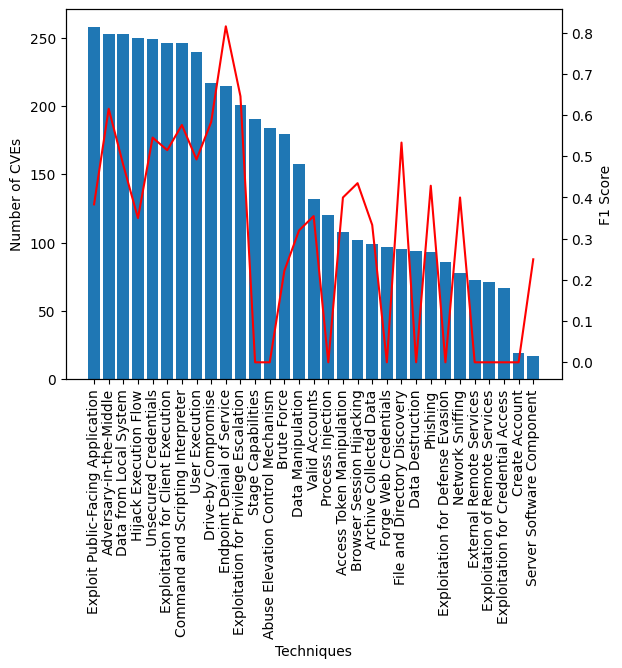

In [55]:

print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


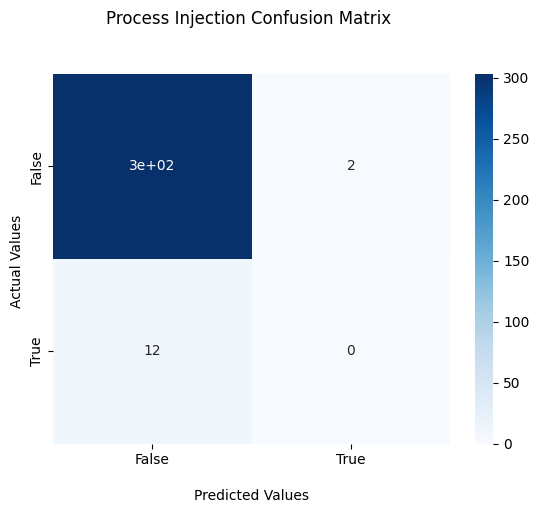

Access Token Manipulation


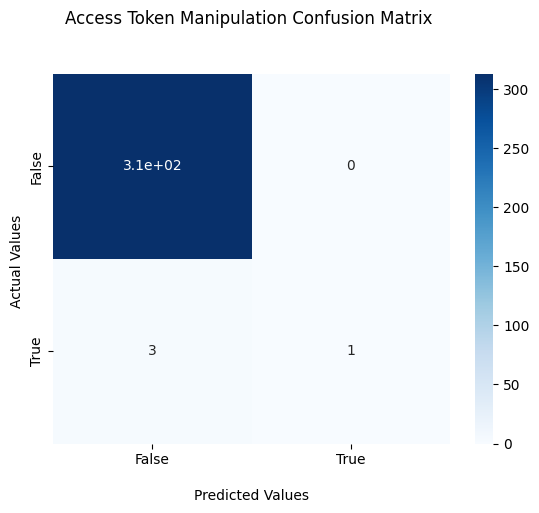

Hijack Execution Flow


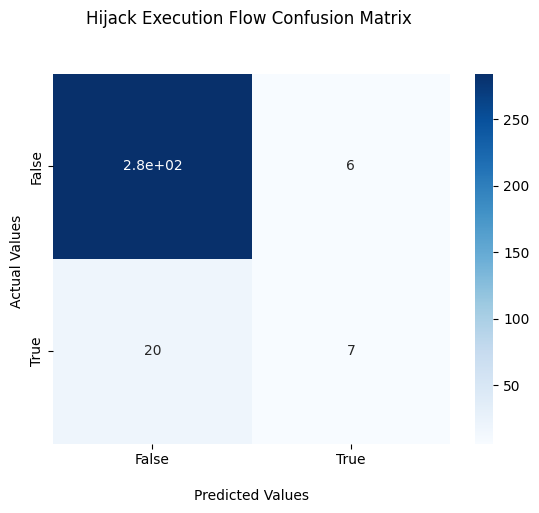

Data from Local System


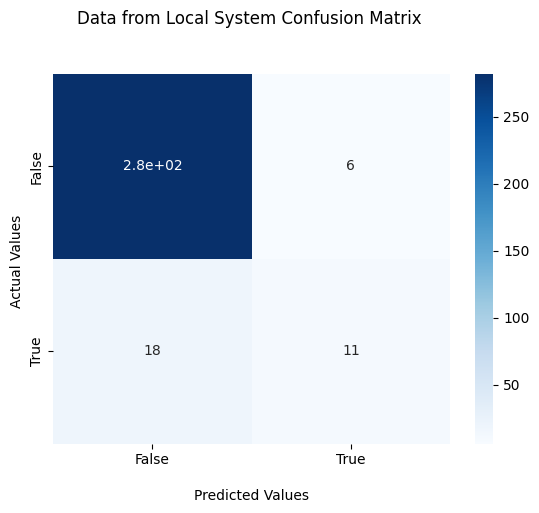

External Remote Services


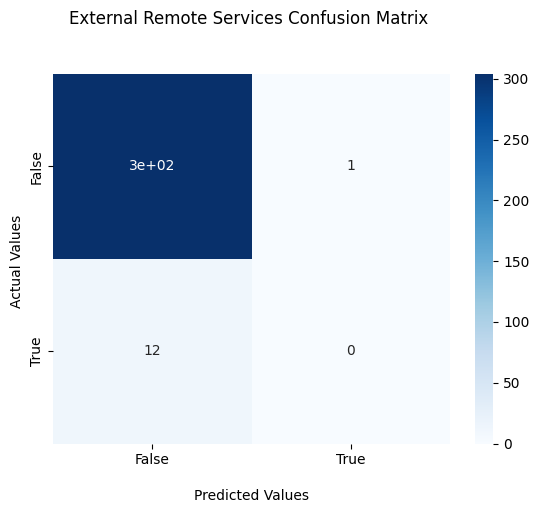

Data Manipulation


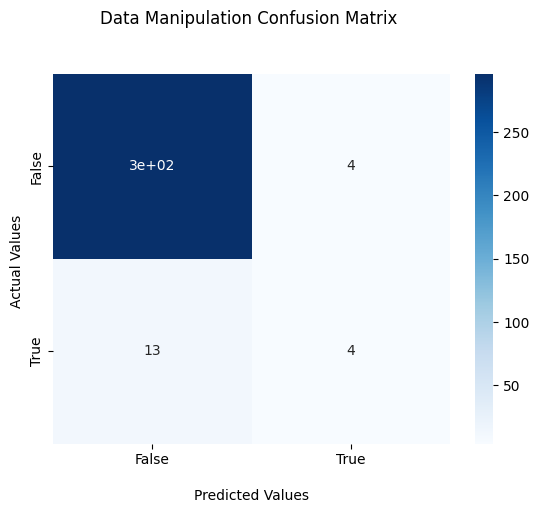

Network Sniffing


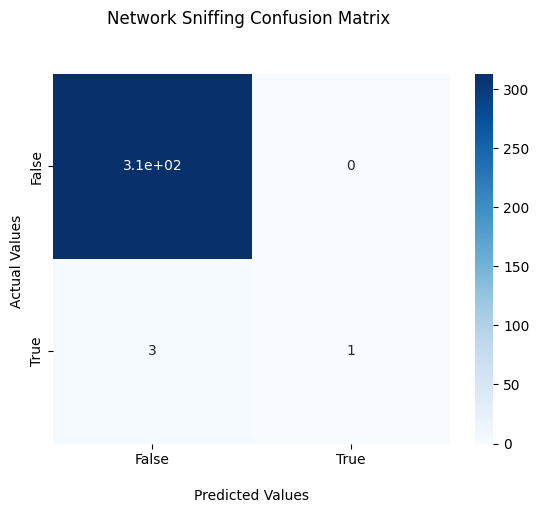

Exploitation for Privilege Escalation


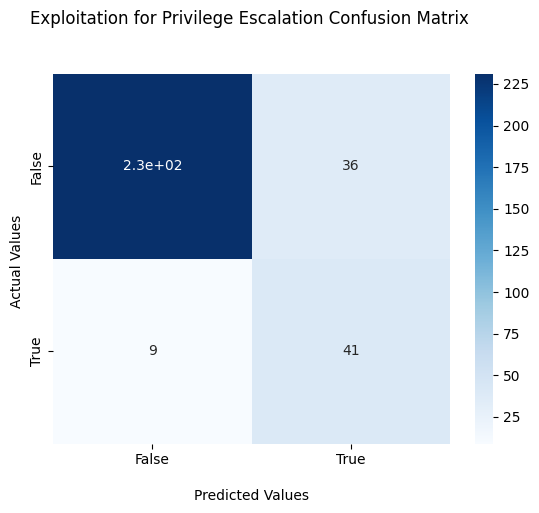

Command and Scripting Interpreter


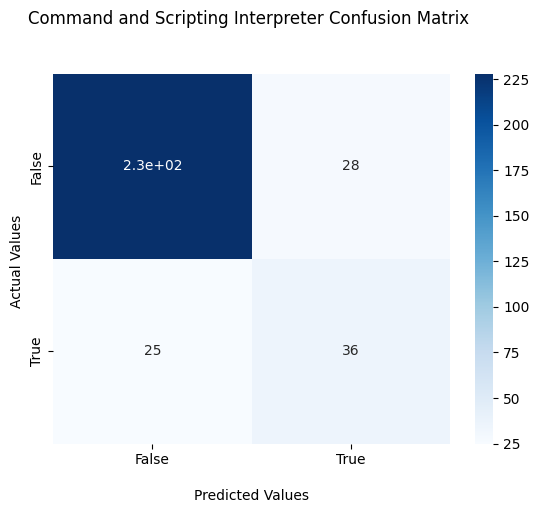

Phishing


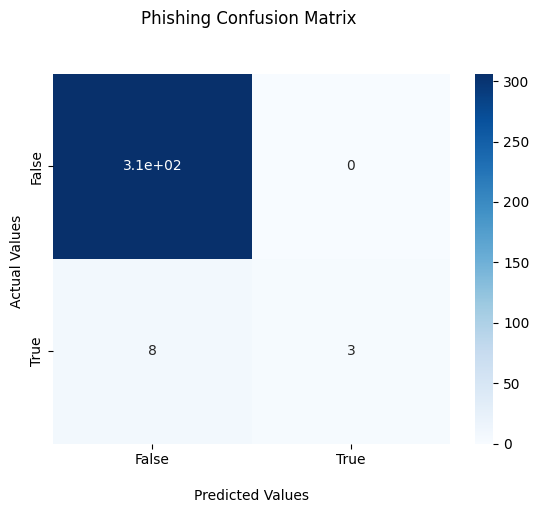

Server Software Component


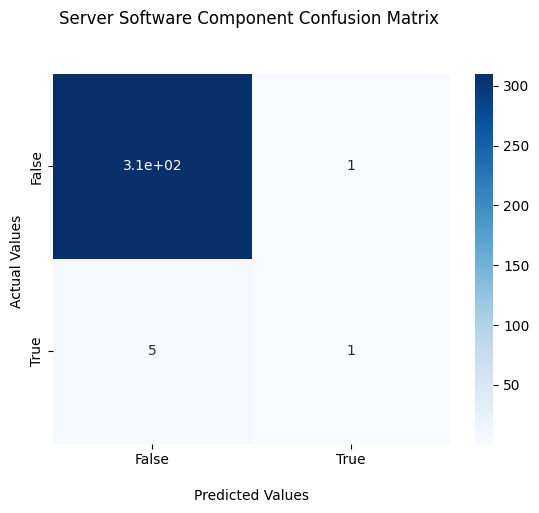

Archive Collected Data


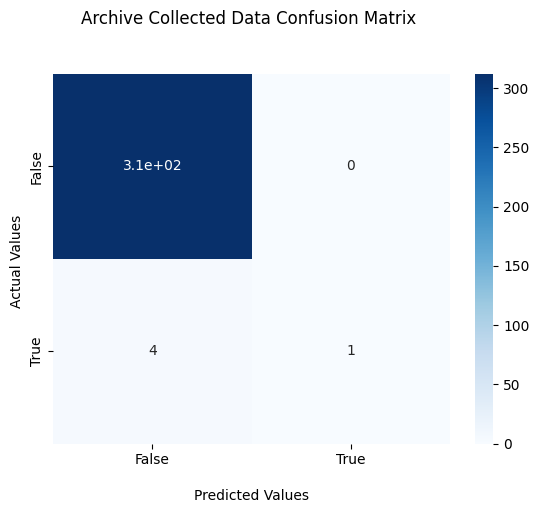

Data Destruction


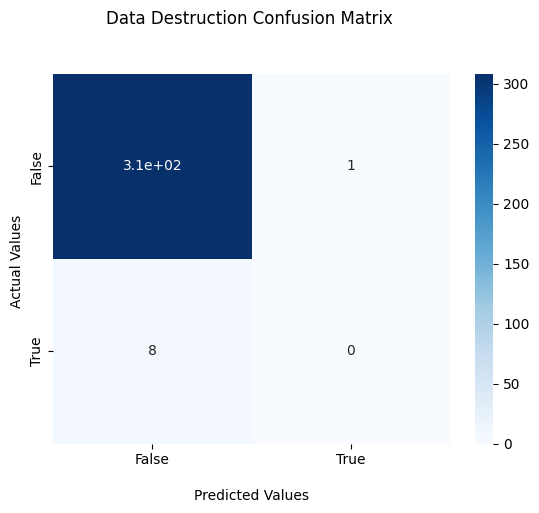

Browser Session Hijacking


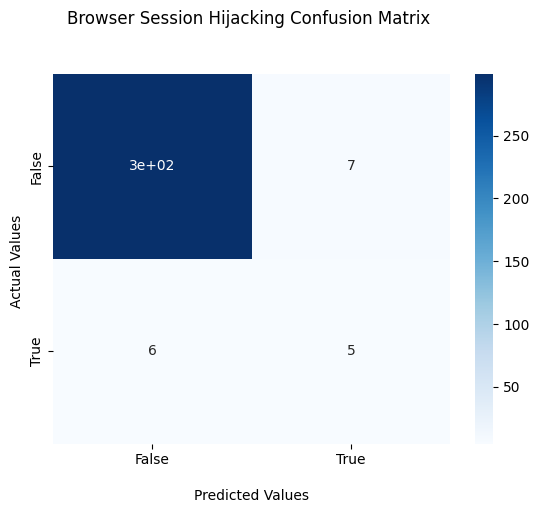

Exploitation for Credential Access


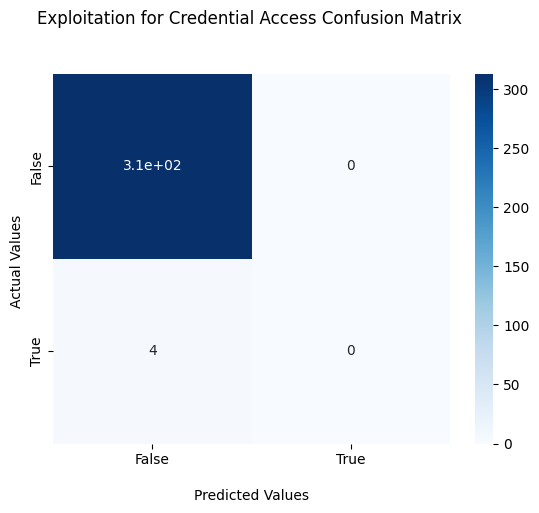

Abuse Elevation Control Mechanism


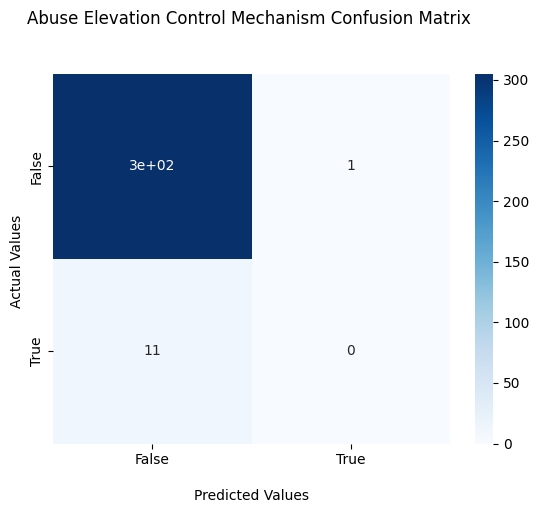

Adversary-in-the-Middle


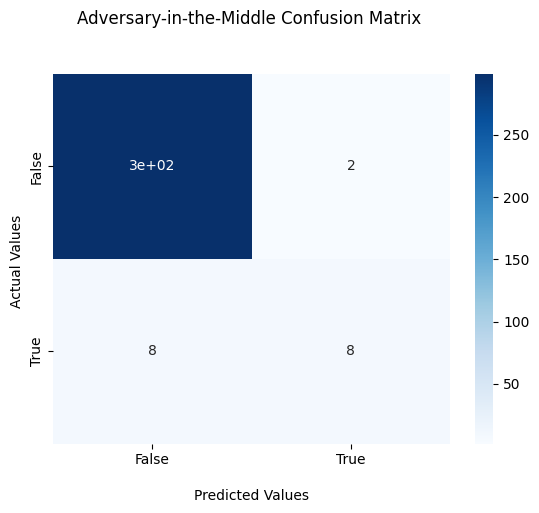

User Execution


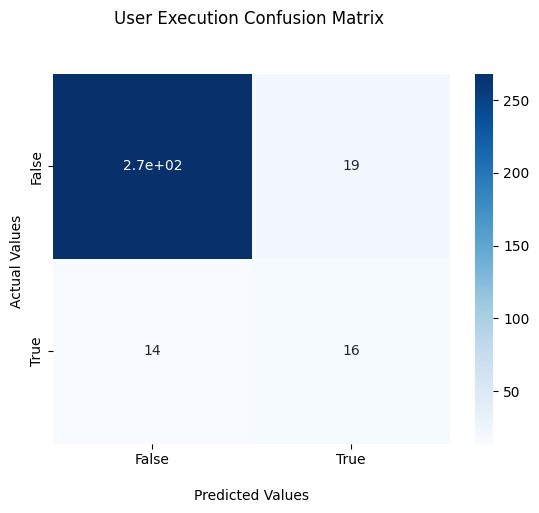

Unsecured Credentials


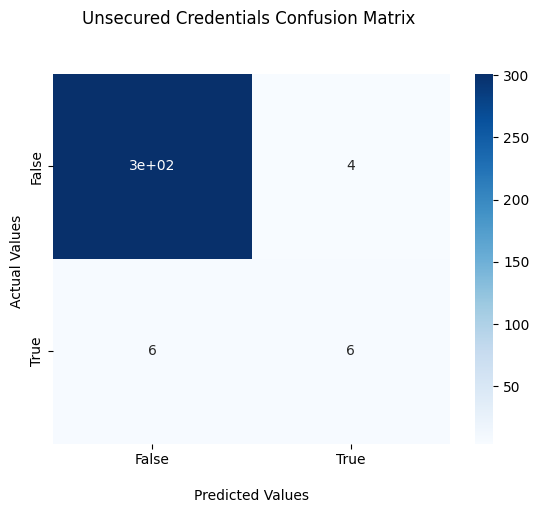

Brute Force


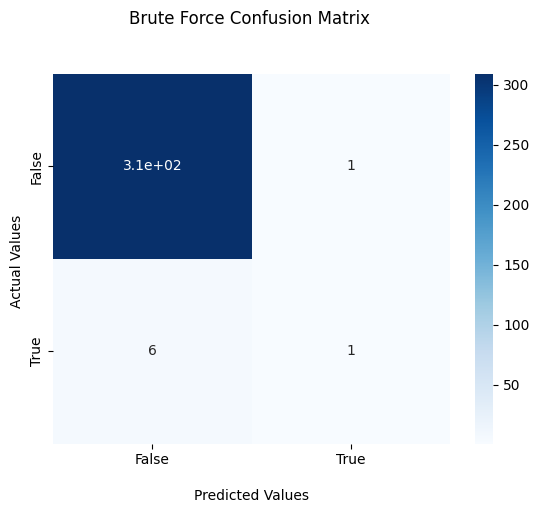

File and Directory Discovery


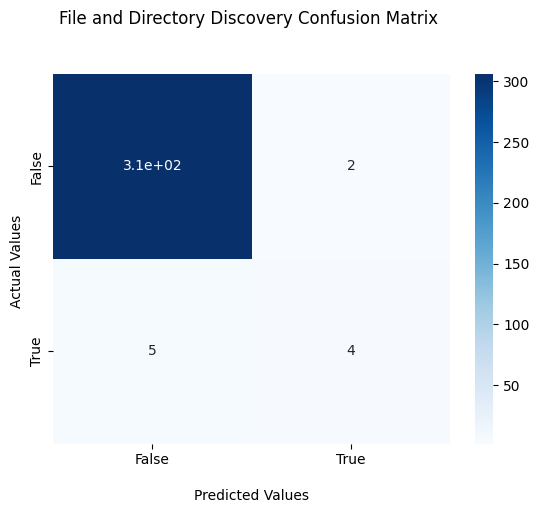

Valid Accounts


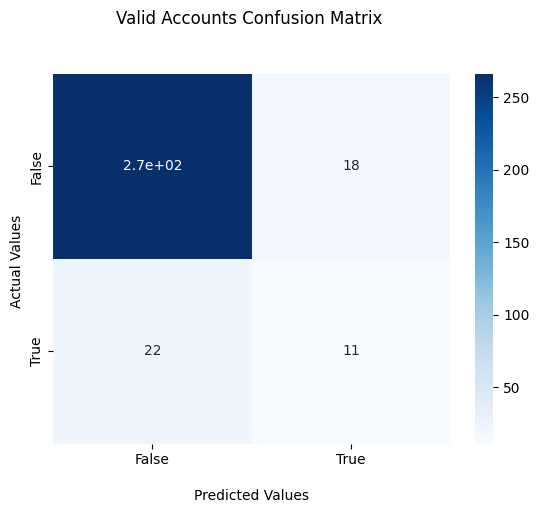

Exploitation for Defense Evasion


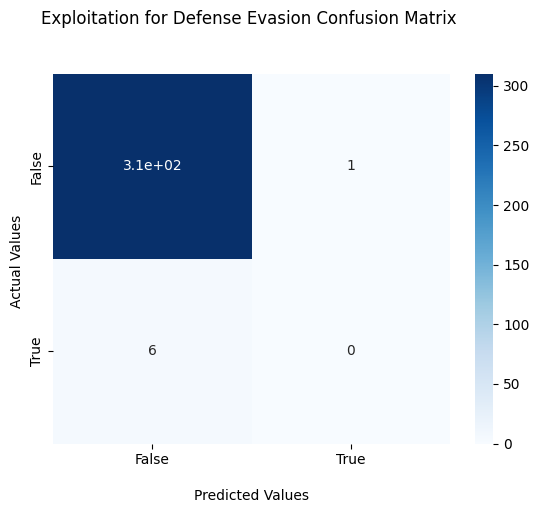

Create Account


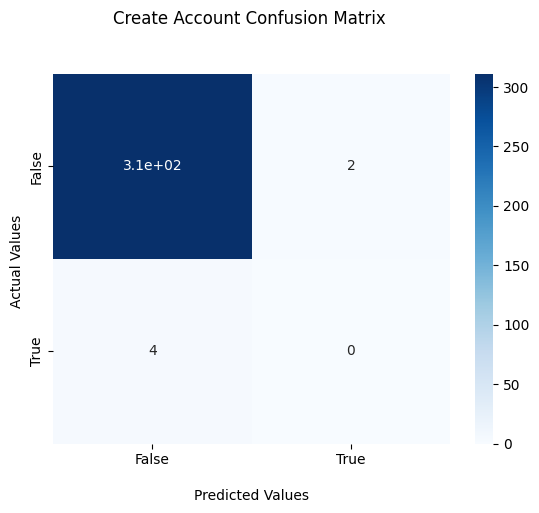

Endpoint Denial of Service


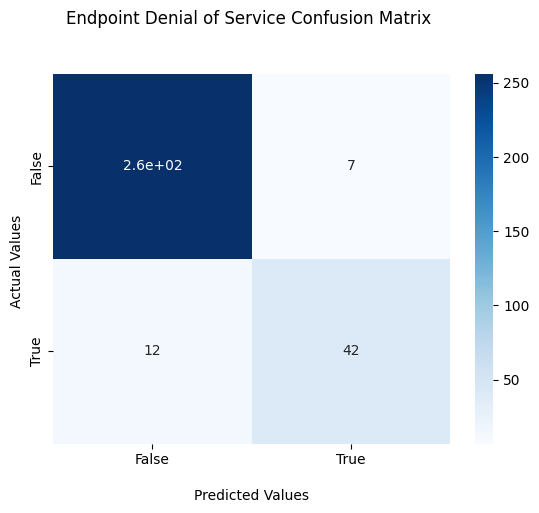

Drive-by Compromise


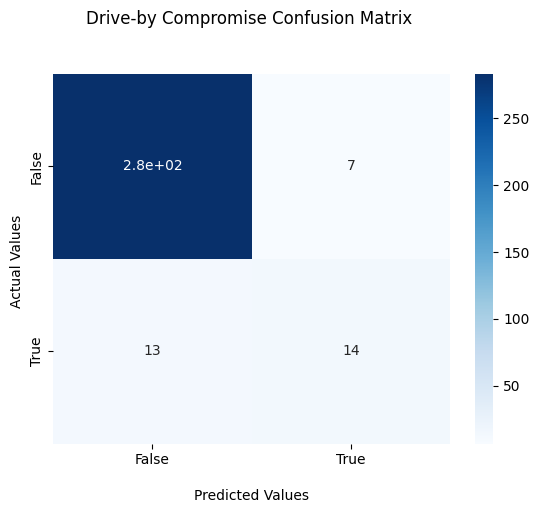

Exploitation for Client Execution


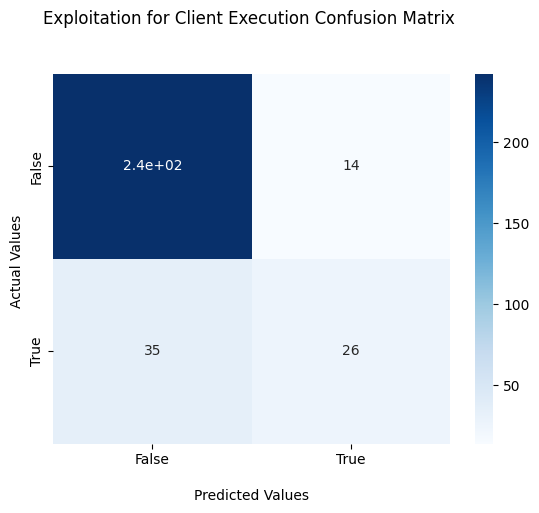

Exploitation of Remote Services


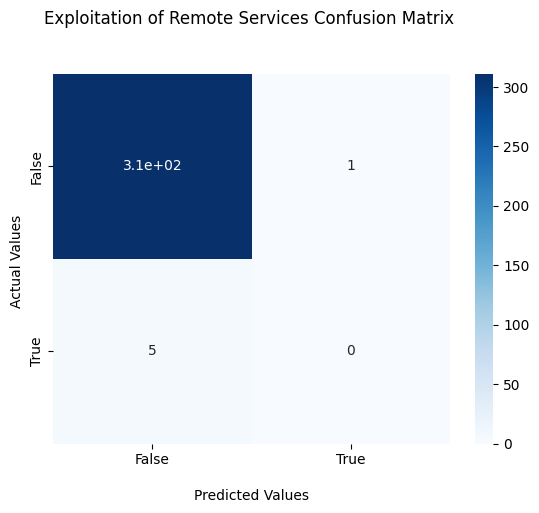

Stage Capabilities


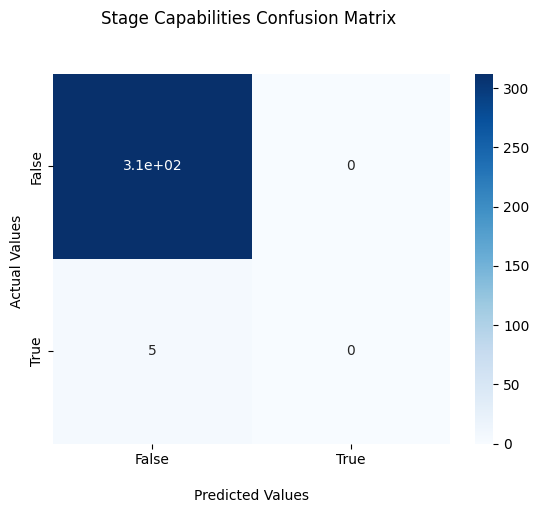

Exploit Public-Facing Application


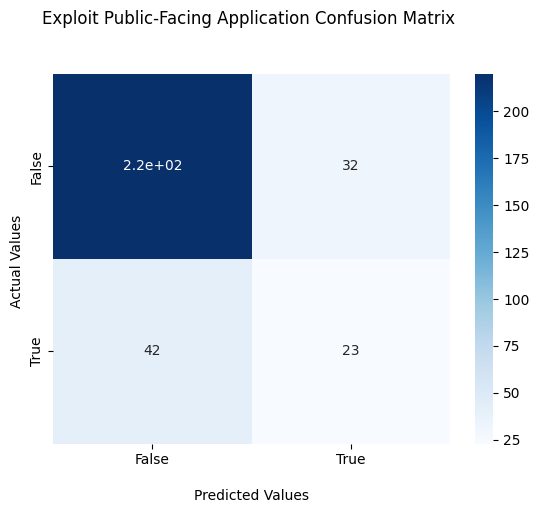

Forge Web Credentials


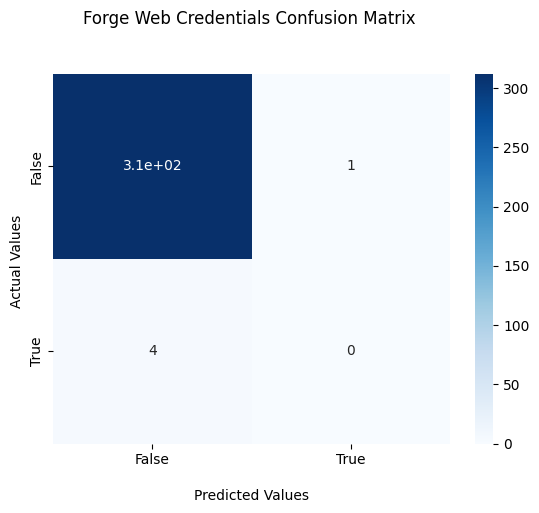

In [56]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

Multi-label SciBERT

In [184]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer

In [185]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [186]:
(X_train, y_train) = load_data_from_file('/kaggle/input/input-files/X_train.csv', '/kaggle/input/input-files/y_train.csv')
(X_test, y_test) = load_data_from_file('/kaggle/input/input-files/X_test.csv', '/kaggle/input/input-files/y_test.csv')


In [187]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens

def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]

def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [188]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'allenai/scibert_scivocab_uncased'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 320
    self.BATCH_SIZE = 32
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

In [189]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        padding="max_length",
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [190]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([32, 320])
attention_mask shape: torch.Size([32, 320])
labels shape: torch.Size([32, 31])


In [191]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.5)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [192]:
# device = config.DEVICE
# device
import torch

# In your config
config.DEVICE = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

# Then everywhere you call
device = config.DEVICE

In [193]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)


In [194]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'extended_scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score

Train

In [195]:
model = Model()
model.to(device);

In [196]:

best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.3518230766057968
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.28531047999858855
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.25337448716163635
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.366311252117157
Eval Val loss: 0.25337448716163635
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.2340410605072975
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.22498443424701692
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.21818052530288695
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.23675464024377424
Eval Val loss: 0.21818052530288695
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 1/50: F1 Score 0.0


Epoch 2:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.2154519885778427
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.21259438544511794
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.21030482202768325
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.21532744446466134
Eval Val loss: 0.21030482202768325
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 2/50: F1 Score 0.0


Epoch 3:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.2095783531665802
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.20914065539836885
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.20789832919836043
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20876405474751494
Eval Val loss: 0.20789832919836043
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 3/50: F1 Score 0.0


Epoch 4:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.20671921521425246
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.2055091828107834
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.20532585233449935
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20448861080546712
Eval Val loss: 0.20532585233449935
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 4/50: F1 Score 0.0


Epoch 5:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.20075045228004457
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 28
Eval Val loss: 0.1987665206193924
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 42
Eval Val loss: 0.1971656173467636
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.006535947712418301
Training loss: 0.19889862939368846
Eval Val loss: 0.1971656173467636
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.006535947712418301
Epoch 5/50: F1 Score 0.006535947712418301
--- Best Model. Val loss: 0.0 -> 0.006535947712418301


Epoch 6:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.19404737204313277
Eval Val accuracy: 0.01892744479495268
Eval Val micro f1 score: 0.06951026856240126
-- Step: 28
Eval Val loss: 0.19466283470392226
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.006525285481239805
-- Step: 42
Eval Val loss: 0.1919301763176918
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.1685714285714286
Training loss: 0.19090433037558266
Eval Val loss: 0.1919301763176918
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.1685714285714286
Epoch 6/50: F1 Score 0.1685714285714286
--- Best Model. Val loss: 0.006535947712418301 -> 0.1685714285714286


Epoch 7:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.18767636716365815
Eval Val accuracy: 0.022082018927444796
Eval Val micro f1 score: 0.13513513513513514
-- Step: 28
Eval Val loss: 0.18920706659555436
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.028708133971291867
-- Step: 42
Eval Val loss: 0.18956811726093292
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.17464788732394368
Training loss: 0.18391016610833102
Eval Val loss: 0.18956811726093292
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.17464788732394368
Epoch 7/50: F1 Score 0.17464788732394368
--- Best Model. Val loss: 0.1685714285714286 -> 0.17464788732394368


Epoch 8:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.18586965054273605
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.1561119293078056
-- Step: 28
Eval Val loss: 0.18442381471395491
Eval Val accuracy: 0.012618296529968454
Eval Val micro f1 score: 0.1277860326894502
-- Step: 42
Eval Val loss: 0.18262504935264587
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.16255442670537013
Training loss: 0.17739109071188194
Eval Val loss: 0.18262504935264587
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.16255442670537013
Epoch 8/50: F1 Score 0.16255442670537013


Epoch 9:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.18021804094314575
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.18439716312056736
-- Step: 28
Eval Val loss: 0.17928268313407897
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.25103448275862067
-- Step: 42
Eval Val loss: 0.176873978972435
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.22159887798036465
Training loss: 0.17028542521388032
Eval Val loss: 0.176873978972435
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.22159887798036465
Epoch 9/50: F1 Score 0.22159887798036465
--- Best Model. Val loss: 0.17464788732394368 -> 0.22159887798036465


Epoch 10:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.177057184278965
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.24864864864864866
-- Step: 28
Eval Val loss: 0.1749829351902008
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.27163781624500666
-- Step: 42
Eval Val loss: 0.1761583775281906
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.2520107238605898
Training loss: 0.16288253664970398
Eval Val loss: 0.1761583775281906
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.2520107238605898
Epoch 10/50: F1 Score 0.2520107238605898
--- Best Model. Val loss: 0.22159887798036465 -> 0.2520107238605898


Epoch 11:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.17360515892505646
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.2955145118733509
-- Step: 28
Eval Val loss: 0.1772388070821762
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.22315202231520223
-- Step: 42
Eval Val loss: 0.17498863041400908
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.27622841965471445
Training loss: 0.15585930732100509
Eval Val loss: 0.17498863041400908
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.27622841965471445
Epoch 11/50: F1 Score 0.27622841965471445
--- Best Model. Val loss: 0.2520107238605898 -> 0.27622841965471445


Epoch 12:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1732459157705307
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.29648894668400516
-- Step: 28
Eval Val loss: 0.17111942321062087
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.28874172185430463
-- Step: 42
Eval Val loss: 0.1711423322558403
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.321608040201005
Training loss: 0.14814517699008764
Eval Val loss: 0.1711423322558403
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.321608040201005
Epoch 12/50: F1 Score 0.321608040201005
--- Best Model. Val loss: 0.27622841965471445 -> 0.321608040201005


Epoch 13:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1692621186375618
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3231552162849873
-- Step: 28
Eval Val loss: 0.16808551400899888
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.3354350567465322
-- Step: 42
Eval Val loss: 0.16950028240680695
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.31313131313131315
Training loss: 0.13958564955134725
Eval Val loss: 0.16950028240680695
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.31313131313131315
Epoch 13/50: F1 Score 0.31313131313131315


Epoch 14:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16769951432943345
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3598531211750306
-- Step: 28
Eval Val loss: 0.16681180149316788
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3616504854368932
-- Step: 42
Eval Val loss: 0.16649342626333236
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.33995037220843677
Training loss: 0.132525323088779
Eval Val loss: 0.16649342626333236
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.33995037220843677
Epoch 14/50: F1 Score 0.33995037220843677
--- Best Model. Val loss: 0.321608040201005 -> 0.33995037220843677


Epoch 15:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16646190881729125
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3535228677379481
-- Step: 28
Eval Val loss: 0.16686600297689438
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.36342042755344417
-- Step: 42
Eval Val loss: 0.16576816588640214
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.36
Training loss: 0.12584177092757337
Eval Val loss: 0.16576816588640214
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.36
Epoch 15/50: F1 Score 0.36
--- Best Model. Val loss: 0.33995037220843677 -> 0.36


Epoch 16:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16530522406101228
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.37956204379562036
-- Step: 28
Eval Val loss: 0.16522572189569473
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3801843317972351
-- Step: 42
Eval Val loss: 0.16439937576651573
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.34220532319391633
Training loss: 0.11942086611376253
Eval Val loss: 0.16439937576651573
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.34220532319391633
Epoch 16/50: F1 Score 0.34220532319391633


Epoch 17:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1636400565505028
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.3929411764705882
-- Step: 28
Eval Val loss: 0.16632024496793746
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.38850574712643676
-- Step: 42
Eval Val loss: 0.16340866833925247
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3609022556390978
Training loss: 0.11235202848911285
Eval Val loss: 0.16340866833925247
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3609022556390978
Epoch 17/50: F1 Score 0.3609022556390978
--- Best Model. Val loss: 0.36 -> 0.3609022556390978


Epoch 18:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1631520077586174
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.4223744292237443
-- Step: 28
Eval Val loss: 0.16624719202518462
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3953488372093023
-- Step: 42
Eval Val loss: 0.16352604627609252
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.37864077669902907
Training loss: 0.10776357318079749
Eval Val loss: 0.16352604627609252
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.37864077669902907
Epoch 18/50: F1 Score 0.37864077669902907
--- Best Model. Val loss: 0.3609022556390978 -> 0.37864077669902907


Epoch 19:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1640208035707474
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.41964285714285715
-- Step: 28
Eval Val loss: 0.16528163701295853
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3736780258519389
-- Step: 42
Eval Val loss: 0.16365088224411012
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4023121387283237
Training loss: 0.10371208034975585
Eval Val loss: 0.16365088224411012
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4023121387283237
Epoch 19/50: F1 Score 0.4023121387283237
--- Best Model. Val loss: 0.37864077669902907 -> 0.4023121387283237


Epoch 20:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16549065411090852
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3801843317972351
-- Step: 28
Eval Val loss: 0.16513323038816452
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4009111617312073
-- Step: 42
Eval Val loss: 0.16287651509046555
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.39721254355400704
Training loss: 0.09849099156468413
Eval Val loss: 0.16287651509046555
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.39721254355400704
Epoch 20/50: F1 Score 0.39721254355400704


Epoch 21:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16650522500276566
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.38870056497175137
-- Step: 28
Eval Val loss: 0.16521427482366563
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.42093784078516905
-- Step: 42
Eval Val loss: 0.16410103142261506
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.397196261682243
Training loss: 0.0949758212406968
Eval Val loss: 0.16410103142261506
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.397196261682243
Epoch 21/50: F1 Score 0.397196261682243


Epoch 22:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16577577888965606
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.41228070175438597
-- Step: 28
Eval Val loss: 0.1628849282860756
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.42458100558659223
-- Step: 42
Eval Val loss: 0.16265347748994827
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4108967082860386
Training loss: 0.08972891359481701
Eval Val loss: 0.16265347748994827
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4108967082860386
Epoch 22/50: F1 Score 0.4108967082860386
--- Best Model. Val loss: 0.4023121387283237 -> 0.4108967082860386


Epoch 23:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16313648000359535
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.40271493212669685
-- Step: 28
Eval Val loss: 0.16328372359275817
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4280936454849498
-- Step: 42
Eval Val loss: 0.16304081976413726
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4
Training loss: 0.086362935082857
Eval Val loss: 0.16304081976413726
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4
Epoch 23/50: F1 Score 0.4


Epoch 24:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16256809532642363
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.41621029572836804
-- Step: 28
Eval Val loss: 0.16227249354124068
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4375
-- Step: 42
Eval Val loss: 0.16406967788934707
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.3907514450867052
Training loss: 0.0837475148051284
Eval Val loss: 0.16406967788934707
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.3907514450867052
Epoch 24/50: F1 Score 0.3907514450867052


Epoch 25:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16385672688484193
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.4190064794816415
-- Step: 28
Eval Val loss: 0.16572605967521667
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4249471458773784
-- Step: 42
Eval Val loss: 0.16776833608746528
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.39953810623556585
Training loss: 0.08092798041396362
Eval Val loss: 0.16776833608746528
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.39953810623556585
Epoch 25/50: F1 Score 0.39953810623556585


Epoch 26:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1641068659722805
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44232804232804235
-- Step: 28
Eval Val loss: 0.16536054462194444
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4103114930182599
-- Step: 42
Eval Val loss: 0.16654307022690773
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4098544232922733
Training loss: 0.07777957869477051
Eval Val loss: 0.16654307022690773
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4098544232922733
Epoch 26/50: F1 Score 0.4098544232922733


Epoch 27:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16375982835888864
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4425531914893617
-- Step: 28
Eval Val loss: 0.16387382447719573
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4276457883369331
-- Step: 42
Eval Val loss: 0.16379544213414193
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42417582417582417
Training loss: 0.07510829890190168
Eval Val loss: 0.16379544213414193
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42417582417582417
Epoch 27/50: F1 Score 0.42417582417582417
--- Best Model. Val loss: 0.4108967082860386 -> 0.42417582417582417


Epoch 28:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16464560031890868
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4504310344827586
-- Step: 28
Eval Val loss: 0.16344851553440093
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4337606837606837
-- Step: 42
Eval Val loss: 0.16213012337684632
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4380530973451327
Training loss: 0.07260516814367715
Eval Val loss: 0.16213012337684632
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4380530973451327
Epoch 28/50: F1 Score 0.4380530973451327
--- Best Model. Val loss: 0.42417582417582417 -> 0.4380530973451327


Epoch 29:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16382241249084473
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44782608695652176
-- Step: 28
Eval Val loss: 0.16458937376737595
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4585062240663901
-- Step: 42
Eval Val loss: 0.16298218742012976
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.42744656917885265
Training loss: 0.0696895178840604
Eval Val loss: 0.16298218742012976
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.42744656917885265
Epoch 29/50: F1 Score 0.42744656917885265


Epoch 30:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1636969491839409
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45659163987138257
-- Step: 28
Eval Val loss: 0.1649988129734993
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.46043165467625896
-- Step: 42
Eval Val loss: 0.1627153865993023
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4232922732362821
Training loss: 0.06753198516576789
Eval Val loss: 0.1627153865993023
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4232922732362821
Epoch 30/50: F1 Score 0.4232922732362821


Epoch 31:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16419847756624223
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4454054054054054
-- Step: 28
Eval Val loss: 0.16720335334539413
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4476386036960986
-- Step: 42
Eval Val loss: 0.16369156688451766
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4299889746416759
Training loss: 0.06578847748595615
Eval Val loss: 0.16369156688451766
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4299889746416759
Epoch 31/50: F1 Score 0.4299889746416759


Epoch 32:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16471674516797066
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.43743199129488575
-- Step: 28
Eval Val loss: 0.1640382394194603
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4535864978902953
-- Step: 42
Eval Val loss: 0.16464237570762635
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4225352112676056
Training loss: 0.06360666800376981
Eval Val loss: 0.16464237570762635
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4225352112676056
Epoch 32/50: F1 Score 0.4225352112676056


Epoch 33:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16459949016571046
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4468313641245972
-- Step: 28
Eval Val loss: 0.164973708987236
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45406546990496305
-- Step: 42
Eval Val loss: 0.16720852106809617
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.41967213114754104
Training loss: 0.06201054025874581
Eval Val loss: 0.16720852106809617
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.41967213114754104
Epoch 33/50: F1 Score 0.41967213114754104


Epoch 34:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16431770250201225
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45085470085470086
-- Step: 28
Eval Val loss: 0.16417989358305932
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44089456869009586
-- Step: 42
Eval Val loss: 0.16639662235975267
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4319654427645789
Training loss: 0.060676162845866626
Eval Val loss: 0.16639662235975267
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4319654427645789
Epoch 34/50: F1 Score 0.4319654427645789


Epoch 35:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1643153429031372
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4437299035369775
-- Step: 28
Eval Val loss: 0.1647927977144718
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44989339019189767
-- Step: 42
Eval Val loss: 0.16599439829587936
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.42244224422442245
Training loss: 0.059270964848787286
Eval Val loss: 0.16599439829587936
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.42244224422442245
Epoch 35/50: F1 Score 0.42244224422442245


Epoch 36:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16439079120755196
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4370290635091497
-- Step: 28
Eval Val loss: 0.1654785841703415
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.45127118644067793
-- Step: 42
Eval Val loss: 0.16579110473394393
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.442286947141316
Training loss: 0.05791365130003109
Eval Val loss: 0.16579110473394393
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.442286947141316
Epoch 36/50: F1 Score 0.442286947141316
--- Best Model. Val loss: 0.4380530973451327 -> 0.442286947141316


Epoch 37:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16505758240818977
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44034707158351416
-- Step: 28
Eval Val loss: 0.16465530321002006
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.44885177453027136
-- Step: 42
Eval Val loss: 0.1659225545823574
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44251626898047725
Training loss: 0.05672059883905012
Eval Val loss: 0.1659225545823574
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44251626898047725
Epoch 37/50: F1 Score 0.44251626898047725
--- Best Model. Val loss: 0.442286947141316 -> 0.44251626898047725


Epoch 38:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16586877256631852
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.43402399127589963
-- Step: 28
Eval Val loss: 0.16487532407045363
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4497907949790795
-- Step: 42
Eval Val loss: 0.16614170968532563
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4442036836403033
Training loss: 0.05557358871365702
Eval Val loss: 0.16614170968532563
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4442036836403033
Epoch 38/50: F1 Score 0.4442036836403033
--- Best Model. Val loss: 0.44251626898047725 -> 0.4442036836403033


Epoch 39:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16598272770643235
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4403066812705367
-- Step: 42
Eval Val loss: 0.16486498787999154
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45521601685985247
Training loss: 0.05200910646208497
Eval Val loss: 0.16486498787999154
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45521601685985247
Epoch 42/50: F1 Score 0.45521601685985247
--- Best Model. Val loss: 0.45052631578947366 -> 0.45521601685985247


Epoch 43:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1662475995719433
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.440567066521265
-- Step: 28
Eval Val loss: 0.16574569121003152
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45016077170418006
-- Step: 42
Eval Val loss: 0.16515759527683258
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4503171247357294
Training loss: 0.051323692985745364
Eval Val loss: 0.16515759527683258
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4503171247357294
Epoch 43/50: F1 Score 0.4503171247357294


Epoch 44:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1661375917494297
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4410480349344978
-- Step: 28
Eval Val loss: 0.16589626297354698
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.43817787418655096
-- Step: 42
Eval Val loss: 0.16509246304631234
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44845908607863966
Training loss: 0.050421518078723616
Eval Val loss: 0.16509246304631234
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44845908607863966
Epoch 44/50: F1 Score 0.44845908607863966


Epoch 45:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16602267622947692
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4413043478260869
-- Step: 28
Eval Val loss: 0.1660291388630867
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.44108108108108113
-- Step: 42
Eval Val loss: 0.16527654230594635
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44562899786780386
Training loss: 0.04977259854244631
Eval Val loss: 0.16527654230594635
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44562899786780386
Epoch 45/50: F1 Score 0.44562899786780386


Epoch 46:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.165542121976614
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.44756756756756755
-- Step: 28
Eval Val loss: 0.16592691838741302
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4427480916030535
-- Step: 42
Eval Val loss: 0.16520112827420236
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4446831364124597
Training loss: 0.04980961597243021
Eval Val loss: 0.16520112827420236
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4446831364124597
Epoch 46/50: F1 Score 0.4446831364124597


Epoch 47:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16527677252888678
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.45016077170418006
-- Step: 28
Eval Val loss: 0.16588546708226204
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4415584415584416
-- Step: 42
Eval Val loss: 0.16565718352794648
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4446831364124597
Training loss: 0.04958298819702725
Eval Val loss: 0.16565718352794648
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4446831364124597
Epoch 47/50: F1 Score 0.4446831364124597


Epoch 48:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.1654636450111866
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4451612903225806
-- Step: 28
Eval Val loss: 0.1656426340341568
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4470842332613391
-- Step: 42
Eval Val loss: 0.16556764915585517
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4466019417475728
Training loss: 0.04940246634705122
Eval Val loss: 0.16556764915585517
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4466019417475728
Epoch 48/50: F1 Score 0.4466019417475728


Epoch 49:   0%|          | 0/43 [00:00<?, ?it/s]

-- Step: 14
Eval Val loss: 0.16557009667158126
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4449244060475162
-- Step: 28
Eval Val loss: 0.165644046664238
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4449244060475162
-- Step: 42
Eval Val loss: 0.16563237309455872
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4449244060475162
Training loss: 0.049441804416304413
Eval Val loss: 0.16563237309455872
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4449244060475162
Epoch 49/50: F1 Score 0.4449244060475162


Test

In [197]:
test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)

In [198]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred
     

In [199]:
test_pred = predict(best_model)

In [200]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [201]:
print(accuracy_score(y_test.values, test_pred))

0.1608832807570978


In [202]:

print("F1 Score")
pd.set_option('display.max_columns', None)
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Adversary-in-the-Middle,Unsecured Credentials,Hijack Execution Flow,Drive-by Compromise,Exploitation for Client Execution,Data Manipulation,User Execution,Exploit Public-Facing Application,File and Directory Discovery,Data from Local System,Valid Accounts,Browser Session Hijacking,Brute Force,Phishing,Archive Collected Data,Server Software Component,Access Token Manipulation,Process Injection,External Remote Services,Network Sniffing,Exploitation for Credential Access,Data Destruction,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.830189,0.612245,0.561983,0.56,0.545455,0.488889,0.473684,0.47191,0.461538,0.439024,0.36,0.333333,0.311111,0.307692,0.266667,0.25,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [203]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Unsecured Credentials,Adversary-in-the-Middle,Hijack Execution Flow,Data Manipulation,Exploitation for Client Execution,Drive-by Compromise,User Execution,Exploit Public-Facing Application,Valid Accounts,Data from Local System,File and Directory Discovery,Browser Session Hijacking,Brute Force,Phishing,Archive Collected Data,Server Software Component,Access Token Manipulation,Process Injection,External Remote Services,Network Sniffing,Exploitation for Credential Access,Data Destruction,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,0.814815,0.6,0.557377,0.5,0.4375,0.407407,0.352941,0.344262,0.333333,0.3,0.276923,0.242424,0.241379,0.222222,0.181818,0.142857,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [204]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Phishing,Brute Force,Endpoint Denial of Service,User Execution,Drive-by Compromise,Adversary-in-the-Middle,Exploitation for Client Execution,Data Manipulation,File and Directory Discovery,Exploitation for Privilege Escalation,Hijack Execution Flow,Unsecured Credentials,Command and Scripting Interpreter,Exploit Public-Facing Application,Browser Session Hijacking,Data from Local System,Valid Accounts,Archive Collected Data,Server Software Component,Access Token Manipulation,Process Injection,External Remote Services,Network Sniffing,Exploitation for Credential Access,Data Destruction,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,Create Account,Exploitation of Remote Services,Stage Capabilities,Forge Web Credentials
0,1.0,1.0,0.846154,0.818182,0.818182,0.777778,0.75,0.666667,0.666667,0.625,0.611111,0.6,0.566667,0.514286,0.5,0.4375,0.421053,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [205]:
print(f1_score(y_test.values, test_pred, average='weighted'))

0.41494178851236935


In [206]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.3540983606557377


In [207]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5588261049898238


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


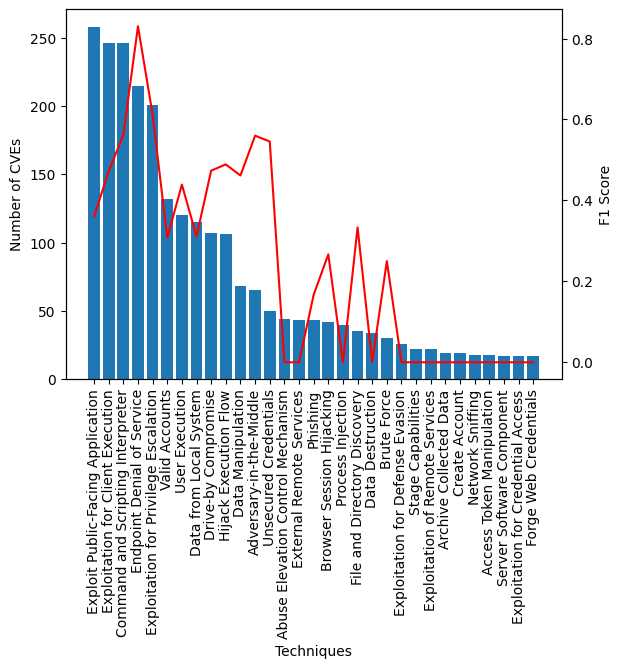

In [208]:

print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


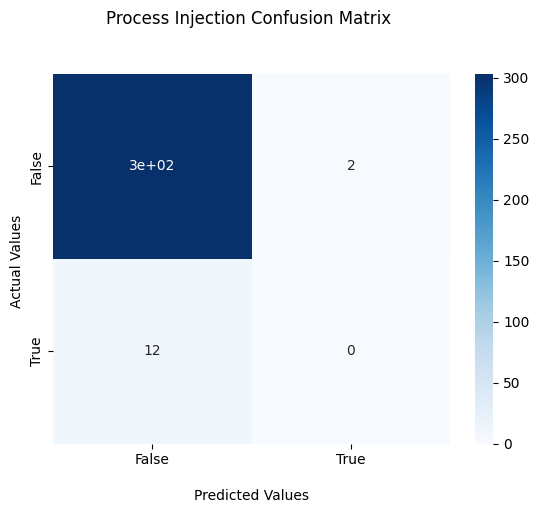

Access Token Manipulation


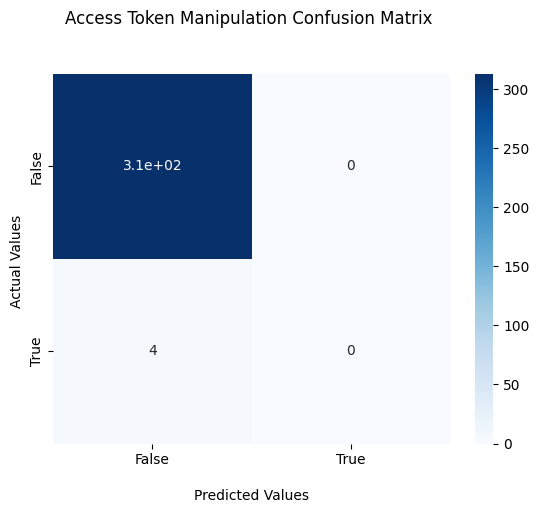

Hijack Execution Flow


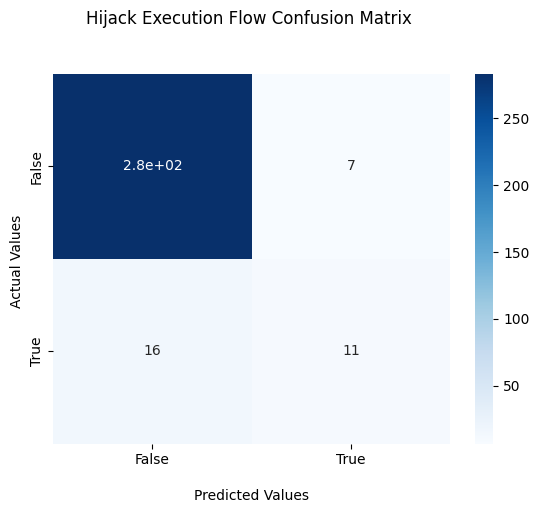

Data from Local System


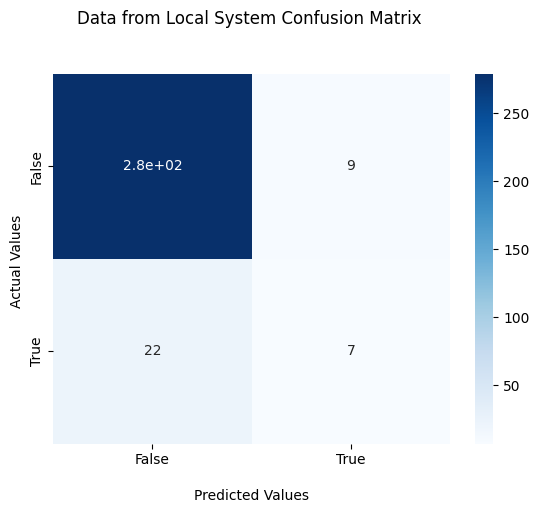

External Remote Services


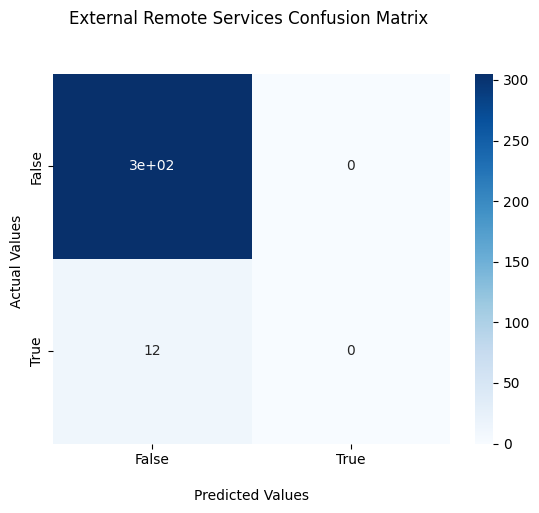

Data Manipulation


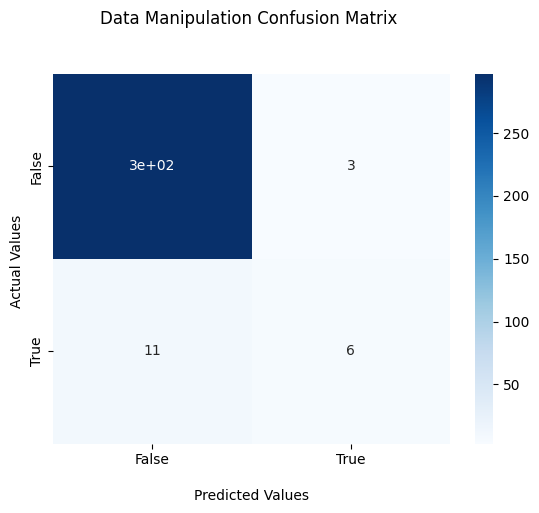

Network Sniffing


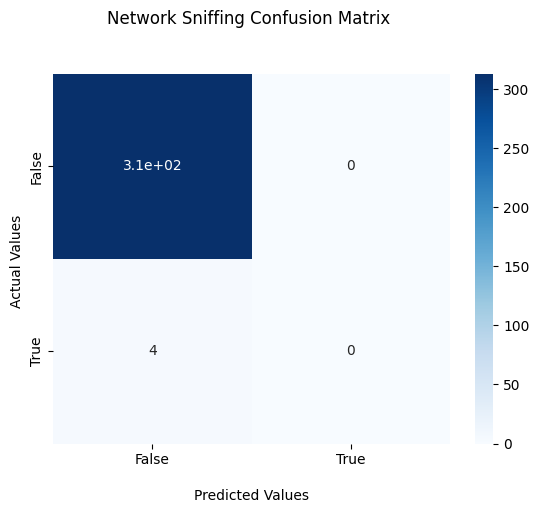

Exploitation for Privilege Escalation


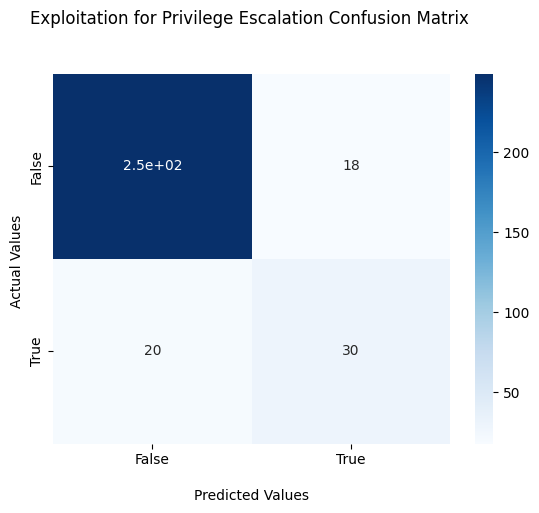

Command and Scripting Interpreter


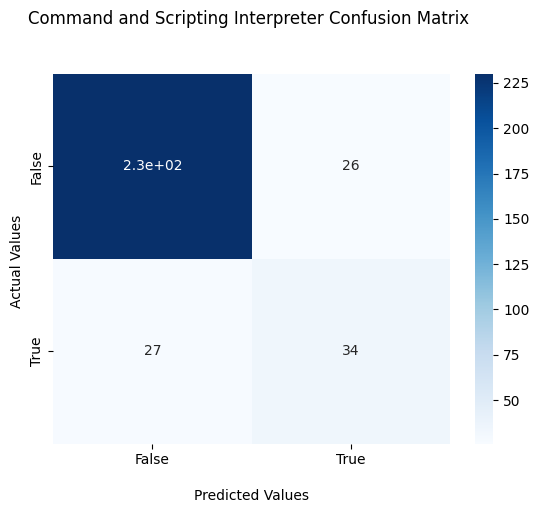

Phishing


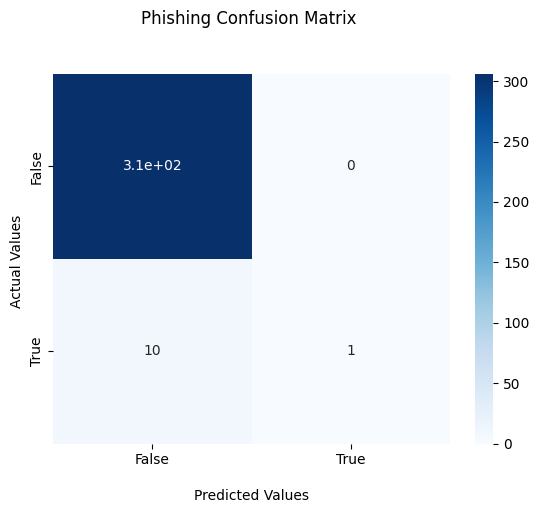

Server Software Component


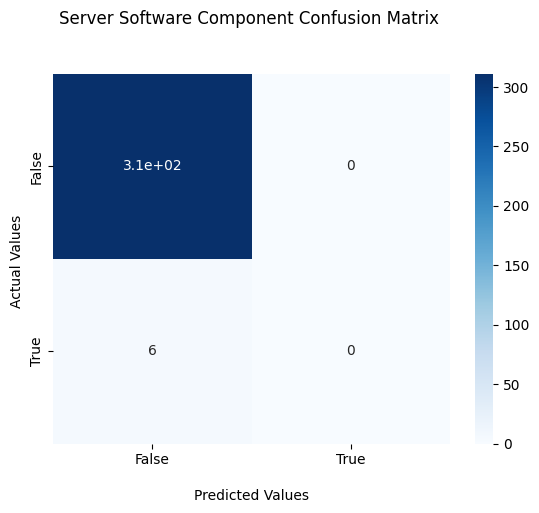

Archive Collected Data


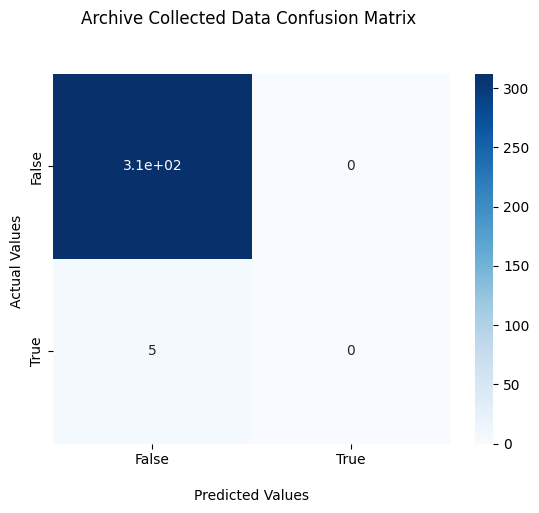

Data Destruction


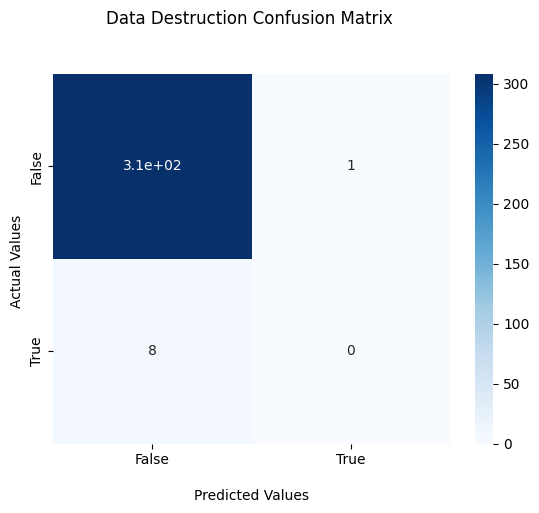

Browser Session Hijacking


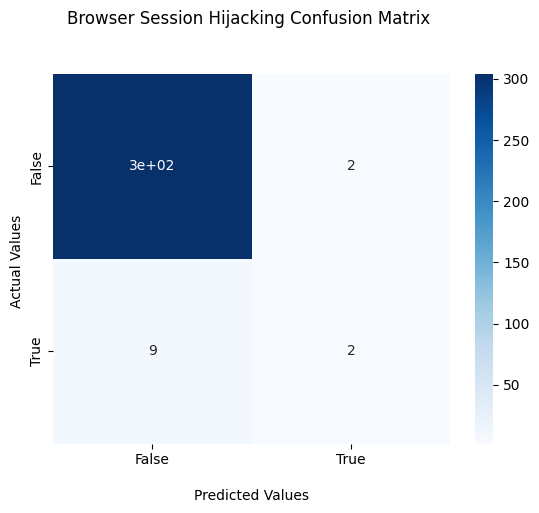

Exploitation for Credential Access


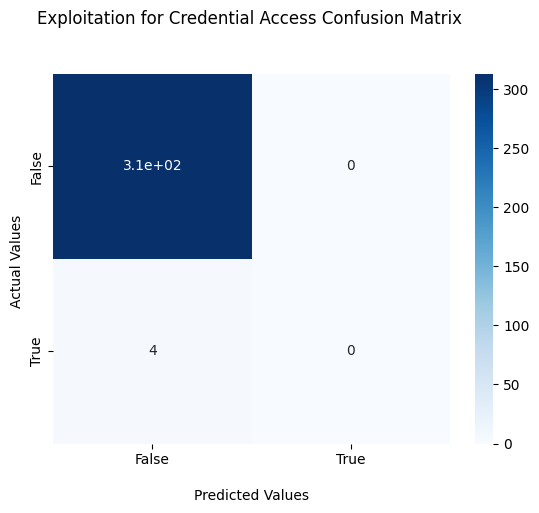

Abuse Elevation Control Mechanism


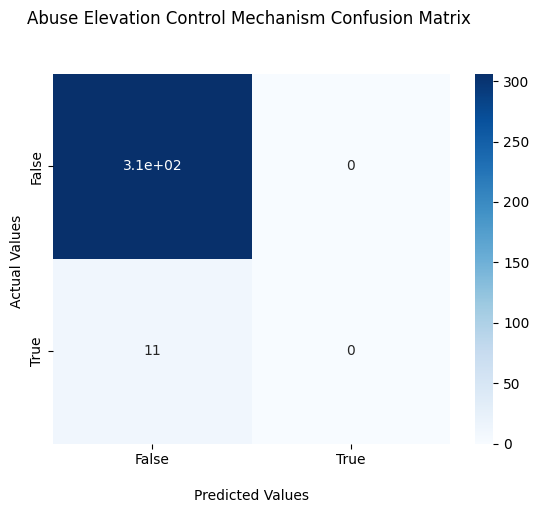

Adversary-in-the-Middle


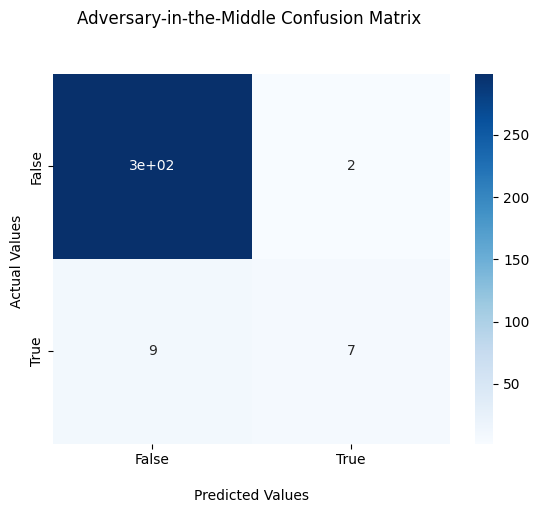

User Execution


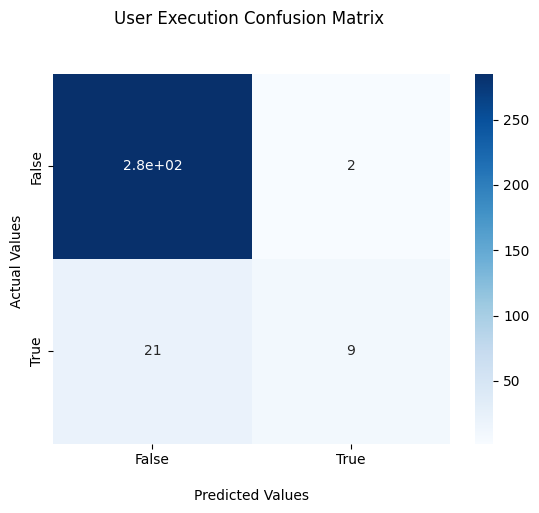

Unsecured Credentials


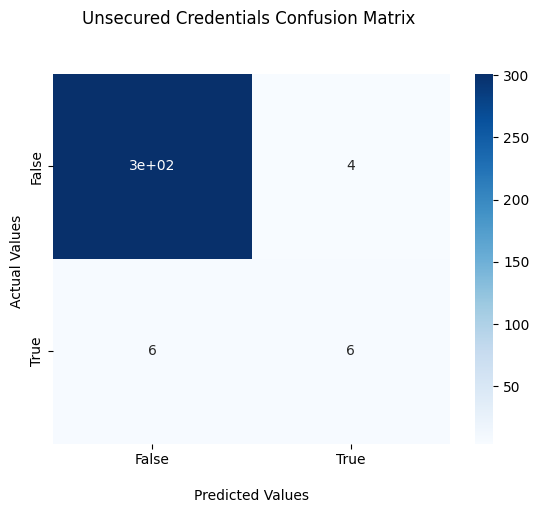

Brute Force


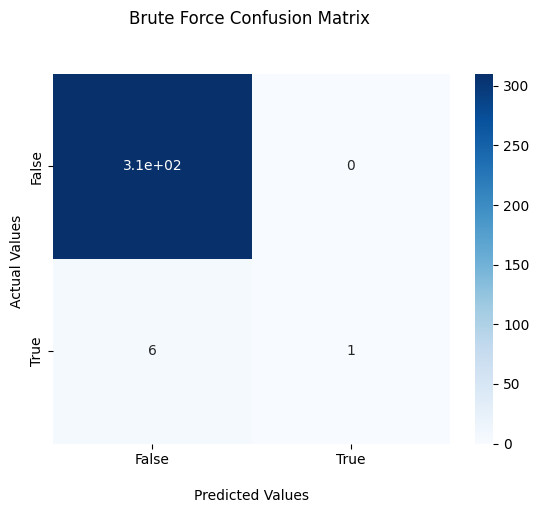

File and Directory Discovery


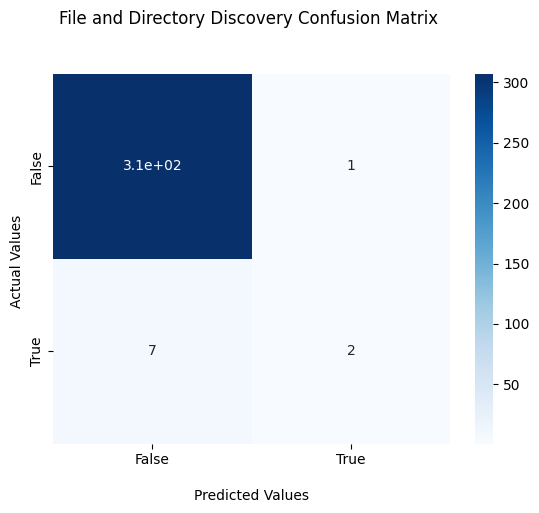

Valid Accounts


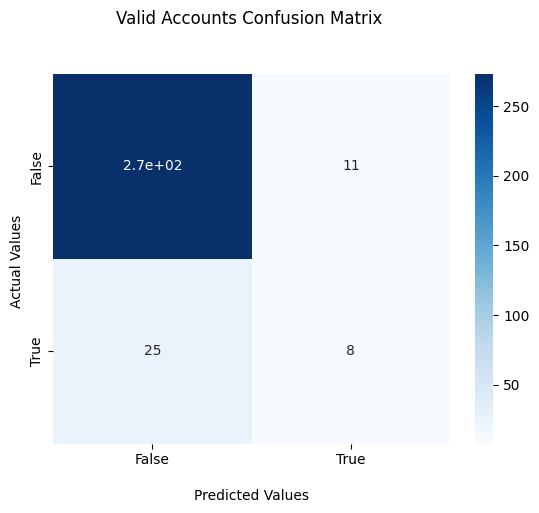

Exploitation for Defense Evasion


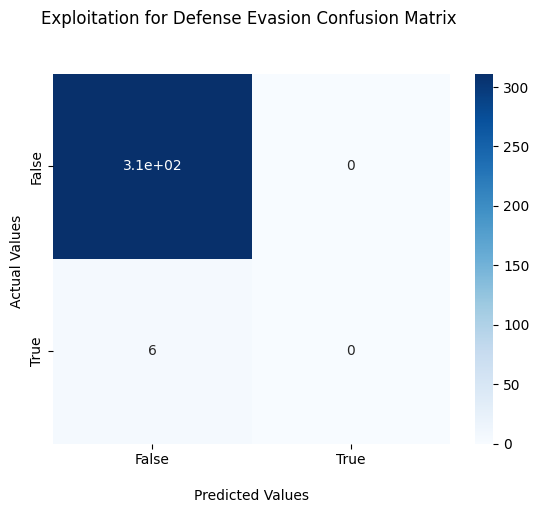

Create Account


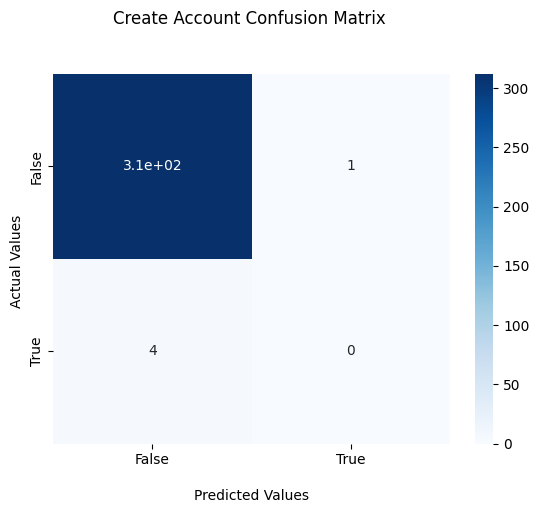

Endpoint Denial of Service


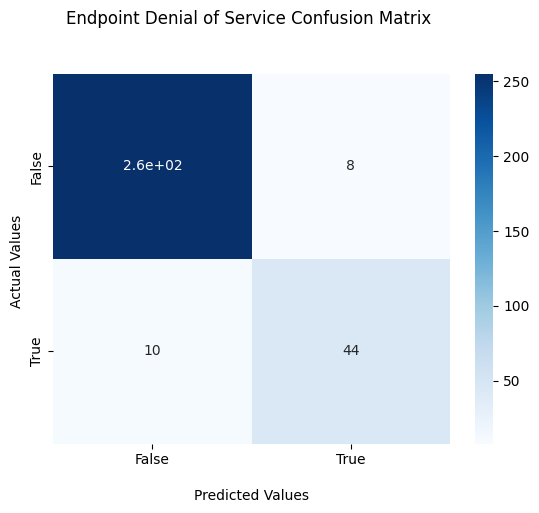

Drive-by Compromise


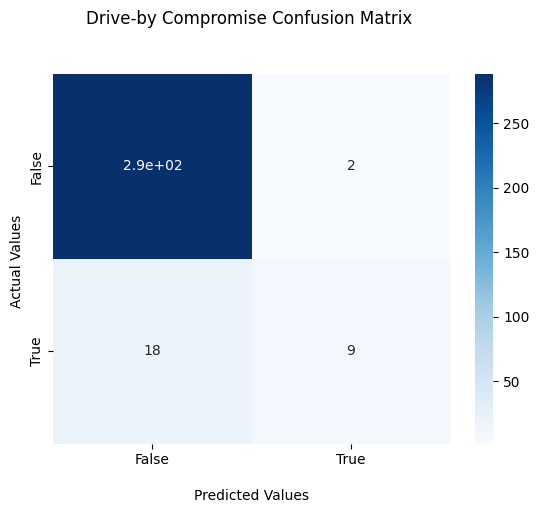

Exploitation for Client Execution


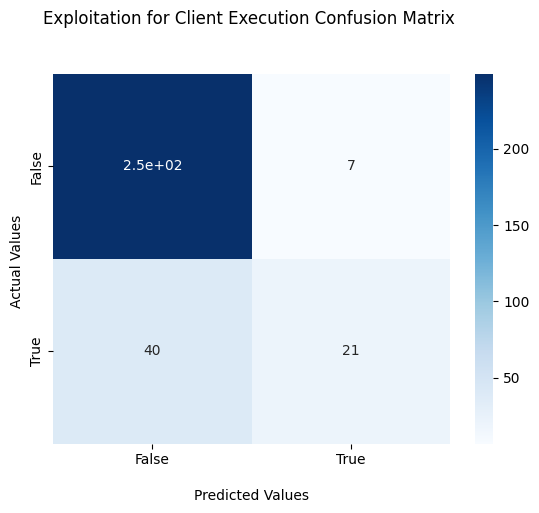

Exploitation of Remote Services


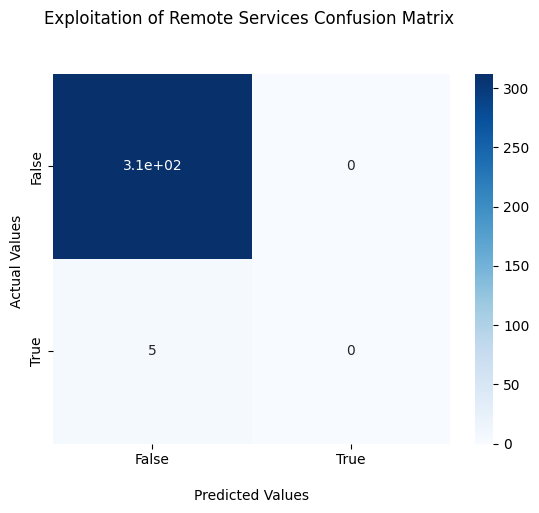

Stage Capabilities


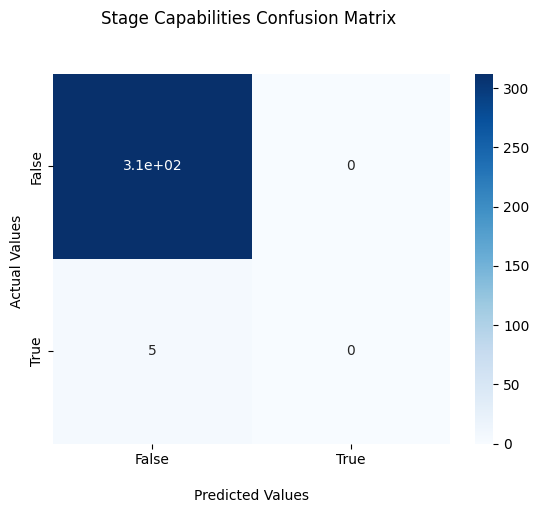

Exploit Public-Facing Application


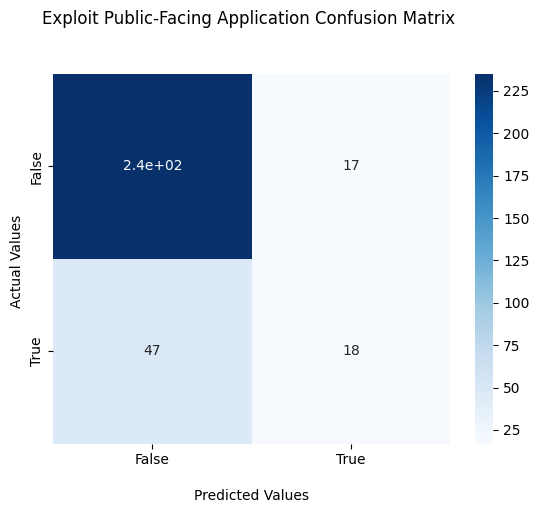

Forge Web Credentials


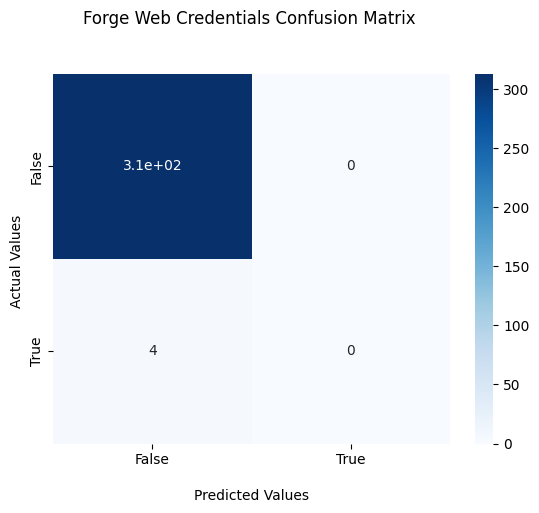

In [209]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

Multi-label SciBERT Extended

In [40]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer

In [41]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [42]:

(X_train_extended, y_train_extended) = load_data_from_file('/kaggle/input/input-files/final_extended_X_train.csv', '/kaggle/input/input-files/final_extended_y_train.csv')
(X_test, y_test) = load_data_from_file('/kaggle/input/input-files/X_test.csv', '/kaggle/input/input-files/y_test.csv')

from sklearn.model_selection import train_test_split
X_train, dummy_X_test, y_train, dummy_y_test = train_test_split(X_train_extended, y_train_extended, test_size=0.001, random_state=42)

In [43]:

def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens


def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]

def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [44]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'allenai/scibert_scivocab_uncased'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 512
    self.BATCH_SIZE = 16
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

In [45]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        padding = 'max_length',
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [46]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([16, 512])
attention_mask shape: torch.Size([16, 512])
labels shape: torch.Size([16, 31])


In [47]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.5)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [48]:
device = config.DEVICE
device

device(type='cuda')

In [49]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)

In [50]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = '/kaggle/working/extended_scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score


Train

In [51]:

model = Model()
model.to(device);

pytorch_model.bin:   0%|          | 0.00/442M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/442M [00:00<?, ?B/s]

In [52]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22804223373532295
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 150
Eval Val loss: 0.22283586412668227
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 225
Eval Val loss: 0.2226184979081154
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.21524272489864216
Eval Val loss: 0.2226184979081154
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.21053240373730658
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
-- Step: 150
Eval Val loss: 0.1976783387362957
Eval Val accuracy: 0.006309148264984227
Eval Val micro f1 score: 0.013029315960912053
-- Step: 225
Eval Val loss: 0.1876866713166237
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.05087440381558029
Training loss: 0.15375812767089997
Eval Val loss: 0.1876866713166237
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.05087440381558029
Epoch 1/50: F1 Score 0.05087440381558029
--- Best Model. Val loss: 0.0 -> 0.05087440381558029


Epoch 2:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.1806316040456295
Eval Val accuracy: 0.0473186119873817
Eval Val micro f1 score: 0.1531664212076583
-- Step: 150
Eval Val loss: 0.1749371849000454
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.1695906432748538
-- Step: 225
Eval Val loss: 0.16812988445162774
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2587601078167116
Training loss: 0.10932892181836398
Eval Val loss: 0.16812988445162774
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2587601078167116
Epoch 2/50: F1 Score 0.2587601078167116
--- Best Model. Val loss: 0.05087440381558029 -> 0.2587601078167116


Epoch 3:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.1668090432882309
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.32169576059850374
-- Step: 150
Eval Val loss: 0.1651934117078781
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.2868318122555411
-- Step: 225
Eval Val loss: 0.1644694186747074
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3857302118171683
Training loss: 0.07911103177584905
Eval Val loss: 0.1644694186747074
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3857302118171683
Epoch 3/50: F1 Score 0.3857302118171683
--- Best Model. Val loss: 0.2587601078167116 -> 0.3857302118171683


Epoch 4:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.1643037497997284
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4226254002134472
-- Step: 150
Eval Val loss: 0.16530404835939408
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.3695150115473441
-- Step: 225
Eval Val loss: 0.16231466457247734
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4508196721311476
Training loss: 0.06260906776363871
Eval Val loss: 0.16231466457247734
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4508196721311476
Epoch 4/50: F1 Score 0.4508196721311476
--- Best Model. Val loss: 0.3857302118171683 -> 0.4508196721311476


Epoch 5:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.16472270116209983
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.41910966340933764
-- Step: 150
Eval Val loss: 0.17061715424060822
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.39433551198257083
-- Step: 225
Eval Val loss: 0.17222738564014434
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.45179584120982985
Training loss: 0.05181389671247617
Eval Val loss: 0.17222738564014434
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.45179584120982985
Epoch 5/50: F1 Score 0.45179584120982985
--- Best Model. Val loss: 0.4508196721311476 -> 0.45179584120982985


Epoch 6:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.164759835973382
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4402116402116402
-- Step: 150
Eval Val loss: 0.16752593144774436
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4466800804828974
-- Step: 225
Eval Val loss: 0.17109800800681113
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.4606741573033708
Training loss: 0.04333039832227262
Eval Val loss: 0.17109800800681113
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.4606741573033708
Epoch 6/50: F1 Score 0.4606741573033708
--- Best Model. Val loss: 0.45179584120982985 -> 0.4606741573033708


Epoch 7:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.16546489670872688
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.45373134328358206
-- Step: 150
Eval Val loss: 0.1672475002706051
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46641074856046066
-- Step: 225
Eval Val loss: 0.17425881177186966
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4565619223659889
Training loss: 0.0365869381415567
Eval Val loss: 0.17425881177186966
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4565619223659889
Epoch 7/50: F1 Score 0.4565619223659889


Epoch 8:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.17181946188211442
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45463049579045833
-- Step: 150
Eval Val loss: 0.17360566034913064
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4790739091718611
-- Step: 225
Eval Val loss: 0.17967024073004723
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.45833333333333337
Training loss: 0.03197084609996033
Eval Val loss: 0.17967024073004723
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.45833333333333337
Epoch 8/50: F1 Score 0.45833333333333337


Epoch 9:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.17540862187743186
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.458955223880597
-- Step: 150
Eval Val loss: 0.16968982219696044
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4893023255813953
-- Step: 225
Eval Val loss: 0.173281217366457
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.46270066100094426
Training loss: 0.026738262170744417
Eval Val loss: 0.173281217366457
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.46270066100094426
Epoch 9/50: F1 Score 0.46270066100094426
--- Best Model. Val loss: 0.4606741573033708 -> 0.46270066100094426


Epoch 10:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.18438596725463868
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.456140350877193
-- Step: 150
Eval Val loss: 0.1770703449845314
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4721435316336166
-- Step: 225
Eval Val loss: 0.17583932355046272
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.481994459833795
Training loss: 0.02290805600237398
Eval Val loss: 0.17583932355046272
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.481994459833795
Epoch 10/50: F1 Score 0.481994459833795
--- Best Model. Val loss: 0.46270066100094426 -> 0.481994459833795


Epoch 11:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.1876910224556923
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.45231607629427784
-- Step: 150
Eval Val loss: 0.17978227585554124
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.43767840152235965
-- Step: 225
Eval Val loss: 0.18194687664508818
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4519774011299435
Training loss: 0.019794934352991723
Eval Val loss: 0.18194687664508818
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4519774011299435
Epoch 11/50: F1 Score 0.4519774011299435


Epoch 12:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.18630855157971382
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.46280991735537197
-- Step: 150
Eval Val loss: 0.1799511656165123
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4733395696913003
-- Step: 225
Eval Val loss: 0.18623746782541276
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4700460829493087
Training loss: 0.017669963347519524
Eval Val loss: 0.18623746782541276
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4700460829493087
Epoch 12/50: F1 Score 0.4700460829493087


Epoch 13:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.18650038801133634
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4809437386569873
-- Step: 150
Eval Val loss: 0.184477236866951
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4703668861712136
-- Step: 225
Eval Val loss: 0.18643736466765404
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48294434470377023
Training loss: 0.015663845378048387
Eval Val loss: 0.18643736466765404
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48294434470377023
Epoch 13/50: F1 Score 0.48294434470377023
--- Best Model. Val loss: 0.481994459833795 -> 0.48294434470377023


Epoch 14:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.1887083999812603
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47368421052631576
-- Step: 150
Eval Val loss: 0.18858957514166833
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.47058823529411764
-- Step: 225
Eval Val loss: 0.19046266451478006
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4835164835164836
Training loss: 0.013933363877467613
Eval Val loss: 0.19046266451478006
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4835164835164836
Epoch 14/50: F1 Score 0.4835164835164836
--- Best Model. Val loss: 0.48294434470377023 -> 0.4835164835164836


Epoch 15:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.18700658306479453
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.49039341262580055
-- Step: 150
Eval Val loss: 0.18692881800234318
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4769230769230769
-- Step: 225
Eval Val loss: 0.19759808108210564
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.46451612903225814
Training loss: 0.012747553074155498
Eval Val loss: 0.19759808108210564
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.46451612903225814
Epoch 15/50: F1 Score 0.46451612903225814


Epoch 16:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.19576336368918418
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.46329837940896096
-- Step: 150
Eval Val loss: 0.19149038046598435
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4836601307189542
-- Step: 225
Eval Val loss: 0.19811395183205605
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.45343367826904984
Training loss: 0.011327424802636085
Eval Val loss: 0.19811395183205605
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.45343367826904984
Epoch 16/50: F1 Score 0.45343367826904984


Epoch 17:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.19620008766651154
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.47293447293447294
-- Step: 150
Eval Val loss: 0.19565699845552445
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.46925260170293287
-- Step: 225
Eval Val loss: 0.20018733963370322
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4660550458715596
Training loss: 0.009958393567868104
Eval Val loss: 0.20018733963370322
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4660550458715596
Epoch 17/50: F1 Score 0.4660550458715596


Epoch 18:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.19857493340969085
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.483197093551317
-- Step: 150
Eval Val loss: 0.19799802601337432
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.49864007252946513
-- Step: 225
Eval Val loss: 0.2042178601026535
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4722222222222222
Training loss: 0.009186402369142237
Eval Val loss: 0.2042178601026535
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4722222222222222
Epoch 18/50: F1 Score 0.4722222222222222


Epoch 19:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.20208256393671037
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.49637681159420294
-- Step: 150
Eval Val loss: 0.20277947261929513
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.49144914491449143
-- Step: 225
Eval Val loss: 0.20341026335954665
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.485947416137806
Training loss: 0.008511718323421293
Eval Val loss: 0.20341026335954665
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.485947416137806
Epoch 19/50: F1 Score 0.485947416137806
--- Best Model. Val loss: 0.4835164835164836 -> 0.485947416137806


Epoch 20:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2048402175307274
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4861483467381591
-- Step: 150
Eval Val loss: 0.20688493847846984
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.46969696969696967
-- Step: 225
Eval Val loss: 0.21174571365118028
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4634377967711301
Training loss: 0.007831242319765147
Eval Val loss: 0.21174571365118028
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4634377967711301
Epoch 20/50: F1 Score 0.4634377967711301


Epoch 21:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2113253504037857
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48797862867319675
-- Step: 150
Eval Val loss: 0.20882038921117782
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49087591240875916
-- Step: 225
Eval Val loss: 0.21007392406463624
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4889705882352941
Training loss: 0.007210021542871486
Eval Val loss: 0.21007392406463624
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4889705882352941
Epoch 21/50: F1 Score 0.4889705882352941
--- Best Model. Val loss: 0.485947416137806 -> 0.4889705882352941


Epoch 22:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.20623989030718803
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.5066195939982348
-- Step: 150
Eval Val loss: 0.20916461199522018
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.48667850799289525
-- Step: 225
Eval Val loss: 0.2151018388569355
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4871111111111111
Training loss: 0.006730787259262814
Eval Val loss: 0.2151018388569355
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4871111111111111
Epoch 22/50: F1 Score 0.4871111111111111


Epoch 23:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.20950609669089318
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48293963254593175
-- Step: 150
Eval Val loss: 0.21143488809466363
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4886877828054298
-- Step: 225
Eval Val loss: 0.2144978180527687
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.48479087452471487
Training loss: 0.006268604613214204
Eval Val loss: 0.2144978180527687
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.48479087452471487
Epoch 23/50: F1 Score 0.48479087452471487


Epoch 24:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.21183437928557397
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4886877828054298
-- Step: 150
Eval Val loss: 0.21230536177754403
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48638838475499085
-- Step: 225
Eval Val loss: 0.21999994218349456
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48014773776546626
Training loss: 0.005700911673412254
Eval Val loss: 0.21999994218349456
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48014773776546626
Epoch 24/50: F1 Score 0.48014773776546626


Epoch 25:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22147541269659995
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.494661921708185
-- Step: 150
Eval Val loss: 0.2192363142967224
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4845735027223231
-- Step: 225
Eval Val loss: 0.219447074085474
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4958979033728349
Training loss: 0.0052451022099126625
Eval Val loss: 0.219447074085474
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4958979033728349
Epoch 25/50: F1 Score 0.4958979033728349
--- Best Model. Val loss: 0.4889705882352941 -> 0.4958979033728349


Epoch 26:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22080262750387192
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.49601417183348095
-- Step: 150
Eval Val loss: 0.22007802575826646
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4901960784313726
-- Step: 225
Eval Val loss: 0.22367069944739343
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4785388127853881
Training loss: 0.004975229029366499
Eval Val loss: 0.22367069944739343
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4785388127853881
Epoch 26/50: F1 Score 0.4785388127853881


Epoch 27:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2223481096327305
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.5056867891513561
-- Step: 150
Eval Val loss: 0.22265601605176927
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4968268359020852
-- Step: 225
Eval Val loss: 0.2257402628660202
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4872262773722628
Training loss: 0.004526892283919012
Eval Val loss: 0.2257402628660202
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4872262773722628
Epoch 27/50: F1 Score 0.4872262773722628


Epoch 28:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22574943751096727
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48904469763365466
-- Step: 150
Eval Val loss: 0.22327997609972955
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4851752021563342
-- Step: 225
Eval Val loss: 0.22686756700277327
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.49864498644986444
Training loss: 0.0042048965079042305
Eval Val loss: 0.22686756700277327
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.49864498644986444
Epoch 28/50: F1 Score 0.49864498644986444
--- Best Model. Val loss: 0.4958979033728349 -> 0.49864498644986444


Epoch 29:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2250130631029606
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.49192100538599637
-- Step: 150
Eval Val loss: 0.22627264261245728
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4986642920747996
-- Step: 225
Eval Val loss: 0.2262918658554554
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4932493249324933
Training loss: 0.003965834636793398
Eval Val loss: 0.2262918658554554
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4932493249324933
Epoch 29/50: F1 Score 0.4932493249324933


Epoch 30:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22731380239129068
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.5034965034965035
-- Step: 150
Eval Val loss: 0.22663099840283393
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48604860486048607
-- Step: 225
Eval Val loss: 0.23312712088227272
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.5026362038664323
Training loss: 0.0037680590562357576
Eval Val loss: 0.23312712088227272
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.5026362038664323
Epoch 30/50: F1 Score 0.5026362038664323
--- Best Model. Val loss: 0.49864498644986444 -> 0.5026362038664323


Epoch 31:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.22865413129329681
Eval Val accuracy: 0.19242902208201892
Eval Val micro f1 score: 0.49911504424778763
-- Step: 150
Eval Val loss: 0.22866499572992324
Eval Val accuracy: 0.1861198738170347
Eval Val micro f1 score: 0.4968383017163505
-- Step: 225
Eval Val loss: 0.2280086748301983
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4973544973544973
Training loss: 0.003635412311816044
Eval Val loss: 0.2280086748301983
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4973544973544973
Epoch 31/50: F1 Score 0.4973544973544973


Epoch 32:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.23010670840740205
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49518810148731407
-- Step: 150
Eval Val loss: 0.23039588406682016
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.5004374453193351
-- Step: 225
Eval Val loss: 0.23346397504210473
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4916003536693192
Training loss: 0.003449201717018768
Eval Val loss: 0.23346397504210473
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4916003536693192
Epoch 32/50: F1 Score 0.4916003536693192


Epoch 33:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.23433272987604142
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.494661921708185
-- Step: 150
Eval Val loss: 0.2341455712914467
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4874241110147442
-- Step: 225
Eval Val loss: 0.23420775532722474
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.5022341376228776
Training loss: 0.003251861977912238
Eval Val loss: 0.23420775532722474
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.5022341376228776
Epoch 33/50: F1 Score 0.5022341376228776


Epoch 34:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.23377432078123092
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4940530649588289
-- Step: 150
Eval Val loss: 0.231656726449728
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.490299823633157
-- Step: 225
Eval Val loss: 0.23509391099214555
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49691629955947136
Training loss: 0.0030423922967000873
Eval Val loss: 0.23509391099214555
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49691629955947136
Epoch 34/50: F1 Score 0.49691629955947136


Epoch 35:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.23643483892083167
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4973544973544973
-- Step: 150
Eval Val loss: 0.2341505579650402
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49460431654676257
-- Step: 225
Eval Val loss: 0.2352404050529003
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.49822695035461
Training loss: 0.002908541897952606
Eval Val loss: 0.2352404050529003
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.49822695035461
Epoch 35/50: F1 Score 0.49822695035461


Epoch 36:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.23615551814436914
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4912280701754386
-- Step: 150
Eval Val loss: 0.2374649427831173
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.484361036639857
-- Step: 225
Eval Val loss: 0.23741157874464988
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4968833481745325
Training loss: 0.002799346073596549
Eval Val loss: 0.23741157874464988
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4968833481745325
Epoch 36/50: F1 Score 0.4968833481745325


Epoch 37:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2406337507069111
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49554367201426025
-- Step: 150
Eval Val loss: 0.24017837941646575
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.49452554744525545
-- Step: 225
Eval Val loss: 0.24025340974330903
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4937163375224416
Training loss: 0.0026496962929531864
Eval Val loss: 0.24025340974330903
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4937163375224416
Epoch 37/50: F1 Score 0.4937163375224416


Epoch 38:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24039578810334206
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.5035087719298246
-- Step: 150
Eval Val loss: 0.23883129358291627
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4968722073279714
-- Step: 225
Eval Val loss: 0.23943342342972757
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4932735426008969
Training loss: 0.0025676970318087534
Eval Val loss: 0.23943342342972757
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4932735426008969
Epoch 38/50: F1 Score 0.4932735426008969


Epoch 39:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24037074968218802
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.485663082437276
-- Step: 150
Eval Val loss: 0.24170878455042838
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.49650349650349646
-- Step: 225
Eval Val loss: 0.24245853200554848
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4973544973544973
Training loss: 0.002430205702147059
Eval Val loss: 0.24245853200554848
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4973544973544973
Epoch 39/50: F1 Score 0.4973544973544973


Epoch 40:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24350632652640342
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.49508489722966936
-- Step: 150
Eval Val loss: 0.2421240910887718
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4906666666666666
-- Step: 225
Eval Val loss: 0.24411701261997223
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.5062611806797853
Training loss: 0.002341398252771788
Eval Val loss: 0.24411701261997223
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.5062611806797853
Epoch 40/50: F1 Score 0.5062611806797853
--- Best Model. Val loss: 0.5026362038664323 -> 0.5062611806797853


Epoch 41:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24459134340286254
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49503161698283643
-- Step: 150
Eval Val loss: 0.24417581781744957
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4941808415398388
-- Step: 225
Eval Val loss: 0.24447646662592887
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.5
Training loss: 0.002224580037862936
Eval Val loss: 0.24447646662592887
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.5
Epoch 41/50: F1 Score 0.5


Epoch 42:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24474443718791009
Eval Val accuracy: 0.1892744479495268
Eval Val micro f1 score: 0.5057675244010648
-- Step: 150
Eval Val loss: 0.24418150410056114
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.5004436557231589
-- Step: 225
Eval Val loss: 0.24287038818001747
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.495985727029438
Training loss: 0.002185897952907892
Eval Val loss: 0.24287038818001747
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.495985727029438
Epoch 42/50: F1 Score 0.495985727029438


Epoch 43:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24492638185620308
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49424269264836135
-- Step: 150
Eval Val loss: 0.24619949609041214
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.49464285714285716
-- Step: 225
Eval Val loss: 0.2453927554190159
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4973166368515206
Training loss: 0.002113209270606378
Eval Val loss: 0.2453927554190159
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4973166368515206
Epoch 43/50: F1 Score 0.4973166368515206


Epoch 44:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2473900780081749
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49554367201426025
-- Step: 150
Eval Val loss: 0.2465963564813137
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.5039929015084295
-- Step: 225
Eval Val loss: 0.24648778289556503
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48604860486048607
Training loss: 0.0020722298884447003
Eval Val loss: 0.24648778289556503
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48604860486048607
Epoch 44/50: F1 Score 0.48604860486048607


Epoch 45:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.2482502855360508
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.49288256227758004
-- Step: 150
Eval Val loss: 0.24814581573009492
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.491103202846975
-- Step: 225
Eval Val loss: 0.24720122888684273
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4920353982300885
Training loss: 0.0020286065386711264
Eval Val loss: 0.24720122888684273
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4920353982300885
Epoch 45/50: F1 Score 0.4920353982300885


Epoch 46:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24812535047531128
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.5004468275245756
-- Step: 150
Eval Val loss: 0.248419701308012
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4946236559139785
-- Step: 225
Eval Val loss: 0.24842460304498673
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49469964664310956
Training loss: 0.001964825548311959
Eval Val loss: 0.24842460304498673
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49469964664310956
Epoch 46/50: F1 Score 0.49469964664310956


Epoch 47:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24934876188635827
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4937163375224416
-- Step: 150
Eval Val loss: 0.2497011251747608
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49097472924187724
-- Step: 225
Eval Val loss: 0.24923651441931724
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.49504950495049505
Training loss: 0.0019258096800247554
Eval Val loss: 0.24923651441931724
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.49504950495049505
Epoch 47/50: F1 Score 0.49504950495049505


Epoch 48:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24947679713368415
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4973070017953322
-- Step: 150
Eval Val loss: 0.2494593970477581
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.49955076370170715
-- Step: 225
Eval Val loss: 0.249382883310318
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4973262032085561
Training loss: 0.0018998818928932161
Eval Val loss: 0.249382883310318
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4973262032085561
Epoch 48/50: F1 Score 0.4973262032085561


Epoch 49:   0%|          | 0/226 [00:00<?, ?it/s]

-- Step: 75
Eval Val loss: 0.24949131458997725
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4973166368515206
-- Step: 150
Eval Val loss: 0.24967627003788948
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49413886384129846
-- Step: 225
Eval Val loss: 0.24965999871492386
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.49322493224932246
Training loss: 0.0018839535668628306
Eval Val loss: 0.24965999871492386
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.49322493224932246
Epoch 49/50: F1 Score 0.49322493224932246


Test

In [53]:
from tensorflow import keras

# MLP for Pima Indians Dataset Serialize to JSON and HDF5
from tensorflow.keras.models import Sequential, model_from_json
from tensorflow.keras.layers import Dense

best_model = Model()
best_model.to(device);
best_model.load_state_dict(torch.load('/kaggle/working/extended_scibertfft_best_model.pt'))

test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)

In [54]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [55]:
test_pred = predict(best_model)

In [56]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
      dtype=float32)

In [57]:
print(accuracy_score(y_test.values, test_pred))
     

0.17665615141955837


In [58]:

print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 20)

F1 Score


,Endpoint Denial of Service,Forge Web Credentials,Unsecured Credentials,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Brute Force,File and Directory Discovery,Data Manipulation,Exploitation for Client Execution,Adversary-in-the-Middle,Drive-by Compromise,Exploit Public-Facing Application,Browser Session Hijacking,User Execution,Data from Local System,Access Token Manipulation,Phishing,Valid Accounts,Archive Collected Data,Hijack Execution Flow
0,0.817391,0.666667,0.64,0.622642,0.617647,0.6,0.588235,0.555556,0.552381,0.538462,0.533333,0.462687,0.444444,0.44,0.428571,0.4,0.375,0.358209,0.333333,0.325581


In [59]:
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 25)

,Endpoint Denial of Service,Forge Web Credentials,Unsecured Credentials,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Brute Force,File and Directory Discovery,Data Manipulation,Exploitation for Client Execution,Adversary-in-the-Middle,...,Access Token Manipulation,Phishing,Valid Accounts,Archive Collected Data,Hijack Execution Flow,Data Destruction,External Remote Services,Network Sniffing,Exploitation for Credential Access,Server Software Component
0,0.817391,0.666667,0.64,0.622642,0.617647,0.6,0.588235,0.555556,0.552381,0.538462,...,0.4,0.375,0.358209,0.333333,0.325581,0.307692,0.133333,0.0,0.0,0.0


In [60]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 20)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Unsecured Credentials,Exploitation for Privilege Escalation,Data Manipulation,File and Directory Discovery,Forge Web Credentials,Exploit Public-Facing Application,Exploitation for Client Execution,Drive-by Compromise,Adversary-in-the-Middle,Brute Force,Data from Local System,User Execution,Browser Session Hijacking,Valid Accounts,Phishing,Hijack Execution Flow,Data Destruction,Access Token Manipulation
0,0.87037,0.688525,0.666667,0.66,0.588235,0.555556,0.5,0.476923,0.47541,0.444444,0.4375,0.428571,0.413793,0.366667,0.363636,0.363636,0.272727,0.259259,0.25,0.25


In [61]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 20)

Precision Score


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Access Token Manipulation,Archive Collected Data,Brute Force,Forge Web Credentials,Endpoint Denial of Service,Adversary-in-the-Middle,Drive-by Compromise,Exploitation for Client Execution,File and Directory Discovery,Unsecured Credentials,Phishing,Exploitation for Privilege Escalation,Browser Session Hijacking,Command and Scripting Interpreter,User Execution,Data Manipulation,Exploit Public-Facing Application,Data from Local System,Hijack Execution Flow,Data Destruction
0,1.0,1.0,1.0,1.0,0.770492,0.7,0.666667,0.659091,0.625,0.615385,0.6,0.589286,0.571429,0.56,0.55,0.526316,0.449275,0.444444,0.4375,0.4


In [62]:
print(f1_score(y_test.values, test_pred, average='weighted'))

0.4780334647076268


In [63]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5225072670498452


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [64]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.4639344262295082


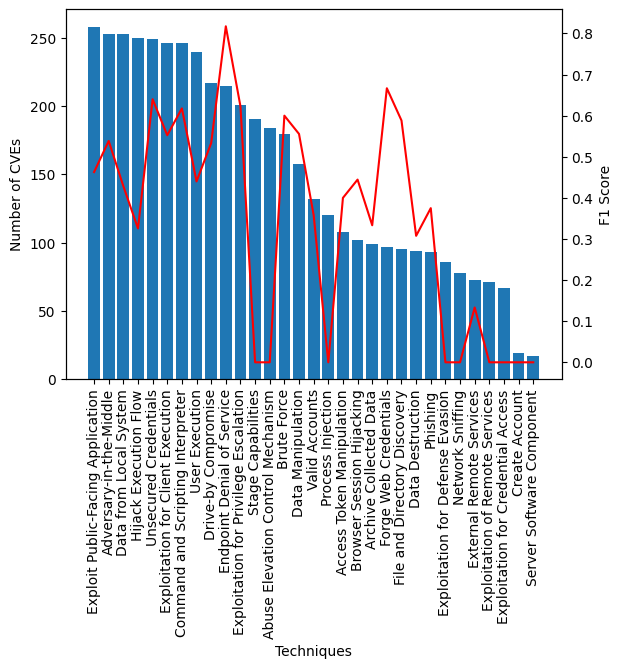

In [65]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


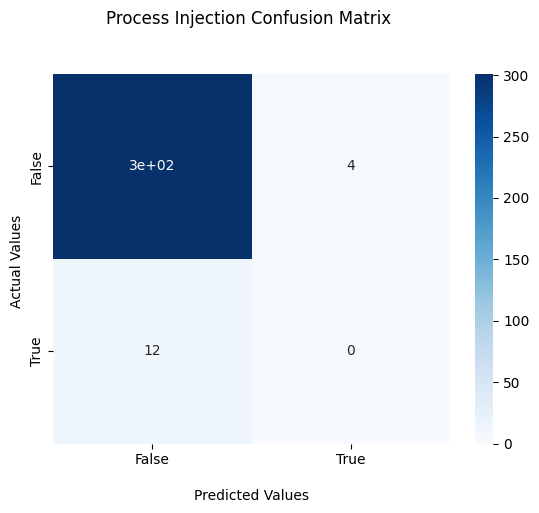

Access Token Manipulation


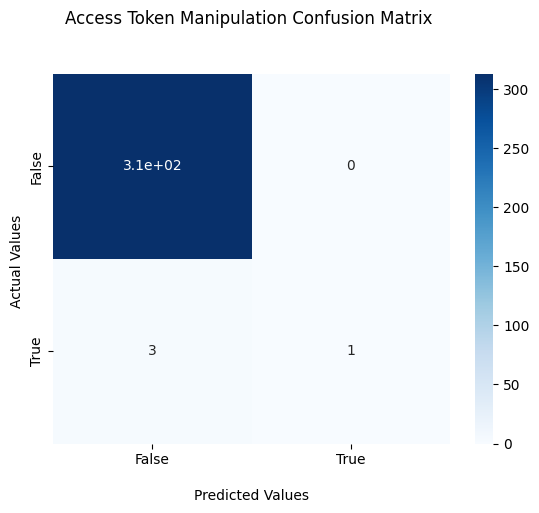

Hijack Execution Flow


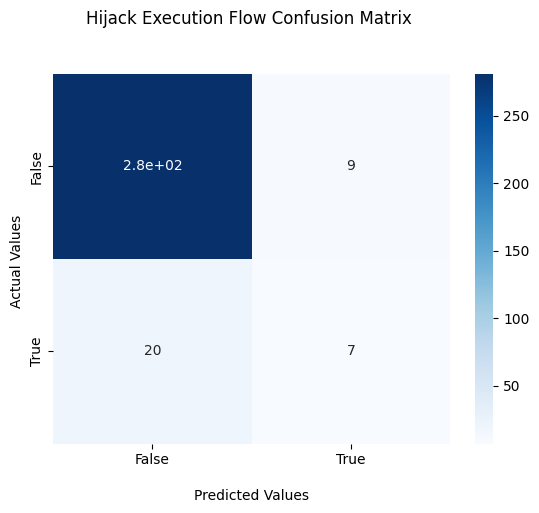

Data from Local System


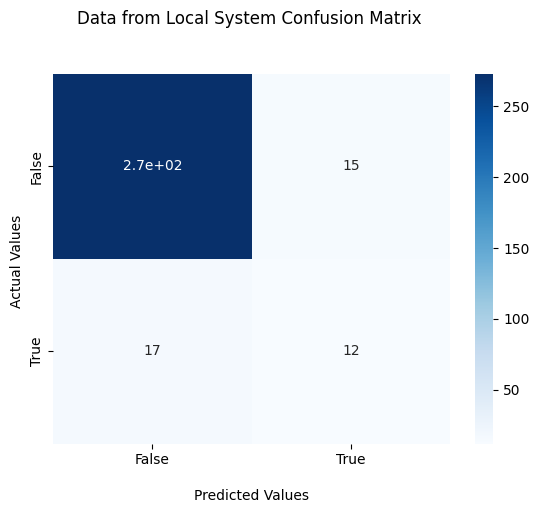

External Remote Services


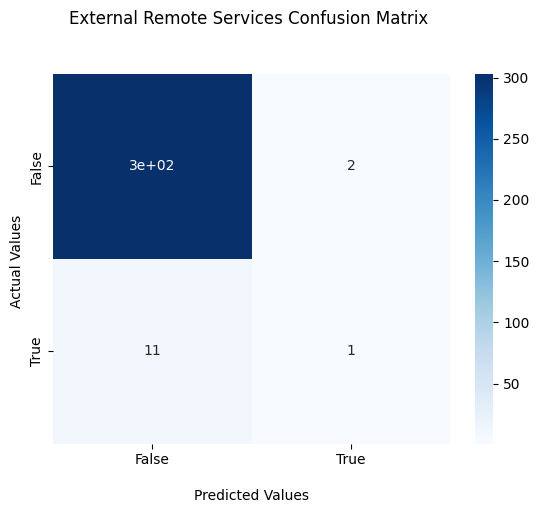

Data Manipulation


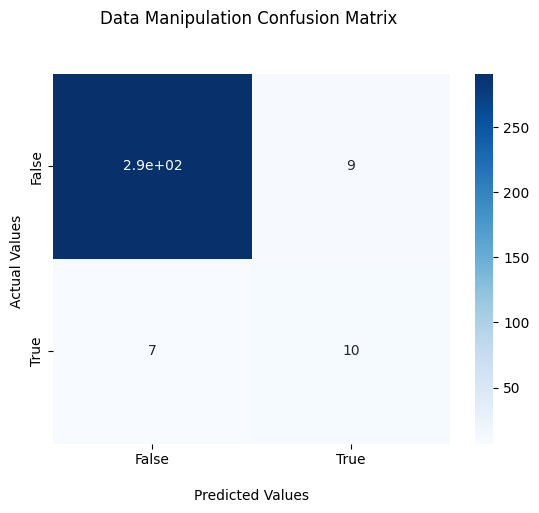

Network Sniffing


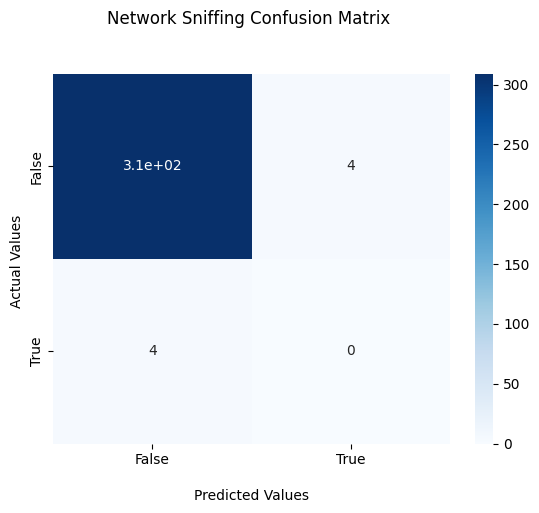

Exploitation for Privilege Escalation


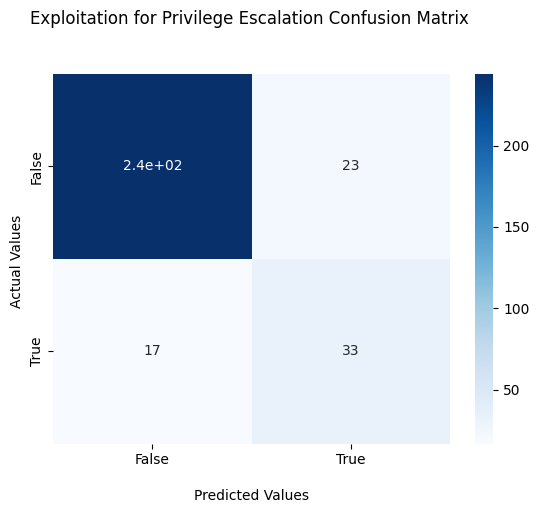

Command and Scripting Interpreter


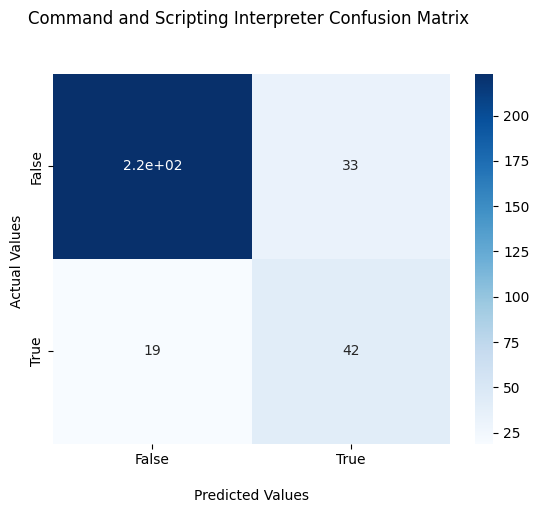

Phishing


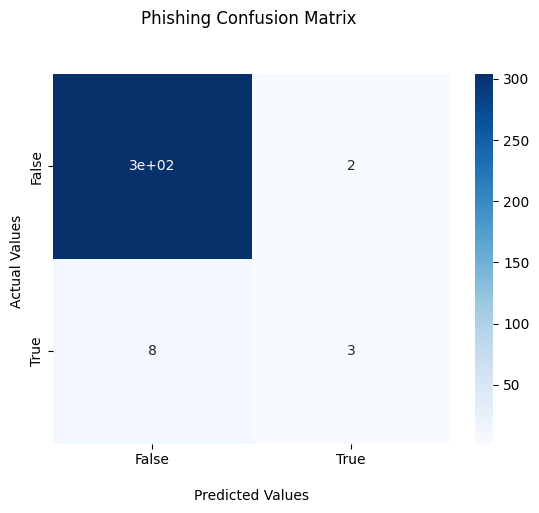

Server Software Component


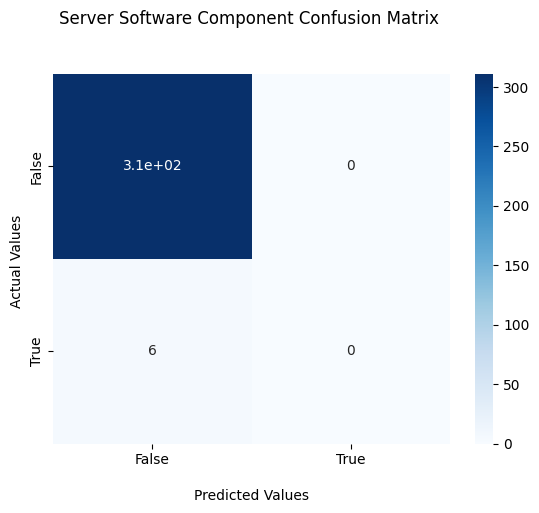

Archive Collected Data


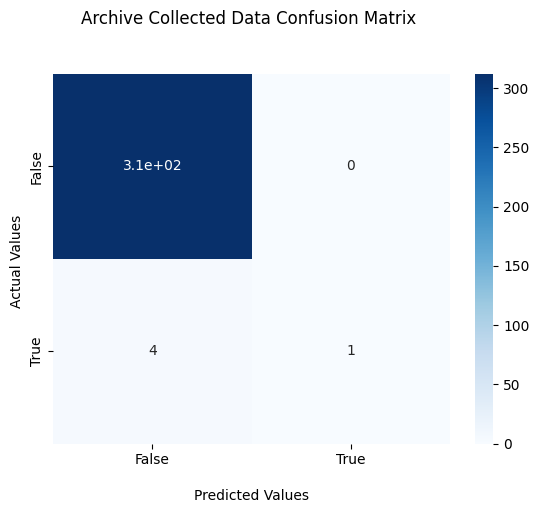

Data Destruction


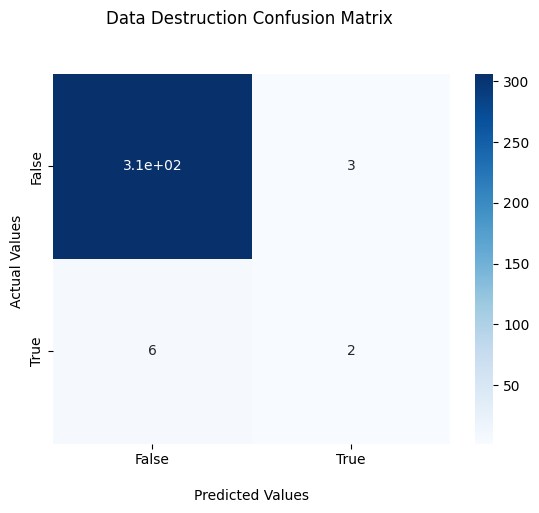

Browser Session Hijacking


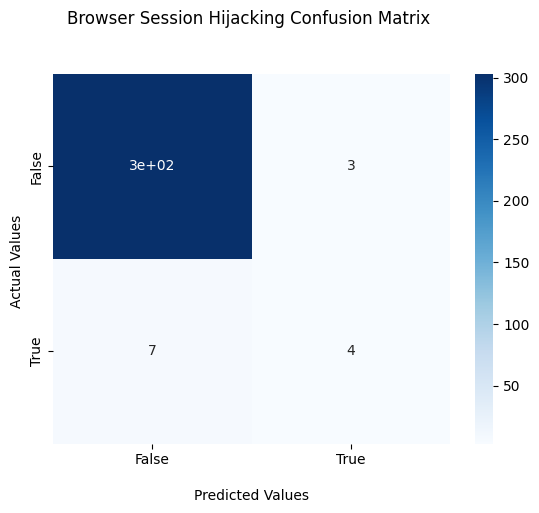

Exploitation for Credential Access


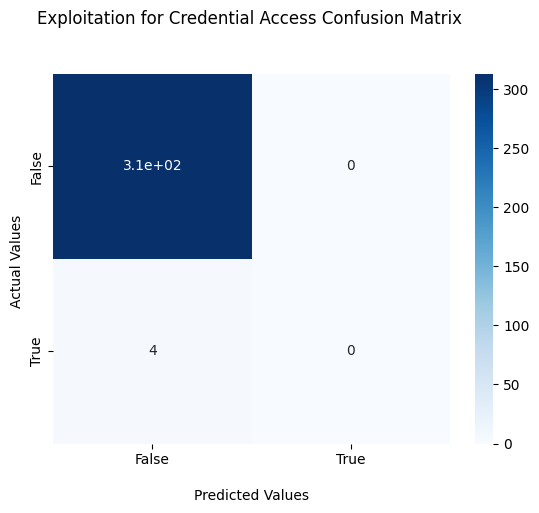

Abuse Elevation Control Mechanism


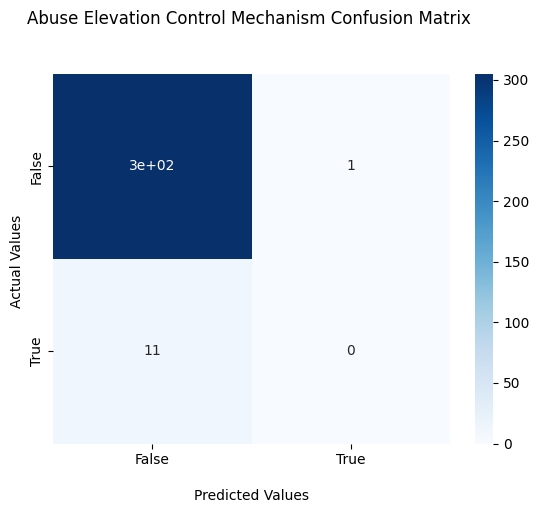

Adversary-in-the-Middle


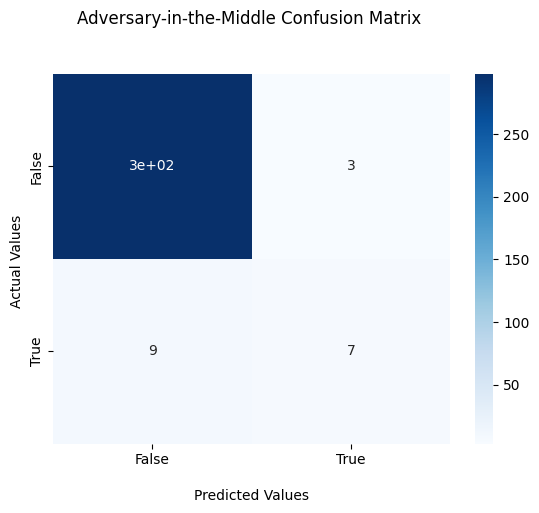

User Execution


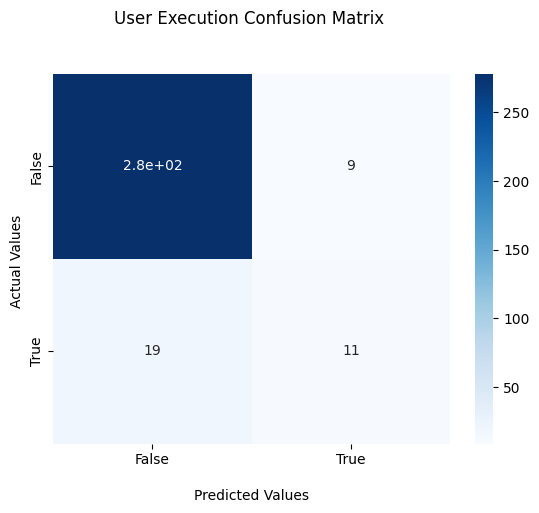

Unsecured Credentials


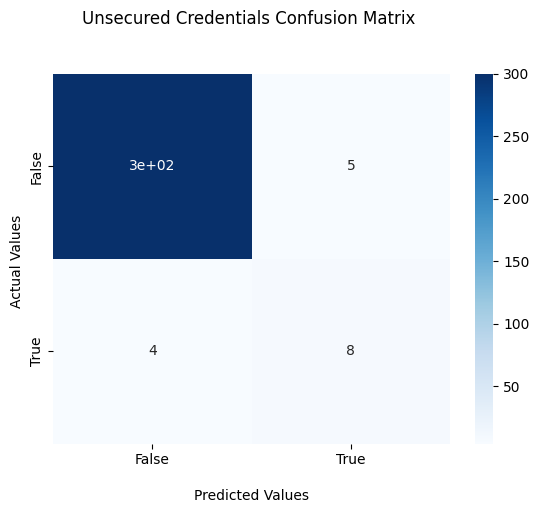

Brute Force


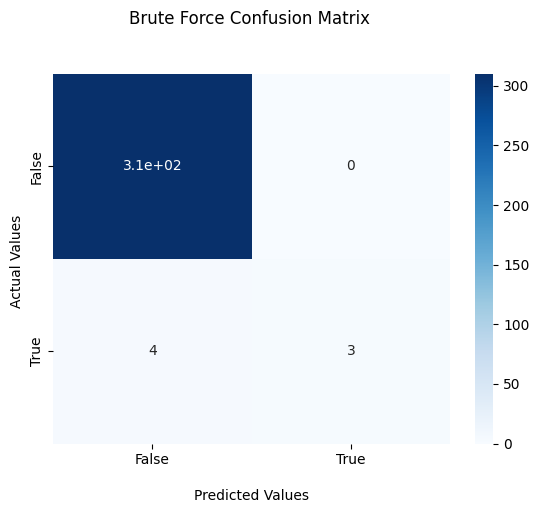

File and Directory Discovery


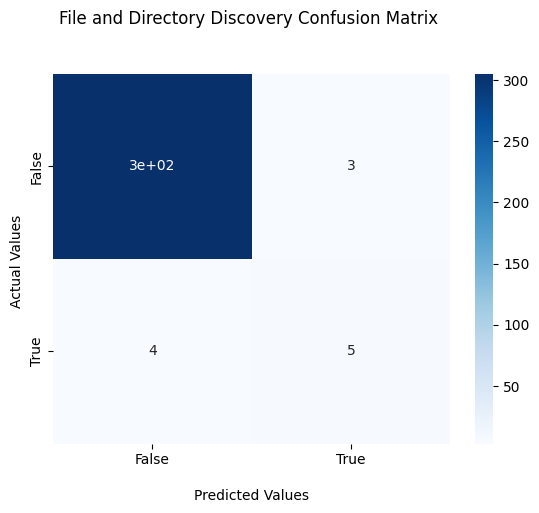

Valid Accounts


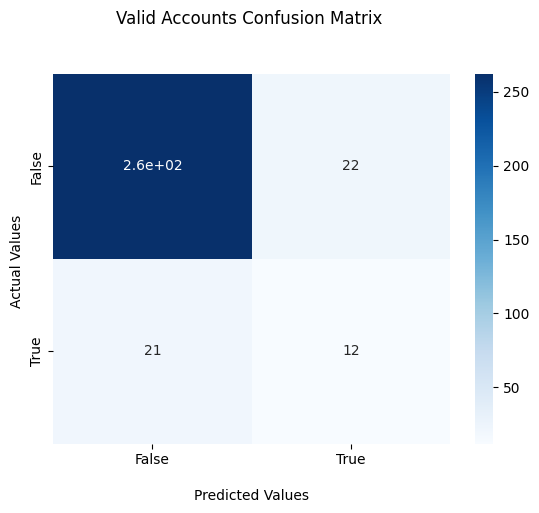

Exploitation for Defense Evasion


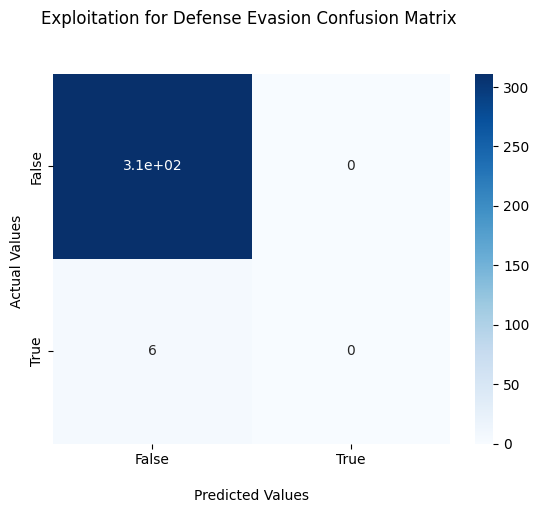

Create Account


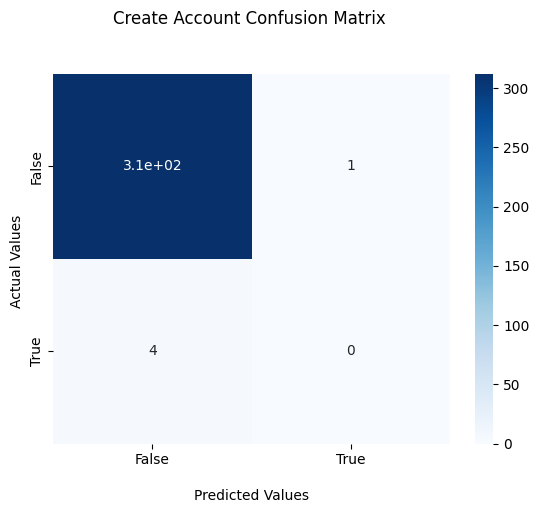

Endpoint Denial of Service


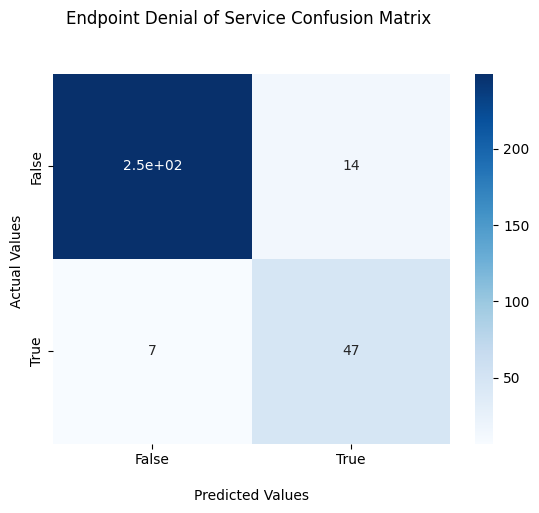

Drive-by Compromise


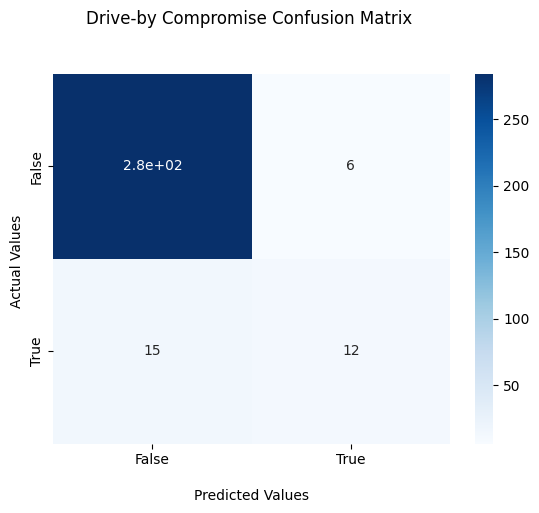

Exploitation for Client Execution


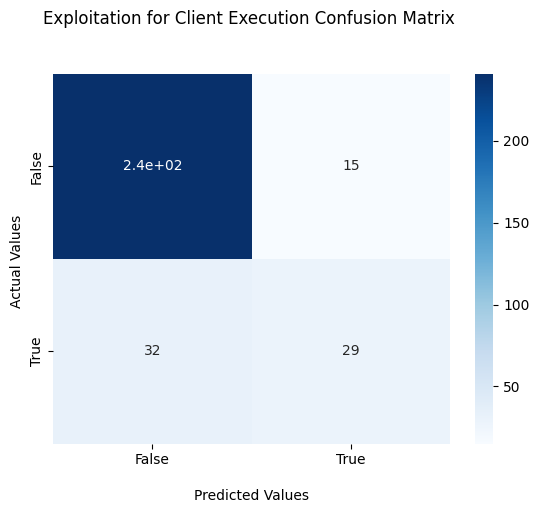

Exploitation of Remote Services


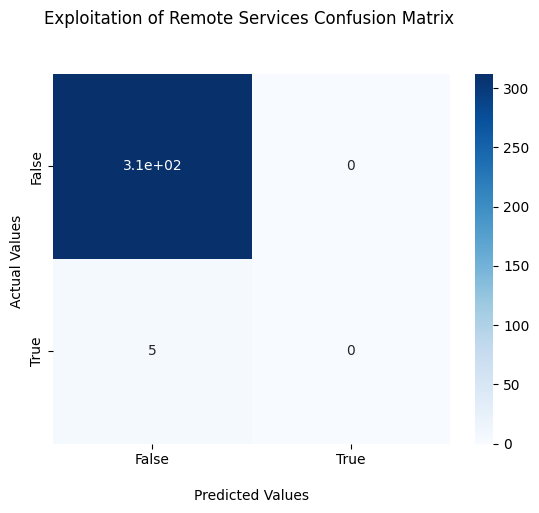

Stage Capabilities


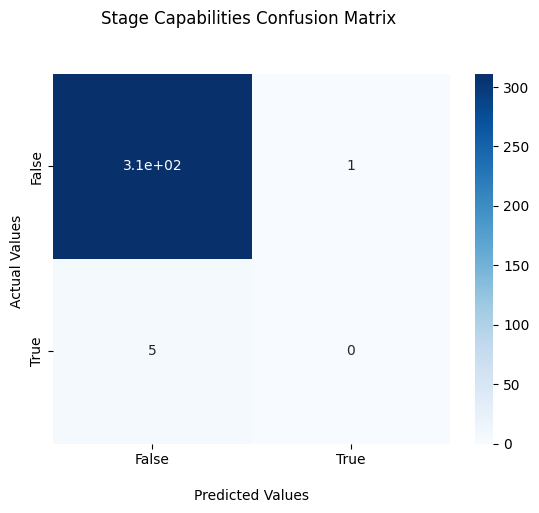

Exploit Public-Facing Application


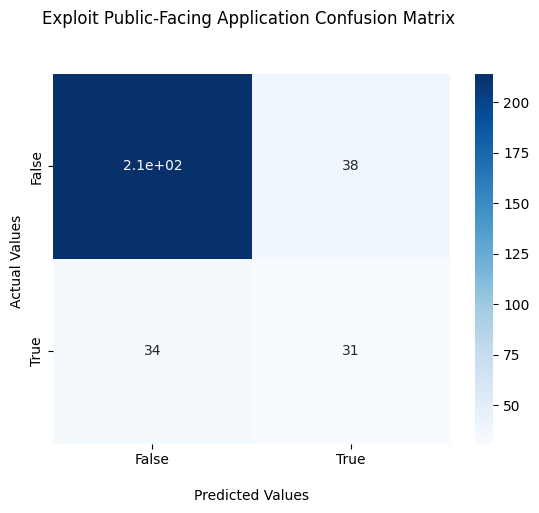

Forge Web Credentials


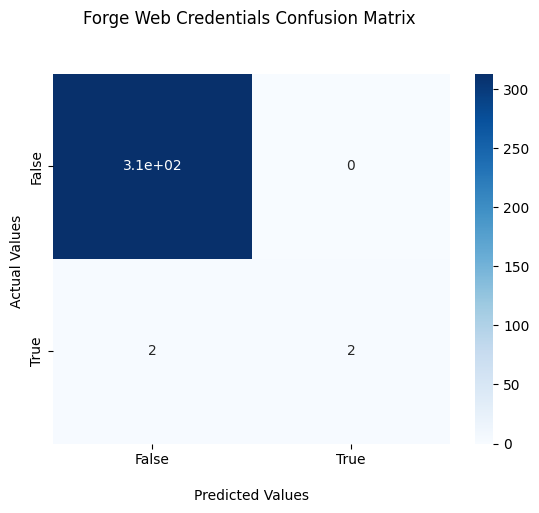

In [66]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])